In [1]:
import sys
print(sys.executable)

c:\Users\yiydg\Desktop\Vault_home\Projects(Work)\Sprint AI_14기\workspace\프로젝트_초급\.venv\Scripts\python.exe


In [2]:
#@title Import Module
import os
import cv2
import csv
import glob
import json
import random
import kagglehub
import numpy as np
import matplotlib.patches as patches
import matplotlib.pyplot as plt
import pandas as pd
import xml.etree.ElementTree as ET

import torch
import torchvision

from tqdm.auto import tqdm
from PIL import Image
from pathlib import Path
from collections import defaultdict, Counter
from torchvision import tv_tensors
from torchvision.transforms import v2
from torchvision.transforms import functional as F
from torch.utils.data import Dataset, DataLoader
from torchmetrics.detection.mean_ap import MeanAveragePrecision
from torchvision.models.detection import _utils as det_utils
from sklearn.model_selection import train_test_split
from sklearn.metrics import average_precision_score

In [3]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

In [4]:
#@title Image, Annotation 경로 설정
kagglehub.login()
path = kagglehub.competition_download("ai14-level-project")
path = os.path.join(path, "sprint_ai_project1_data")
print(path)

image_dir = glob.glob(os.path.join(path, "train_images", "*.png"))

annotation_dir = glob.glob(
    os.path.join(path, "train_annotations", "**", "*.json"),
    recursive=True
)

print(f"Train 이미지 수 : {len(image_dir)}, Annotation 수 : {len(annotation_dir)}")

C:\Users\yiydg\.cache\kagglehub\competitions\ai14-level-project\sprint_ai_project1_data
Train 이미지 수 : 232, Annotation 수 : 763


In [5]:
#Cell 4 수정(1:1 mapping 코드 -> 1:n mapping 코드)
#@title Image-Annotation Mapping (stem 기준)

# 이미지 stem -> 이미지 경로
image_stem_to_path = {
    os.path.splitext(os.path.basename(image_path))[0]: image_path
    for image_path in image_dir
}

# 이미지 stem -> 여러 annotation JSON 경로
stem_to_paths = defaultdict(list)

for annotation_path in annotation_dir:
    stem = os.path.splitext(os.path.basename(annotation_path))[0]
    stem_to_paths[stem].append(annotation_path)

# 이미지와 annotation이 모두 존재하는 stem만 사용
valid_stems = [
    stem
    for stem in stem_to_paths
    if stem in image_stem_to_path
]

# 매핑되지 않는 데이터 확인
images_without_annotation = (
    set(image_stem_to_path) - set(stem_to_paths)
)

annotations_without_image = (
    set(stem_to_paths) - set(image_stem_to_path)
)

print(f"Annotation이 없는 Train 이미지 수: {len(images_without_annotation)}")
print(f"Train 이미지가 없는 Annotation stem 수: {len(annotations_without_image)}")
print(f"매핑 가능한 이미지 수: {len(valid_stems)}")

Annotation이 없는 Train 이미지 수: 0
Train 이미지가 없는 Annotation stem 수: 0
매핑 가능한 이미지 수: 232


In [6]:
#@title Annotation 경로 매핑 (stem -> 여러 파일)
avg_per_stem = sum(len(v) for v in stem_to_paths.values()) / len(stem_to_paths)

print(
    f"고유 이미지 수: {len(stem_to_paths)}, "
    f"이미지당 평균 annotation 파일 수: {avg_per_stem:.2f}"
)

고유 이미지 수: 232, 이미지당 평균 annotation 파일 수: 3.29


In [7]:
#@title 이미지 단위 Annotation 병합

def build_image_records(valid_stems, stem_to_paths):
    image_records = {}
    category_id_to_name = {}

    for stem in valid_stems:
        img_info = None
        annotations = []

        for annotation_path in stem_to_paths[stem]:
            with open(annotation_path, "r", encoding="utf-8") as f:
                data = json.load(f)

            # 이미지 정보는 같은 stem의 JSON끼리 동일하므로 처음 한 번만 저장
            if img_info is None:
                img_info = data["images"][0]

            # 클래스 정보 저장
            for category in data["categories"]:
                category_id_to_name[category["id"]] = category["name"]

            # 같은 이미지에 속한 annotation들을 하나로 병합
            for ann in data["annotations"]:
                annotations.append({
                    "bbox": ann["bbox"],
                    "category_id": ann["category_id"],
                    "area": ann["area"],
                    "iscrowd": ann.get("iscrowd", 0)
                })

        image_records[stem] = {
            "file_name": img_info["file_name"],
            "width": img_info["width"],
            "height": img_info["height"],
            "annotations": annotations
        }

    return image_records, category_id_to_name


image_records, category_id_to_name = build_image_records(
    valid_stems,
    stem_to_paths
)

print(f"이미지 record 수: {len(image_records)}")
print(f"클래스 수: {len(category_id_to_name)}")

이미지 record 수: 232
클래스 수: 56


In [8]:
#@title 이미지 해상도 파악
sizes = set()
for img_path in image_dir[:50]:  # 200장이면 전수 조사해도 됨: image_dir 전체로
    with Image.open(img_path) as im:
        sizes.add(im.size)  # (width, height)

print(f"고유 해상도 종류 수: {len(sizes)}")
print(sizes if len(sizes) < 10 else list(sizes)[:10])

고유 해상도 종류 수: 1
{(976, 1280)}


In [9]:
#@title 폴더별 partial annotation 병합
def load_merged_annotation(paths):
    img_info = None
    boxes, labels, areas, iscrowd = [], [], [], []

    for p in paths:
        with open(p, "r", encoding="utf-8") as f:
            data = json.load(f)

        if img_info is None:
            img_info = data["images"][0]  # width/height/file_name은 모든 폴더에서 동일하다고 가정

        for ann in data["annotations"]:
            boxes.append(ann["bbox"])       # [x, y, w, h]
            labels.append(ann["category_id"])
            areas.append(ann["area"])
            iscrowd.append(ann.get("iscrowd", 0))

    return img_info, boxes, labels, areas, iscrowd

In [10]:
class_instance_count = Counter()      # 클래스별 annotation(알약 객체) 개수
class_image_count = defaultdict(set)  # 클래스별 등장하는 이미지(stem) 집합

for stem, paths in stem_to_paths.items():
    img_info, raw_boxes, raw_labels, areas, iscrowd = load_merged_annotation(paths)
    for cid in raw_labels:
        class_instance_count[cid] += 1
        class_image_count[cid].add(stem)

print(f"Train 데이터에 존재하는 고유 클래스 수: {len(class_instance_count)}\n")

for cid in sorted(class_instance_count.keys()):
    name = category_id_to_name[cid]
    print(f"category_id: {cid:>6} | 이름: {name:<20} | "
          f"객체 수: {class_instance_count[cid]:>4} | "
          f"등장 이미지 수: {len(class_image_count[cid]):>4}")

Train 데이터에 존재하는 고유 클래스 수: 56

category_id:   1900 | 이름: 보령부스파정 5mg           | 객체 수:   15 | 등장 이미지 수:   15
category_id:   2483 | 이름: 뮤테란캡슐 100mg          | 객체 수:    9 | 등장 이미지 수:    9
category_id:   3351 | 이름: 일양하이트린정 2mg          | 객체 수:  153 | 등장 이미지 수:  153
category_id:   3483 | 이름: 기넥신에프정(은행엽엑스)(수출용)   | 객체 수:   45 | 등장 이미지 수:   45
category_id:   3544 | 이름: 무코스타정(레바미피드)(비매품)    | 객체 수:    6 | 등장 이미지 수:    6
category_id:   3743 | 이름: 알드린정                 | 객체 수:    3 | 등장 이미지 수:    3
category_id:   3832 | 이름: 뉴로메드정(옥시라세탐)         | 객체 수:   20 | 등장 이미지 수:   20
category_id:   4543 | 이름: 에어탈정(아세클로페낙)         | 객체 수:    5 | 등장 이미지 수:    5
category_id:  12081 | 이름: 리렉스펜정 300mg/PTP      | 객체 수:    3 | 등장 이미지 수:    3
category_id:  12247 | 이름: 아빌리파이정 10mg          | 객체 수:    3 | 등장 이미지 수:    3
category_id:  12778 | 이름: 다보타민큐정 10mg/병        | 객체 수:    6 | 등장 이미지 수:    6
category_id:  13395 | 이름: 써스펜8시간이알서방정 650mg    | 객체 수:    3 | 등장 이미지 수:    3
category_id:  13900 | 이름: 에빅사정(메만틴염산염)(비매품)   

In [11]:
df = pd.DataFrame([
    {
        "category_id": cid,
        "name": category_id_to_name[cid],
        "instance_count": class_instance_count[cid],
        "image_count": len(class_image_count[cid])
    }
    for cid in sorted(class_instance_count.keys())
])
df = df.sort_values("instance_count", ascending=False).reset_index(drop=True)
df

,category_id,name,instance_count,image_count
0,3351,일양하이트린정 2mg,153,153
1,3483,기넥신에프정(은행엽엑스)(수출용),45,45
2,35206,아토젯정 10/40mg,37,37
3,16262,크레스토정 20mg,23,23
4,21325,아토르바정 10mg,22,22
5,16232,리피토정 20mg,21,21
6,20238,플라빅스정 75mg,20,20
7,3832,뉴로메드정(옥시라세탐),20,20
8,36637,로수젯정10/5밀리그램,19,19
9,29667,리바로정 4mg,18,18


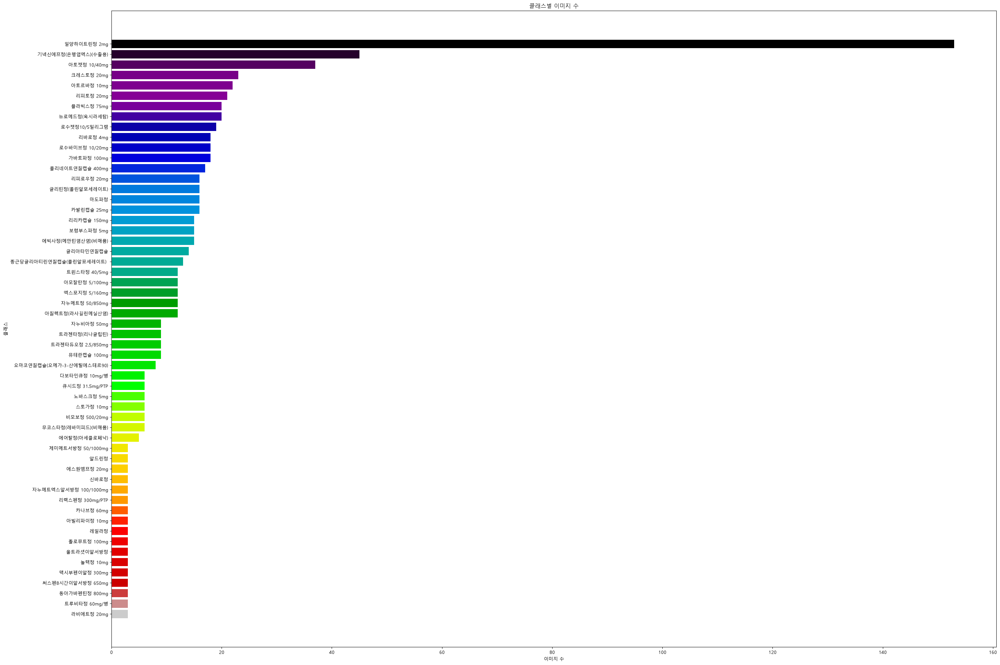

In [12]:
#@title 클래스별 이미지 수
# Windows 한글 폰트 설정 (맑은 고딕)
plt.rcParams['font.family'] = 'Malgun Gothic'

# 마이너스 기호 깨짐 방지
plt.rcParams['axes.unicode_minus'] = False

colors = plt.cm.nipy_spectral(np.linspace(0, 1, len(df)))

plt.figure(figsize=(30, 20))

plt.barh(
    df["name"],
    df["image_count"],
    color=colors
)

plt.xlabel("이미지 수")
plt.ylabel("클래스")
plt.title("클래스별 이미지 수")

plt.gca().invert_yaxis()  # df가 내림차순이면 큰 값이 위로 오게 함
plt.tight_layout();
plt.show();

In [13]:
#@title 클래스(category) 매핑 생성
def build_category_mapping(annotation_paths):
    category_id_to_name = {}
    for path in annotation_paths:
        with open(path, "r", encoding="utf-8") as f:
            data = json.load(f)
        for cat in data["categories"]:
            category_id_to_name[cat["id"]] = cat["name"]
    return category_id_to_name

category_id_to_name = build_category_mapping(annotation_dir)  # annotation_dir: glob으로 뽑은 json 경로 리스트
sorted_ids = sorted(category_id_to_name.keys())

category_to_label = {cid: i + 1 for i, cid in enumerate(sorted_ids)}  # 0 = background
label_to_category = {v: k for k, v in category_to_label.items()}
classes = [category_id_to_name[cid] for cid in sorted_ids]
num_classes = len(classes)

print(f"클래스 수(background 미포함): {num_classes}")

클래스 수(background 미포함): 56


In [14]:
# 기존 valid_stems 변수와 충돌하지 않도록 RTMDet 전용 변수 사용
all_stems = sorted(image_records.keys())

rtmdet_train_stems, rtmdet_val_stems = train_test_split(
    all_stems,
    test_size=0.2,
    random_state=42,
    shuffle=True
)

# 이 폴더째 PC로 옮기면 됨
coco_dir = Path("rtmdet_annotations")
coco_dir.mkdir(exist_ok=True)

print(f"RTMDet Train 이미지 수: {len(rtmdet_train_stems)}")
print(f"RTMDet Validation 이미지 수: {len(rtmdet_val_stems)}")

RTMDet Train 이미지 수: 185
RTMDet Validation 이미지 수: 47


In [15]:
sorted_ids = sorted(category_id_to_name.keys())

def make_coco_json(stems, output_path):
    coco_images = []
    coco_annotations = []
    annotation_id = 1

    for image_id, stem in enumerate(stems, start=1):
        record = image_records[stem]

        coco_images.append({
            "id": image_id,
            "file_name": record["file_name"],
            "width": record["width"],
            "height": record["height"],
        })

        for ann in record["annotations"]:
            x, y, w, h = map(float, ann["bbox"])

            if w <= 0 or h <= 0:
                continue

            coco_annotations.append({
                "id": annotation_id,
                "image_id": image_id,
                "category_id": int(ann["category_id"]),
                "bbox": [x, y, w, h],
                "area": float(ann.get("area", w * h)),
                "iscrowd": int(ann.get("iscrowd", 0)),
            })
            annotation_id += 1

    coco_data = {
        "images": coco_images,
        "annotations": coco_annotations,
        "categories": [
            {"id": int(cid), "name": category_id_to_name[cid]}
            for cid in sorted_ids
        ],
    }

    with open(output_path, "w", encoding="utf-8") as f:
        json.dump(coco_data, f, ensure_ascii=False, indent=2)


train_ann_file = coco_dir / "train_coco.json"
val_ann_file = coco_dir / "val_coco.json"

make_coco_json(rtmdet_train_stems, train_ann_file)
make_coco_json(rtmdet_val_stems, val_ann_file)

print(f"생성 완료: {train_ann_file}")
print(f"생성 완료: {val_ann_file}")

생성 완료: rtmdet_annotations\train_coco.json
생성 완료: rtmdet_annotations\val_coco.json


In [16]:
for ann_file in [train_ann_file, val_ann_file]:
    with open(ann_file, "r", encoding="utf-8") as f:
        coco = json.load(f)

    print(
        f"\n{ann_file.name}"
        f"\n- images: {len(coco['images'])}"
        f"\n- annotations: {len(coco['annotations'])}"
        f"\n- categories: {len(coco['categories'])}"
    )


train_coco.json
- images: 185
- annotations: 611
- categories: 56

val_coco.json
- images: 47
- annotations: 152
- categories: 56


**다음은 PC(GPU가 존재하는 환경)에서만 실행해야 합니다.**

In [17]:
# PC GPU 환경에서만 실행
# PyTorch CUDA 환경이 먼저 준비되어 있어야 함

%pip install -q -U openmim pycocotools
%pip install -q -U mmengine
%pip install -q -U "mmcv>=2.0.0,<2.1.0"
%pip install -q -U mmdet

%pip install -q -U openmim
!mim download mmdet --config rtmdet_l_8xb32-300e_coco --dest checkpoints

Note: you may need to restart the kernel to use updated packages.
Note: you may need to restart the kernel to use updated packages.


  You can safely remove it manually.
  You can safely remove it manually.


Note: you may need to restart the kernel to use updated packages.


  error: subprocess-exited-with-error
  
  × Getting requirements to build wheel did not run successfully.
  │ exit code: 1
  ╰─> [21 lines of output]
      Traceback (most recent call last):
        File "c:\Users\yiydg\Desktop\Vault_home\Projects(Work)\Sprint AI_14湲\xb0\workspace\\xed봽濡쒖젥\xed듃_珥덇툒\.venv\Lib\site-packages\pip\_vendor\pyproject_hooks\_in_process\_in_process.py", line 389, in <module>
          main()
        File "c:\Users\yiydg\Desktop\Vault_home\Projects(Work)\Sprint AI_14湲\xb0\workspace\\xed봽濡쒖젥\xed듃_珥덇툒\.venv\Lib\site-packages\pip\_vendor\pyproject_hooks\_in_process\_in_process.py", line 373, in main
          json_out["return_val"] = hook(**hook_input["kwargs"])
                                   ^^^^^^^^^^^^^^^^^^^^^^^^^^^^
        File "c:\Users\yiydg\Desktop\Vault_home\Projects(Work)\Sprint AI_14湲\xb0\workspace\\xed봽濡쒖젥\xed듃_珥덇툒\.venv\Lib\site-packages\pip\_vendor\pyproject_hooks\_in_process\_in_process.py", line 143, in get_requires_for_build_wheel
          r

Note: you may need to restart the kernel to use updated packages.
Note: you may need to restart the kernel to use updated packages.
processing rtmdet_l_8xb32-300e_coco...
rtmdet_l_8xb32-300e_coco_20220719_112030-5a0be7c4.pth exists in c:\Users\yiydg\Desktop\Vault_home\Projects(Work)\Sprint AI_14기\workspace\beginner-team-project\checkpoints
Successfully dumped rtmdet_l_8xb32-300e_coco.py to c:\Users\yiydg\Desktop\Vault_home\Projects(Work)\Sprint AI_14기\workspace\beginner-team-project\checkpoints


**"여기까지 돌린 후 Kernel을 재시작해야 합니다."**

In [18]:
#@title GPU 환경 전용: MMDetection import 및 모듈 등록

from mmengine.config import Config
from mmengine.runner import Runner
from mmengine.hooks import Hook
from mmdet.utils import register_all_modules

# RTMDet, CocoDataset 등의 MMDetection 모듈을 registry에 등록
register_all_modules(init_default_scope=True)

In [19]:
import sys
print(sys.executable)

c:\Users\yiydg\Desktop\Vault_home\Projects(Work)\Sprint AI_14기\workspace\프로젝트_초급\.venv\Scripts\python.exe


In [20]:
import sys
print(sys.executable)

c:\Users\yiydg\Desktop\Vault_home\Projects(Work)\Sprint AI_14기\workspace\프로젝트_초급\.venv\Scripts\python.exe


In [21]:
# PC에서 설치 셀 실행 후 kernel 재시작 → 이 셀부터 실행
assert torch.cuda.is_available(), "NVIDIA GPU / CUDA PyTorch 환경이 아닙니다."

device = "cuda:0"
print("GPU:", torch.cuda.get_device_name(0))
print("CUDA:", torch.version.cuda)

GPU: NVIDIA GeForce GTX 1070
CUDA: 12.1


In [22]:
#@title 개별 Annotation JSON -> 하나의 COCO 포맷으로 병합

import json
import os

merged_images = []
merged_annotations = []
categories_dict = {}  # category_id -> category dict (중복 제거용)

next_image_id = 1
next_ann_id = 1

for ann_path in tqdm(annotation_dir, desc="병합 중"):
    with open(ann_path, "r", encoding="utf-8") as f:
        data = json.load(f)

    # 이 파일 안의 원래 image_id -> 새로 부여할 image_id 매핑
    old_to_new_img_id = {}

    for img in data["images"]:
        old_id = img["id"]
        img["id"] = next_image_id
        old_to_new_img_id[old_id] = next_image_id
        merged_images.append(img)
        next_image_id += 1

    for ann in data["annotations"]:
        ann["id"] = next_ann_id
        ann["image_id"] = old_to_new_img_id[ann["image_id"]]
        merged_annotations.append(ann)
        next_ann_id += 1

    for cat in data["categories"]:
        categories_dict[cat["id"]] = cat  # 같은 id면 덮어써도 내용 동일

merged_categories = list(categories_dict.values())

coco_format = {
    "images": merged_images,
    "type": "instances",
    "annotations": merged_annotations,
    "categories": merged_categories,
}

# 저장 경로 (config에서 기대하는 그 경로)
output_dir = os.path.join(path, "rtmdet_annotations")
os.makedirs(output_dir, exist_ok=True)
output_path = os.path.join(output_dir, "train_coco.json")

with open(output_path, "w", encoding="utf-8") as f:
    json.dump(coco_format, f, ensure_ascii=False)

print(f"이미지 수: {len(merged_images)}, annotation 수: {len(merged_annotations)}, 클래스 수: {len(merged_categories)}")
print(f"저장 완료: {output_path}")

병합 중:   0%|          | 0/763 [00:00<?, ?it/s]

이미지 수: 763, annotation 수: 763, 클래스 수: 56
저장 완료: C:\Users\yiydg\.cache\kagglehub\competitions\ai14-level-project\sprint_ai_project1_data\rtmdet_annotations\train_coco.json


In [23]:
# 원본 데이터 다운로드
import kagglehub
import json
from sklearn.model_selection import train_test_split

kagglehub.login()
path = kagglehub.competition_download("ai14-level-project")
path = os.path.join(path, "sprint_ai_project1_data")

coco_dir = Path(path) / "rtmdet_annotations"
merged_ann_file = coco_dir / "train_coco.json"
train_ann_file = coco_dir / "train_coco.json"
val_ann_file = coco_dir / "val_coco.json"

assert merged_ann_file.exists(), (
    f"{merged_ann_file} 이 없습니다. 먼저 개별 JSON -> COCO 병합 스크립트를 실행하세요."
)

with open(merged_ann_file, "r", encoding="utf-8") as f:
    coco_format = json.load(f)

# val_coco.json이 아직 없으면 train/val로 나눠서 새로 생성 (이미지 단위 분할)
if not val_ann_file.exists():
    images = coco_format["images"]
    annotations = coco_format["annotations"]
    categories = coco_format["categories"]

    train_imgs, val_imgs = train_test_split(
        images, test_size=0.15, random_state=42
    )

    train_img_ids = {img["id"] for img in train_imgs}
    val_img_ids = {img["id"] for img in val_imgs}

    train_anns = [a for a in annotations if a["image_id"] in train_img_ids]
    val_anns = [a for a in annotations if a["image_id"] in val_img_ids]

    train_coco = {
        "images": train_imgs, "type": "instances",
        "annotations": train_anns, "categories": categories,
    }
    val_coco = {
        "images": val_imgs, "type": "instances",
        "annotations": val_anns, "categories": categories,
    }

    with open(train_ann_file, "w", encoding="utf-8") as f:
        json.dump(train_coco, f, ensure_ascii=True)
    with open(val_ann_file, "w", encoding="utf-8") as f:
        json.dump(val_coco, f, ensure_ascii=True)

    print(f"train {len(train_imgs)}장 / val {len(val_imgs)}장으로 분할 완료")
else:
    print("val_coco.json이 이미 존재합니다. 분할을 건너뜁니다.")

# val_coco.json 존재 여부와 무관하게, train/val 두 파일 모두 항상 ASCII-safe로 재저장
# (인코딩 문제 재발 방지)
for f_path in (train_ann_file, val_ann_file):
    with open(f_path, "r", encoding="utf-8") as f:
        _data = json.load(f)
    with open(f_path, "w", encoding="utf-8") as f:
        json.dump(_data, f, ensure_ascii=True)

assert train_ann_file.exists(), "train_coco.json 파일이 없습니다."
assert val_ann_file.exists(), "val_coco.json 파일이 없습니다."

# 학습에 쓸 train_coco.json 기준으로 클래스 목록 로드
with open(train_ann_file, "r", encoding="utf-8") as f:
    coco_format = json.load(f)

categories = sorted(coco_format["categories"], key=lambda x: x["id"])
classes = tuple(category["name"] for category in categories)
num_classes = len(classes)

print("데이터 경로:", path)
print("클래스 수:", num_classes)
print("클래스:", classes)

val_coco.json이 이미 존재합니다. 분할을 건너뜁니다.
데이터 경로: C:\Users\yiydg\.cache\kagglehub\competitions\ai14-level-project\sprint_ai_project1_data
클래스 수: 56
클래스: ('보령부스파정 5mg', '뮤테란캡슐 100mg', '일양하이트린정 2mg', '기넥신에프정(은행엽엑스)(수출용)', '무코스타정(레바미피드)(비매품)', '알드린정', '뉴로메드정(옥시라세탐)', '에어탈정(아세클로페낙)', '리렉스펜정 300mg/PTP', '아빌리파이정 10mg', '다보타민큐정 10mg/병', '써스펜8시간이알서방정 650mg', '에빅사정(메만틴염산염)(비매품)', '리피토정 20mg', '크레스토정 20mg', '가바토파정 100mg', '동아가바펜틴정 800mg', '오마코연질캡슐(오메가-3-산에틸에스테르90)', '리리카캡슐 150mg', '종근당글리아티린연질캡슐(콜린알포세레이트)\xa0', '콜리네이트연질캡슐 400mg', '트루비타정 60mg/병', '스토가정 10mg', '노바스크정 5mg', '마도파정', '플라빅스정 75mg', '엑스포지정 5/160mg', '아토르바정 10mg', '라비에트정 20mg', '리피로우정 20mg', '자누비아정 50mg', '맥시부펜이알정 300mg', '놀텍정 10mg', '자누메트정 50/850mg', '큐시드정 31.5mg/PTP', '아모잘탄정 5/100mg', '트윈스타정 40/5mg', '카나브정 60mg', '울트라셋이알서방정', '졸로푸트정 100mg', '트라젠타정(리나글립틴)', '비모보정 500/20mg', '레일라정', '리바로정 4mg', '트라젠타듀오정 2.5/850mg', '아질렉트정(라사길린메실산염)', '자누메트엑스알서방정 100/1000mg', '글리아타민연질캡슐', '신바로정', '에스원엠프정 20mg', '글리틴정(콜린알포세레이트)', '제미메트서방정 50/1000mg', '아토젯정 10/40

In [32]:
# RTMDet-L config와 COCO 사전학습 가중치
config_file = glob.glob(
    "checkpoints/rtmdet_l_8xb32-300e_coco*.py"
)[0]

checkpoint_file = glob.glob(
    "checkpoints/rtmdet_l_8xb32-300e_coco*.pth"
)[0]

cfg = Config.fromfile(config_file)

cfg.load_from = checkpoint_file
cfg.work_dir = "work_dirs/rtmdet_l_pill"

# COCO 80개 클래스 head → 현재 데이터의 56개 클래스 head
cfg.model.bbox_head.num_classes = num_classes

# 사전학습 backbone 전체 fine-tuning
cfg.model.backbone.frozen_stages = -1
cfg.model.backbone.norm_eval = False

# GPU 메모리 부족 시 1로 낮추고, 모델은 L을 유지
batch_size = 2
num_epochs = 50

dataset_metainfo = dict(classes=classes)

# COCO JSON의 file_name 형태에 맞는 이미지 경로 자동 결정
sample_file_name = coco_format["images"][0]["file_name"]

if (Path(path) / sample_file_name).is_file():
    image_prefix = ""
elif (Path(path) / "train_images" / sample_file_name).is_file():
    image_prefix = "train_images/"
else:
    raise FileNotFoundError(
        f"COCO JSON의 이미지 경로를 찾을 수 없습니다: {sample_file_name}"
    )

print(f"COCO 예시 file_name: {sample_file_name}")
print(f"적용할 image prefix: {image_prefix}")

for loader_name, ann_file, is_train in [
    ("train_dataloader", train_ann_file, True),
    ("val_dataloader", val_ann_file, False),
    ("test_dataloader", val_ann_file, False),
]:
    loader_cfg = cfg[loader_name]

    loader_cfg.batch_size = batch_size if is_train else 1
    loader_cfg.num_workers = 0
    loader_cfg.persistent_workers = False

    loader_cfg.dataset.type = "CocoDataset"
    loader_cfg.dataset.data_root = path
    loader_cfg.dataset.ann_file = str(ann_file)
    loader_cfg.dataset.data_prefix = dict(img=image_prefix)
    loader_cfg.dataset.metainfo = dataset_metainfo

cfg.val_evaluator.ann_file = str(val_ann_file)
cfg.test_evaluator.ann_file = str(val_ann_file)

# RTMDet 기본 batch=256 기준 learning rate를 현재 batch에 맞춰 조정
base_lr = 0.004 * batch_size / 256
cfg.optim_wrapper.optimizer.lr = base_lr
cfg.auto_scale_lr.enable = False

cfg.train_cfg.max_epochs = num_epochs
cfg.train_cfg.val_interval = 1

# warm-up + cosine learning-rate schedule
cfg.param_scheduler[0].end = 300
cfg.param_scheduler[1].begin = num_epochs // 2
cfg.param_scheduler[1].end = num_epochs
cfg.param_scheduler[1].T_max = num_epochs // 2
cfg.param_scheduler[1].eta_min = base_lr * 0.05

# 마지막 10 epoch에는 Mosaic/MixUp를 끄는 RTMDet 기본 동작
for hook in cfg.custom_hooks:
    if hook["type"] == "PipelineSwitchHook":
        hook["switch_epoch"] = num_epochs - 10

cfg.default_hooks.checkpoint.interval = 1
cfg.default_hooks.checkpoint.save_best = "coco/bbox_mAP"
cfg.default_hooks.checkpoint.rule = "greater"
cfg.default_hooks.checkpoint.max_keep_ckpts = 2

COCO 예시 file_name: K-001900-016548-019607-029451_0_2_0_2_70_000_200.png
적용할 image prefix: train_images/


In [33]:
#@title 평가 지표: mAP@[0.75:0.95] + 매 epoch 검증

IOU_THRS = [0.75, 0.80, 0.85, 0.90, 0.95]

cfg.train_cfg.val_interval = 1
cfg.val_evaluator.iou_thrs = IOU_THRS
cfg.test_evaluator.iou_thrs = IOU_THRS

# coco/bbox_mAP = 이제 mAP@[0.75:0.95]
cfg.default_hooks.checkpoint.save_best = "coco/bbox_mAP"
cfg.default_hooks.checkpoint.rule = "greater"

# mAP 설정까지 모두 반영된 최종 config 저장
cfg.dump("rtmdet_l_pill_config.py")

print(cfg.pretty_text[:3000])

auto_scale_lr = dict(base_batch_size=16, enable=False)
backend_args = None
base_lr = 0.004
custom_hooks = [
    dict(
        ema_type='ExpMomentumEMA',
        momentum=0.0002,
        priority=49,
        type='EMAHook',
        update_buffers=True),
    dict(
        switch_epoch=40,
        switch_pipeline=[
            dict(backend_args=None, type='LoadImageFromFile'),
            dict(type='LoadAnnotations', with_bbox=True),
            dict(
                keep_ratio=True,
                ratio_range=(
                    0.1,
                    2.0,
                ),
                scale=(
                    640,
                    640,
                ),
                type='RandomResize'),
            dict(crop_size=(
                640,
                640,
            ), type='RandomCrop'),
            dict(type='YOLOXHSVRandomAug'),
            dict(prob=0.5, type='RandomFlip'),
            dict(
                pad_val=dict(img=(
                    114,
         

In [34]:
#@title tqdm 학습/검증 진행률 + epoch별 mAP 출력
map_history = []

class TqdmMapHook(Hook):
    priority = "LOW"

    def before_train_epoch(self, runner):
        self.train_bar = tqdm(
            total=len(runner.train_dataloader),
            desc=f"Epoch {runner.epoch + 1}/{runner.max_epochs} | Train",
            leave=False,
        )

    def after_train_iter(self, runner, batch_idx, data_batch=None, outputs=None):
        if outputs is not None and "loss" in outputs:
            loss = outputs["loss"]
            loss = loss.detach().float().cpu().item() if torch.is_tensor(loss) else float(loss)
            self.train_bar.set_postfix(loss=f"{loss:.4f}")

        self.train_bar.update(1)

    def after_train_epoch(self, runner):
        self.train_bar.close()

    def before_val_epoch(self, runner):
        self.val_bar = tqdm(
            total=len(runner.val_dataloader),
            desc=f"Epoch {runner.epoch + 1}/{runner.max_epochs} | Valid",
            leave=False,
        )

    def after_val_iter(self, runner, batch_idx, data_batch=None, outputs=None):
        self.val_bar.update(1)

    def after_val_epoch(self, runner, metrics=None):
        self.val_bar.close()

        score = None
        if metrics is not None:
            score = metrics.get("coco/bbox_mAP")

        if score is not None:
            map_history.append(score)
            
            tqdm.write(
                f"Epoch {runner.epoch + 1:03d} | "
                f"mAP@[0.75:0.95] = {score:.4f}"
            )

        

runner = Runner.from_cfg(cfg)
runner.register_hook(TqdmMapHook(), priority="LOW")
runner.train()

09/15 21:02:16 - mmengine - INFO - 
------------------------------------------------------------
System environment:
    sys.platform: win32
    Python: 3.11.9 (tags/v3.11.9:de54cf5, Apr  2 2024, 10:12:12) [MSC v.1938 64 bit (AMD64)]
    CUDA available: True
    MUSA available: False
    numpy_random_seed: 196912867
    GPU 0: NVIDIA GeForce GTX 1070
    CUDA_HOME: None
    GCC: n/a
    PyTorch: 2.1.0+cu121
    PyTorch compiling details: PyTorch built with:
  - C++ Version: 199711
  - MSVC 192930151
  - Intel(R) Math Kernel Library Version 2020.0.2 Product Build 20200624 for Intel(R) 64 architecture applications
  - Intel(R) MKL-DNN v3.1.1 (Git Hash 64f6bcbcbab628e96f33a62c3e975f8535a7bde4)
  - OpenMP 2019
  - LAPACK is enabled (usually provided by MKL)
  - CPU capability usage: AVX2
  - CUDA Runtime 12.1
  - NVCC architecture flags: -gencode;arch=compute_50,code=sm_50;-gencode;arch=compute_60,code=sm_60;-gencode;arch=compute_61,code=sm_61;-gencode;arch=compute_70,code=sm_70;-gencode;a

c:\Users\yiydg\Desktop\Vault_home\Projects(Work)\Sprint AI_14기\workspace\프로젝트_초급\.venv\Lib\site-packages\mmengine\utils\manager.py:113: UserWarning: <class 'mmdet.visualization.local_visualizer.DetLocalVisualizer'> instance named of visualizer has been created, the method `get_instance` should not accept any other arguments
  warnings.warn(


09/15 21:02:19 - mmengine - INFO - Distributed training is not used, all SyncBatchNorm (SyncBN) layers in the model will be automatically reverted to BatchNormXd layers if they are used.
09/15 21:02:19 - mmengine - INFO - Hooks will be executed in the following order:
before_run:
(VERY_HIGH   ) RuntimeInfoHook                    
(49          ) EMAHook                            
(BELOW_NORMAL) LoggerHook                         
 -------------------- 
after_load_checkpoint:
(49          ) EMAHook                            
 -------------------- 
before_train:
(VERY_HIGH   ) RuntimeInfoHook                    
(49          ) EMAHook                            
(NORMAL      ) IterTimerHook                      
(VERY_LOW    ) CheckpointHook                     
 -------------------- 
before_train_epoch:
(VERY_HIGH   ) RuntimeInfoHook                    
(NORMAL      ) IterTimerHook                      
(NORMAL      ) DistSamplerSeedHook                
(NORMAL      ) PipelineSwitchHoo

Epoch 1/50 | Train:   0%|          | 0/382 [00:00<?, ?it/s]

c:\Users\yiydg\Desktop\Vault_home\Projects(Work)\Sprint AI_14기\workspace\프로젝트_초급\.venv\Lib\site-packages\torch\functional.py:504: UserWarning: torch.meshgrid: in an upcoming release, it will be required to pass the indexing argument. (Triggered internally at ..\aten\src\ATen\native\TensorShape.cpp:3527.)
  return _VF.meshgrid(tensors, **kwargs)  # type: ignore[attr-defined]


09/15 21:02:59 - mmengine - INFO - Epoch(train)  [1][ 50/382]  base_lr: 5.1215e-06 lr: 5.1215e-06  eta: 3:43:59  time: 0.7055  data_time: 0.2084  memory: 3626  loss: 3.0092  loss_cls: 2.4573  loss_bbox: 0.5518
09/15 21:03:32 - mmengine - INFO - Epoch(train)  [1][100/382]  base_lr: 1.0347e-05 lr: 1.0347e-05  eta: 3:35:05  time: 0.6530  data_time: 0.1906  memory: 3629  loss: 3.0402  loss_cls: 2.5022  loss_bbox: 0.5380
09/15 21:04:04 - mmengine - INFO - Epoch(train)  [1][150/382]  base_lr: 1.5573e-05 lr: 1.5573e-05  eta: 3:31:42  time: 0.6525  data_time: 0.1872  memory: 3630  loss: 3.1393  loss_cls: 2.6464  loss_bbox: 0.4928
09/15 21:04:37 - mmengine - INFO - Epoch(train)  [1][200/382]  base_lr: 2.0799e-05 lr: 2.0799e-05  eta: 3:29:45  time: 0.6527  data_time: 0.1853  memory: 3634  loss: 3.2124  loss_cls: 2.7539  loss_bbox: 0.4585
09/15 21:05:09 - mmengine - INFO - Epoch(train)  [1][250/382]  base_lr: 2.6024e-05 lr: 2.6024e-05  eta: 3:27:41  time: 0.6418  data_time: 0.1863  memory: 3632  

Epoch 2/50 | Valid:   0%|          | 0/115 [00:00<?, ?it/s]

09/15 21:06:48 - mmengine - INFO - Epoch(val)  [1][ 50/115]    eta: 0:00:10  time: 0.1690  data_time: 0.0292  memory: 3625  
09/15 21:06:56 - mmengine - INFO - Epoch(val)  [1][100/115]    eta: 0:00:02  time: 0.1628  data_time: 0.0299  memory: 1108  
09/15 21:06:59 - mmengine - INFO - Evaluating bbox...
Loading and preparing results...
DONE (t=0.17s)
creating index...
index created!
Running per image evaluation...
Evaluate annotation type *bbox*
DONE (t=0.40s).
Accumulating evaluation results...
DONE (t=0.15s).
 Average Precision  (AP) @[ IoU=0.75:0.95 | area=   all | maxDets=100 ] = 0.010
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = -1.000
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = -1.000
 Average Precision  (AP) @[ IoU=0.75:0.95 | area= small | maxDets=100 ] = -1.000
 Average Precision  (AP) @[ IoU=0.75:0.95 | area=medium | maxDets=100 ] = -1.000
 Average Precision  (AP) @[ IoU=0.75:0.95 | area= large | maxDets=100 ] = 0.010


Epoch 2/50 | Train:   0%|          | 0/382 [00:00<?, ?it/s]

09/15 21:08:01 - mmengine - INFO - Epoch(train)  [2][ 50/382]  base_lr: 3.1250e-05 lr: 3.1250e-05  eta: 3:22:00  time: 0.6253  data_time: 0.1676  memory: 3630  loss: 3.0283  loss_cls: 2.7037  loss_bbox: 0.3246
09/15 21:08:32 - mmengine - INFO - Epoch(train)  [2][100/382]  base_lr: 3.1250e-05 lr: 3.1250e-05  eta: 3:20:39  time: 0.6241  data_time: 0.1699  memory: 3636  loss: 2.7436  loss_cls: 2.5039  loss_bbox: 0.2396
09/15 21:09:03 - mmengine - INFO - Epoch(train)  [2][150/382]  base_lr: 3.1250e-05 lr: 3.1250e-05  eta: 3:19:34  time: 0.6280  data_time: 0.1775  memory: 3626  loss: 2.4780  loss_cls: 2.2322  loss_bbox: 0.2458
09/15 21:09:34 - mmengine - INFO - Epoch(train)  [2][200/382]  base_lr: 3.1250e-05 lr: 3.1250e-05  eta: 3:18:31  time: 0.6255  data_time: 0.1722  memory: 3626  loss: 2.3715  loss_cls: 2.1078  loss_bbox: 0.2637
09/15 21:10:06 - mmengine - INFO - Epoch(train)  [2][250/382]  base_lr: 3.1250e-05 lr: 3.1250e-05  eta: 3:17:40  time: 0.6303  data_time: 0.1751  memory: 3632  

Epoch 3/50 | Valid:   0%|          | 0/115 [00:00<?, ?it/s]

09/15 21:11:43 - mmengine - INFO - Epoch(val)  [2][ 50/115]    eta: 0:00:10  time: 0.1679  data_time: 0.0287  memory: 3630  
09/15 21:11:52 - mmengine - INFO - Epoch(val)  [2][100/115]    eta: 0:00:02  time: 0.1646  data_time: 0.0304  memory: 1108  
09/15 21:11:54 - mmengine - INFO - Evaluating bbox...
Loading and preparing results...
DONE (t=0.03s)
creating index...
index created!
Running per image evaluation...
Evaluate annotation type *bbox*
DONE (t=1.02s).
Accumulating evaluation results...
DONE (t=0.31s).
 Average Precision  (AP) @[ IoU=0.75:0.95 | area=   all | maxDets=100 ] = 0.049
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = -1.000
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = -1.000
 Average Precision  (AP) @[ IoU=0.75:0.95 | area= small | maxDets=100 ] = -1.000
 Average Precision  (AP) @[ IoU=0.75:0.95 | area=medium | maxDets=100 ] = -1.000
 Average Precision  (AP) @[ IoU=0.75:0.95 | area= large | maxDets=100 ] = 0.049


Epoch 3/50 | Train:   0%|          | 0/382 [00:00<?, ?it/s]

09/15 21:12:44 - mmengine - INFO - Epoch(train)  [3][ 50/382]  base_lr: 3.1250e-05 lr: 3.1250e-05  eta: 3:14:41  time: 0.6375  data_time: 0.1868  memory: 3629  loss: 1.9506  loss_cls: 1.7690  loss_bbox: 0.1816
09/15 21:13:16 - mmengine - INFO - Epoch(train)  [3][100/382]  base_lr: 3.1250e-05 lr: 3.1250e-05  eta: 3:14:00  time: 0.6299  data_time: 0.1827  memory: 3625  loss: 1.8999  loss_cls: 1.6805  loss_bbox: 0.2193
09/15 21:13:48 - mmengine - INFO - Epoch(train)  [3][150/382]  base_lr: 3.1250e-05 lr: 3.1250e-05  eta: 3:13:30  time: 0.6402  data_time: 0.1884  memory: 3627  loss: 1.8010  loss_cls: 1.5904  loss_bbox: 0.2106
09/15 21:14:19 - mmengine - INFO - Epoch(train)  [3][200/382]  base_lr: 3.1250e-05 lr: 3.1250e-05  eta: 3:12:45  time: 0.6252  data_time: 0.1749  memory: 3625  loss: 1.9181  loss_cls: 1.7157  loss_bbox: 0.2024
09/15 21:14:42 - mmengine - INFO - Exp name: rtmdet_l_8xb32-300e_coco_20260915_210216
09/15 21:14:51 - mmengine - INFO - Epoch(train)  [3][250/382]  base_lr: 3.

Epoch 4/50 | Valid:   0%|          | 0/115 [00:00<?, ?it/s]

09/15 21:16:30 - mmengine - INFO - Epoch(val)  [3][ 50/115]    eta: 0:00:10  time: 0.1619  data_time: 0.0314  memory: 3629  
09/15 21:16:38 - mmengine - INFO - Epoch(val)  [3][100/115]    eta: 0:00:02  time: 0.1568  data_time: 0.0302  memory: 1108  
09/15 21:16:41 - mmengine - INFO - Evaluating bbox...
Loading and preparing results...
DONE (t=0.03s)
creating index...
index created!
Running per image evaluation...
Evaluate annotation type *bbox*
DONE (t=1.12s).
Accumulating evaluation results...
DONE (t=0.40s).
 Average Precision  (AP) @[ IoU=0.75:0.95 | area=   all | maxDets=100 ] = 0.065
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = -1.000
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = -1.000
 Average Precision  (AP) @[ IoU=0.75:0.95 | area= small | maxDets=100 ] = -1.000
 Average Precision  (AP) @[ IoU=0.75:0.95 | area=medium | maxDets=100 ] = -1.000
 Average Precision  (AP) @[ IoU=0.75:0.95 | area= large | maxDets=100 ] = 0.065


Epoch 4/50 | Train:   0%|          | 0/382 [00:00<?, ?it/s]

09/15 21:17:25 - mmengine - INFO - Epoch(train)  [4][ 50/382]  base_lr: 3.1250e-05 lr: 3.1250e-05  eta: 3:10:14  time: 0.6302  data_time: 0.1806  memory: 3629  loss: 1.6486  loss_cls: 1.4579  loss_bbox: 0.1907
09/15 21:17:56 - mmengine - INFO - Epoch(train)  [4][100/382]  base_lr: 3.1250e-05 lr: 3.1250e-05  eta: 3:09:39  time: 0.6339  data_time: 0.1812  memory: 3633  loss: 1.6335  loss_cls: 1.4421  loss_bbox: 0.1914
09/15 21:18:28 - mmengine - INFO - Epoch(train)  [4][150/382]  base_lr: 3.1250e-05 lr: 3.1250e-05  eta: 3:09:00  time: 0.6273  data_time: 0.1785  memory: 3632  loss: 1.5679  loss_cls: 1.3812  loss_bbox: 0.1867
09/15 21:19:00 - mmengine - INFO - Epoch(train)  [4][200/382]  base_lr: 3.1250e-05 lr: 3.1250e-05  eta: 3:08:26  time: 0.6338  data_time: 0.1833  memory: 3629  loss: 1.7181  loss_cls: 1.4890  loss_bbox: 0.2291
09/15 21:19:31 - mmengine - INFO - Epoch(train)  [4][250/382]  base_lr: 3.1250e-05 lr: 3.1250e-05  eta: 3:07:54  time: 0.6356  data_time: 0.1832  memory: 3629  

Epoch 5/50 | Valid:   0%|          | 0/115 [00:00<?, ?it/s]

09/15 21:21:09 - mmengine - INFO - Epoch(val)  [4][ 50/115]    eta: 0:00:10  time: 0.1659  data_time: 0.0306  memory: 3632  
09/15 21:21:17 - mmengine - INFO - Epoch(val)  [4][100/115]    eta: 0:00:02  time: 0.1616  data_time: 0.0304  memory: 1108  
09/15 21:21:20 - mmengine - INFO - Evaluating bbox...
Loading and preparing results...
DONE (t=0.04s)
creating index...
index created!
Running per image evaluation...
Evaluate annotation type *bbox*
DONE (t=1.14s).
Accumulating evaluation results...
DONE (t=0.34s).
 Average Precision  (AP) @[ IoU=0.75:0.95 | area=   all | maxDets=100 ] = 0.152
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = -1.000
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = -1.000
 Average Precision  (AP) @[ IoU=0.75:0.95 | area= small | maxDets=100 ] = -1.000
 Average Precision  (AP) @[ IoU=0.75:0.95 | area=medium | maxDets=100 ] = -1.000
 Average Precision  (AP) @[ IoU=0.75:0.95 | area= large | maxDets=100 ] = 0.152


Epoch 5/50 | Train:   0%|          | 0/382 [00:00<?, ?it/s]

09/15 21:22:04 - mmengine - INFO - Epoch(train)  [5][ 50/382]  base_lr: 3.1250e-05 lr: 3.1250e-05  eta: 3:05:43  time: 0.6334  data_time: 0.1864  memory: 3627  loss: 1.5961  loss_cls: 1.4032  loss_bbox: 0.1929
09/15 21:22:35 - mmengine - INFO - Epoch(train)  [5][100/382]  base_lr: 3.1250e-05 lr: 3.1250e-05  eta: 3:05:03  time: 0.6197  data_time: 0.1716  memory: 3625  loss: 1.5334  loss_cls: 1.3628  loss_bbox: 0.1707
09/15 21:23:07 - mmengine - INFO - Epoch(train)  [5][150/382]  base_lr: 3.1250e-05 lr: 3.1250e-05  eta: 3:04:30  time: 0.6333  data_time: 0.1873  memory: 3628  loss: 1.5094  loss_cls: 1.3410  loss_bbox: 0.1684
09/15 21:23:38 - mmengine - INFO - Epoch(train)  [5][200/382]  base_lr: 3.1250e-05 lr: 3.1250e-05  eta: 3:03:56  time: 0.6314  data_time: 0.1833  memory: 3627  loss: 1.5682  loss_cls: 1.3831  loss_bbox: 0.1851
09/15 21:24:10 - mmengine - INFO - Epoch(train)  [5][250/382]  base_lr: 3.1250e-05 lr: 3.1250e-05  eta: 3:03:19  time: 0.6238  data_time: 0.1731  memory: 3625  

Epoch 6/50 | Valid:   0%|          | 0/115 [00:00<?, ?it/s]

09/15 21:25:48 - mmengine - INFO - Epoch(val)  [5][ 50/115]    eta: 0:00:10  time: 0.1590  data_time: 0.0289  memory: 3628  
09/15 21:25:55 - mmengine - INFO - Epoch(val)  [5][100/115]    eta: 0:00:02  time: 0.1528  data_time: 0.0311  memory: 1108  
09/15 21:25:58 - mmengine - INFO - Evaluating bbox...
Loading and preparing results...
DONE (t=0.18s)
creating index...
index created!
Running per image evaluation...
Evaluate annotation type *bbox*
DONE (t=0.99s).
Accumulating evaluation results...
DONE (t=0.35s).
 Average Precision  (AP) @[ IoU=0.75:0.95 | area=   all | maxDets=100 ] = 0.180
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = -1.000
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = -1.000
 Average Precision  (AP) @[ IoU=0.75:0.95 | area= small | maxDets=100 ] = -1.000
 Average Precision  (AP) @[ IoU=0.75:0.95 | area=medium | maxDets=100 ] = -1.000
 Average Precision  (AP) @[ IoU=0.75:0.95 | area= large | maxDets=100 ] = 0.180


Epoch 6/50 | Train:   0%|          | 0/382 [00:00<?, ?it/s]

09/15 21:26:41 - mmengine - INFO - Epoch(train)  [6][ 50/382]  base_lr: 3.1250e-05 lr: 3.1250e-05  eta: 3:01:09  time: 0.6178  data_time: 0.1642  memory: 3625  loss: 1.4527  loss_cls: 1.2691  loss_bbox: 0.1836
09/15 21:27:06 - mmengine - INFO - Exp name: rtmdet_l_8xb32-300e_coco_20260915_210216
09/15 21:27:12 - mmengine - INFO - Epoch(train)  [6][100/382]  base_lr: 3.1250e-05 lr: 3.1250e-05  eta: 3:00:31  time: 0.6191  data_time: 0.1630  memory: 3634  loss: 1.3380  loss_cls: 1.1730  loss_bbox: 0.1650
09/15 21:27:44 - mmengine - INFO - Epoch(train)  [6][150/382]  base_lr: 3.1250e-05 lr: 3.1250e-05  eta: 2:59:57  time: 0.6282  data_time: 0.1711  memory: 3631  loss: 1.3536  loss_cls: 1.1808  loss_bbox: 0.1729
09/15 21:28:15 - mmengine - INFO - Epoch(train)  [6][200/382]  base_lr: 3.1250e-05 lr: 3.1250e-05  eta: 2:59:20  time: 0.6220  data_time: 0.1658  memory: 3632  loss: 1.2984  loss_cls: 1.1356  loss_bbox: 0.1628
09/15 21:28:46 - mmengine - INFO - Epoch(train)  [6][250/382]  base_lr: 3.

Epoch 7/50 | Valid:   0%|          | 0/115 [00:00<?, ?it/s]

09/15 21:30:22 - mmengine - INFO - Epoch(val)  [6][ 50/115]    eta: 0:00:10  time: 0.1600  data_time: 0.0314  memory: 3625  
09/15 21:30:30 - mmengine - INFO - Epoch(val)  [6][100/115]    eta: 0:00:02  time: 0.1599  data_time: 0.0309  memory: 1108  
09/15 21:30:33 - mmengine - INFO - Evaluating bbox...
Loading and preparing results...
DONE (t=0.03s)
creating index...
index created!
Running per image evaluation...
Evaluate annotation type *bbox*
DONE (t=1.09s).
Accumulating evaluation results...
DONE (t=0.38s).
 Average Precision  (AP) @[ IoU=0.75:0.95 | area=   all | maxDets=100 ] = 0.204
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = -1.000
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = -1.000
 Average Precision  (AP) @[ IoU=0.75:0.95 | area= small | maxDets=100 ] = -1.000
 Average Precision  (AP) @[ IoU=0.75:0.95 | area=medium | maxDets=100 ] = -1.000
 Average Precision  (AP) @[ IoU=0.75:0.95 | area= large | maxDets=100 ] = 0.204


Epoch 7/50 | Train:   0%|          | 0/382 [00:00<?, ?it/s]

09/15 21:31:27 - mmengine - INFO - Epoch(train)  [7][ 50/382]  base_lr: 3.1250e-05 lr: 3.1250e-05  eta: 2:56:36  time: 0.6240  data_time: 0.1687  memory: 3629  loss: 1.3190  loss_cls: 1.1569  loss_bbox: 0.1622
09/15 21:31:58 - mmengine - INFO - Epoch(train)  [7][100/382]  base_lr: 3.1250e-05 lr: 3.1250e-05  eta: 2:56:02  time: 0.6266  data_time: 0.1725  memory: 3630  loss: 1.4138  loss_cls: 1.2145  loss_bbox: 0.1993
09/15 21:32:29 - mmengine - INFO - Epoch(train)  [7][150/382]  base_lr: 3.1250e-05 lr: 3.1250e-05  eta: 2:55:28  time: 0.6256  data_time: 0.1737  memory: 3637  loss: 1.3408  loss_cls: 1.1598  loss_bbox: 0.1810
09/15 21:33:00 - mmengine - INFO - Epoch(train)  [7][200/382]  base_lr: 3.1250e-05 lr: 3.1250e-05  eta: 2:54:53  time: 0.6203  data_time: 0.1699  memory: 3626  loss: 1.4195  loss_cls: 1.2459  loss_bbox: 0.1735
09/15 21:33:32 - mmengine - INFO - Epoch(train)  [7][250/382]  base_lr: 3.1250e-05 lr: 3.1250e-05  eta: 2:54:23  time: 0.6369  data_time: 0.1854  memory: 3627  

Epoch 8/50 | Valid:   0%|          | 0/115 [00:00<?, ?it/s]

09/15 21:35:10 - mmengine - INFO - Epoch(val)  [7][ 50/115]    eta: 0:00:10  time: 0.1604  data_time: 0.0281  memory: 3625  
09/15 21:35:18 - mmengine - INFO - Epoch(val)  [7][100/115]    eta: 0:00:02  time: 0.1551  data_time: 0.0318  memory: 1108  
09/15 21:35:20 - mmengine - INFO - Evaluating bbox...
Loading and preparing results...
DONE (t=0.02s)
creating index...
index created!
Running per image evaluation...
Evaluate annotation type *bbox*
DONE (t=1.09s).
Accumulating evaluation results...
DONE (t=0.37s).
 Average Precision  (AP) @[ IoU=0.75:0.95 | area=   all | maxDets=100 ] = 0.247
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = -1.000
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = -1.000
 Average Precision  (AP) @[ IoU=0.75:0.95 | area= small | maxDets=100 ] = -1.000
 Average Precision  (AP) @[ IoU=0.75:0.95 | area=medium | maxDets=100 ] = -1.000
 Average Precision  (AP) @[ IoU=0.75:0.95 | area= large | maxDets=100 ] = 0.247


Epoch 8/50 | Train:   0%|          | 0/382 [00:00<?, ?it/s]

09/15 21:36:04 - mmengine - INFO - Epoch(train)  [8][ 50/382]  base_lr: 3.1250e-05 lr: 3.1250e-05  eta: 2:52:23  time: 0.6274  data_time: 0.1742  memory: 3626  loss: 1.2222  loss_cls: 1.0546  loss_bbox: 0.1677
09/15 21:36:36 - mmengine - INFO - Epoch(train)  [8][100/382]  base_lr: 3.1250e-05 lr: 3.1250e-05  eta: 2:51:50  time: 0.6275  data_time: 0.1752  memory: 3626  loss: 1.1857  loss_cls: 1.0446  loss_bbox: 0.1411
09/15 21:37:07 - mmengine - INFO - Epoch(train)  [8][150/382]  base_lr: 3.1250e-05 lr: 3.1250e-05  eta: 2:51:17  time: 0.6255  data_time: 0.1714  memory: 3628  loss: 1.1231  loss_cls: 0.9839  loss_bbox: 0.1392
09/15 21:37:38 - mmengine - INFO - Epoch(train)  [8][200/382]  base_lr: 3.1250e-05 lr: 3.1250e-05  eta: 2:50:43  time: 0.6220  data_time: 0.1717  memory: 3632  loss: 1.2695  loss_cls: 1.1077  loss_bbox: 0.1619
09/15 21:38:09 - mmengine - INFO - Epoch(train)  [8][250/382]  base_lr: 3.1250e-05 lr: 3.1250e-05  eta: 2:50:08  time: 0.6216  data_time: 0.1701  memory: 3625  

Epoch 9/50 | Valid:   0%|          | 0/115 [00:00<?, ?it/s]

09/15 21:39:45 - mmengine - INFO - Epoch(val)  [8][ 50/115]    eta: 0:00:10  time: 0.1620  data_time: 0.0299  memory: 3626  
09/15 21:39:53 - mmengine - INFO - Epoch(val)  [8][100/115]    eta: 0:00:02  time: 0.1543  data_time: 0.0304  memory: 1108  
09/15 21:39:56 - mmengine - INFO - Evaluating bbox...
Loading and preparing results...
DONE (t=0.20s)
creating index...
index created!
Running per image evaluation...
Evaluate annotation type *bbox*
DONE (t=0.98s).
Accumulating evaluation results...
DONE (t=0.36s).
 Average Precision  (AP) @[ IoU=0.75:0.95 | area=   all | maxDets=100 ] = 0.277
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = -1.000
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = -1.000
 Average Precision  (AP) @[ IoU=0.75:0.95 | area= small | maxDets=100 ] = -1.000
 Average Precision  (AP) @[ IoU=0.75:0.95 | area=medium | maxDets=100 ] = -1.000
 Average Precision  (AP) @[ IoU=0.75:0.95 | area= large | maxDets=100 ] = 0.277


Epoch 9/50 | Train:   0%|          | 0/382 [00:00<?, ?it/s]

09/15 21:40:40 - mmengine - INFO - Epoch(train)  [9][ 50/382]  base_lr: 3.1250e-05 lr: 3.1250e-05  eta: 2:48:02  time: 0.6165  data_time: 0.1699  memory: 3625  loss: 1.2524  loss_cls: 1.0837  loss_bbox: 0.1687
09/15 21:41:12 - mmengine - INFO - Epoch(train)  [9][100/382]  base_lr: 3.1250e-05 lr: 3.1250e-05  eta: 2:47:31  time: 0.6300  data_time: 0.1798  memory: 3625  loss: 1.1187  loss_cls: 0.9649  loss_bbox: 0.1538
09/15 21:41:43 - mmengine - INFO - Epoch(train)  [9][150/382]  base_lr: 3.1250e-05 lr: 3.1250e-05  eta: 2:46:57  time: 0.6207  data_time: 0.1670  memory: 3628  loss: 1.1843  loss_cls: 1.0174  loss_bbox: 0.1669
09/15 21:42:14 - mmengine - INFO - Epoch(train)  [9][200/382]  base_lr: 3.1250e-05 lr: 3.1250e-05  eta: 2:46:23  time: 0.6193  data_time: 0.1708  memory: 3631  loss: 1.1986  loss_cls: 1.0203  loss_bbox: 0.1783
09/15 21:42:45 - mmengine - INFO - Epoch(train)  [9][250/382]  base_lr: 3.1250e-05 lr: 3.1250e-05  eta: 2:45:50  time: 0.6247  data_time: 0.1674  memory: 3625  

Epoch 10/50 | Valid:   0%|          | 0/115 [00:00<?, ?it/s]

09/15 21:44:21 - mmengine - INFO - Epoch(val)  [9][ 50/115]    eta: 0:00:10  time: 0.1569  data_time: 0.0280  memory: 3628  
09/15 21:44:29 - mmengine - INFO - Epoch(val)  [9][100/115]    eta: 0:00:02  time: 0.1492  data_time: 0.0285  memory: 1108  
09/15 21:44:32 - mmengine - INFO - Evaluating bbox...
Loading and preparing results...
DONE (t=0.04s)
creating index...
index created!
Running per image evaluation...
Evaluate annotation type *bbox*
DONE (t=1.09s).
Accumulating evaluation results...
DONE (t=0.37s).
 Average Precision  (AP) @[ IoU=0.75:0.95 | area=   all | maxDets=100 ] = 0.313
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = -1.000
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = -1.000
 Average Precision  (AP) @[ IoU=0.75:0.95 | area= small | maxDets=100 ] = -1.000
 Average Precision  (AP) @[ IoU=0.75:0.95 | area=medium | maxDets=100 ] = -1.000
 Average Precision  (AP) @[ IoU=0.75:0.95 | area= large | maxDets=100 ] = 0.313


Epoch 10/50 | Train:   0%|          | 0/382 [00:00<?, ?it/s]

09/15 21:45:27 - mmengine - INFO - Epoch(train) [10][ 50/382]  base_lr: 3.1250e-05 lr: 3.1250e-05  eta: 2:43:50  time: 0.6247  data_time: 0.1710  memory: 3626  loss: 1.1561  loss_cls: 0.9925  loss_bbox: 0.1636
09/15 21:45:59 - mmengine - INFO - Epoch(train) [10][100/382]  base_lr: 3.1250e-05 lr: 3.1250e-05  eta: 2:43:18  time: 0.6271  data_time: 0.1711  memory: 3635  loss: 1.1472  loss_cls: 0.9987  loss_bbox: 0.1485
09/15 21:46:31 - mmengine - INFO - Epoch(train) [10][150/382]  base_lr: 3.1250e-05 lr: 3.1250e-05  eta: 2:42:50  time: 0.6454  data_time: 0.1766  memory: 3628  loss: 1.1650  loss_cls: 0.9981  loss_bbox: 0.1669
09/15 21:47:03 - mmengine - INFO - Epoch(train) [10][200/382]  base_lr: 3.1250e-05 lr: 3.1250e-05  eta: 2:42:22  time: 0.6473  data_time: 0.1804  memory: 3638  loss: 1.0931  loss_cls: 0.9278  loss_bbox: 0.1653
09/15 21:47:34 - mmengine - INFO - Epoch(train) [10][250/382]  base_lr: 3.1250e-05 lr: 3.1250e-05  eta: 2:41:49  time: 0.6244  data_time: 0.1703  memory: 3625  

Epoch 11/50 | Valid:   0%|          | 0/115 [00:00<?, ?it/s]

09/15 21:49:12 - mmengine - INFO - Epoch(val) [10][ 50/115]    eta: 0:00:10  time: 0.1661  data_time: 0.0302  memory: 3629  
09/15 21:49:20 - mmengine - INFO - Epoch(val) [10][100/115]    eta: 0:00:02  time: 0.1624  data_time: 0.0320  memory: 1108  
09/15 21:49:23 - mmengine - INFO - Evaluating bbox...
Loading and preparing results...
DONE (t=0.03s)
creating index...
index created!
Running per image evaluation...
Evaluate annotation type *bbox*
DONE (t=1.11s).
Accumulating evaluation results...
DONE (t=0.36s).
 Average Precision  (AP) @[ IoU=0.75:0.95 | area=   all | maxDets=100 ] = 0.373
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = -1.000
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = -1.000
 Average Precision  (AP) @[ IoU=0.75:0.95 | area= small | maxDets=100 ] = -1.000
 Average Precision  (AP) @[ IoU=0.75:0.95 | area=medium | maxDets=100 ] = -1.000
 Average Precision  (AP) @[ IoU=0.75:0.95 | area= large | maxDets=100 ] = 0.373


Epoch 11/50 | Train:   0%|          | 0/382 [00:00<?, ?it/s]

09/15 21:50:06 - mmengine - INFO - Epoch(train) [11][ 50/382]  base_lr: 3.1250e-05 lr: 3.1250e-05  eta: 2:39:53  time: 0.6272  data_time: 0.1757  memory: 3630  loss: 1.0822  loss_cls: 0.9355  loss_bbox: 0.1467
09/15 21:50:38 - mmengine - INFO - Epoch(train) [11][100/382]  base_lr: 3.1250e-05 lr: 3.1250e-05  eta: 2:39:20  time: 0.6226  data_time: 0.1705  memory: 3630  loss: 1.0669  loss_cls: 0.9131  loss_bbox: 0.1538
09/15 21:51:08 - mmengine - INFO - Epoch(train) [11][150/382]  base_lr: 3.1250e-05 lr: 3.1250e-05  eta: 2:38:45  time: 0.6146  data_time: 0.1633  memory: 3631  loss: 1.1067  loss_cls: 0.9561  loss_bbox: 0.1506
09/15 21:51:27 - mmengine - INFO - Exp name: rtmdet_l_8xb32-300e_coco_20260915_210216
09/15 21:51:40 - mmengine - INFO - Epoch(train) [11][200/382]  base_lr: 3.1250e-05 lr: 3.1250e-05  eta: 2:38:15  time: 0.6344  data_time: 0.1797  memory: 3632  loss: 1.1347  loss_cls: 0.9745  loss_bbox: 0.1602
09/15 21:52:12 - mmengine - INFO - Epoch(train) [11][250/382]  base_lr: 3.

Epoch 12/50 | Valid:   0%|          | 0/115 [00:00<?, ?it/s]

09/15 21:53:48 - mmengine - INFO - Epoch(val) [11][ 50/115]    eta: 0:00:10  time: 0.1635  data_time: 0.0308  memory: 3631  
09/15 21:53:56 - mmengine - INFO - Epoch(val) [11][100/115]    eta: 0:00:02  time: 0.1518  data_time: 0.0302  memory: 1108  
09/15 21:53:59 - mmengine - INFO - Evaluating bbox...
Loading and preparing results...
DONE (t=0.03s)
creating index...
index created!
Running per image evaluation...
Evaluate annotation type *bbox*
DONE (t=1.17s).
Accumulating evaluation results...
DONE (t=0.35s).
 Average Precision  (AP) @[ IoU=0.75:0.95 | area=   all | maxDets=100 ] = 0.394
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = -1.000
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = -1.000
 Average Precision  (AP) @[ IoU=0.75:0.95 | area= small | maxDets=100 ] = -1.000
 Average Precision  (AP) @[ IoU=0.75:0.95 | area=medium | maxDets=100 ] = -1.000
 Average Precision  (AP) @[ IoU=0.75:0.95 | area= large | maxDets=100 ] = 0.394


Epoch 12/50 | Train:   0%|          | 0/382 [00:00<?, ?it/s]

09/15 21:54:43 - mmengine - INFO - Epoch(train) [12][ 50/382]  base_lr: 3.1250e-05 lr: 3.1250e-05  eta: 2:35:47  time: 0.6334  data_time: 0.1821  memory: 3632  loss: 1.0756  loss_cls: 0.9220  loss_bbox: 0.1536
09/15 21:55:14 - mmengine - INFO - Epoch(train) [12][100/382]  base_lr: 3.1250e-05 lr: 3.1250e-05  eta: 2:35:15  time: 0.6273  data_time: 0.1721  memory: 3647  loss: 1.1163  loss_cls: 0.9424  loss_bbox: 0.1739
09/15 21:55:45 - mmengine - INFO - Epoch(train) [12][150/382]  base_lr: 3.1250e-05 lr: 3.1250e-05  eta: 2:34:43  time: 0.6250  data_time: 0.1712  memory: 3633  loss: 1.1546  loss_cls: 1.0070  loss_bbox: 0.1476
09/15 21:56:17 - mmengine - INFO - Epoch(train) [12][200/382]  base_lr: 3.1250e-05 lr: 3.1250e-05  eta: 2:34:11  time: 0.6273  data_time: 0.1757  memory: 3625  loss: 1.0436  loss_cls: 0.8874  loss_bbox: 0.1562
09/15 21:56:47 - mmengine - INFO - Epoch(train) [12][250/382]  base_lr: 3.1250e-05 lr: 3.1250e-05  eta: 2:33:37  time: 0.6180  data_time: 0.1707  memory: 3625  

Epoch 13/50 | Valid:   0%|          | 0/115 [00:00<?, ?it/s]

09/15 21:58:24 - mmengine - INFO - Epoch(val) [12][ 50/115]    eta: 0:00:10  time: 0.1579  data_time: 0.0296  memory: 3630  
09/15 21:58:32 - mmengine - INFO - Epoch(val) [12][100/115]    eta: 0:00:02  time: 0.1526  data_time: 0.0296  memory: 1108  
09/15 21:58:35 - mmengine - INFO - Evaluating bbox...
Loading and preparing results...
DONE (t=0.03s)
creating index...
index created!
Running per image evaluation...
Evaluate annotation type *bbox*
DONE (t=1.13s).
Accumulating evaluation results...
DONE (t=0.36s).
 Average Precision  (AP) @[ IoU=0.75:0.95 | area=   all | maxDets=100 ] = 0.406
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = -1.000
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = -1.000
 Average Precision  (AP) @[ IoU=0.75:0.95 | area= small | maxDets=100 ] = -1.000
 Average Precision  (AP) @[ IoU=0.75:0.95 | area=medium | maxDets=100 ] = -1.000
 Average Precision  (AP) @[ IoU=0.75:0.95 | area= large | maxDets=100 ] = 0.406


Epoch 13/50 | Train:   0%|          | 0/382 [00:00<?, ?it/s]

09/15 21:59:18 - mmengine - INFO - Epoch(train) [13][ 50/382]  base_lr: 3.1250e-05 lr: 3.1250e-05  eta: 2:31:40  time: 0.6210  data_time: 0.1672  memory: 3628  loss: 1.1110  loss_cls: 0.9259  loss_bbox: 0.1852
09/15 21:59:48 - mmengine - INFO - Epoch(train) [13][100/382]  base_lr: 3.1250e-05 lr: 3.1250e-05  eta: 2:31:06  time: 0.6138  data_time: 0.1646  memory: 3625  loss: 1.0145  loss_cls: 0.8724  loss_bbox: 0.1421
09/15 22:00:20 - mmengine - INFO - Epoch(train) [13][150/382]  base_lr: 3.1250e-05 lr: 3.1250e-05  eta: 2:30:35  time: 0.6289  data_time: 0.1776  memory: 3625  loss: 1.1232  loss_cls: 0.9600  loss_bbox: 0.1632
09/15 22:00:51 - mmengine - INFO - Epoch(train) [13][200/382]  base_lr: 3.1250e-05 lr: 3.1250e-05  eta: 2:30:03  time: 0.6291  data_time: 0.1726  memory: 3635  loss: 1.0607  loss_cls: 0.9057  loss_bbox: 0.1550
09/15 22:01:23 - mmengine - INFO - Epoch(train) [13][250/382]  base_lr: 3.1250e-05 lr: 3.1250e-05  eta: 2:29:33  time: 0.6370  data_time: 0.1837  memory: 3631  

Epoch 14/50 | Valid:   0%|          | 0/115 [00:00<?, ?it/s]

09/15 22:03:00 - mmengine - INFO - Epoch(val) [13][ 50/115]    eta: 0:00:09  time: 0.1538  data_time: 0.0284  memory: 3625  
09/15 22:03:07 - mmengine - INFO - Epoch(val) [13][100/115]    eta: 0:00:02  time: 0.1477  data_time: 0.0298  memory: 1108  
09/15 22:03:10 - mmengine - INFO - Evaluating bbox...
Loading and preparing results...
DONE (t=0.19s)
creating index...
index created!
Running per image evaluation...
Evaluate annotation type *bbox*
DONE (t=0.97s).
Accumulating evaluation results...
DONE (t=0.34s).
 Average Precision  (AP) @[ IoU=0.75:0.95 | area=   all | maxDets=100 ] = 0.423
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = -1.000
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = -1.000
 Average Precision  (AP) @[ IoU=0.75:0.95 | area= small | maxDets=100 ] = -1.000
 Average Precision  (AP) @[ IoU=0.75:0.95 | area=medium | maxDets=100 ] = -1.000
 Average Precision  (AP) @[ IoU=0.75:0.95 | area= large | maxDets=100 ] = 0.423


Epoch 14/50 | Train:   0%|          | 0/382 [00:00<?, ?it/s]

09/15 22:03:49 - mmengine - INFO - Exp name: rtmdet_l_8xb32-300e_coco_20260915_210216
09/15 22:03:59 - mmengine - INFO - Epoch(train) [14][ 50/382]  base_lr: 3.1250e-05 lr: 3.1250e-05  eta: 2:27:36  time: 0.6275  data_time: 0.1750  memory: 3644  loss: 1.0148  loss_cls: 0.8764  loss_bbox: 0.1384
09/15 22:04:30 - mmengine - INFO - Epoch(train) [14][100/382]  base_lr: 3.1250e-05 lr: 3.1250e-05  eta: 2:27:04  time: 0.6258  data_time: 0.1737  memory: 3643  loss: 0.9492  loss_cls: 0.8160  loss_bbox: 0.1332
09/15 22:05:01 - mmengine - INFO - Epoch(train) [14][150/382]  base_lr: 3.1250e-05 lr: 3.1250e-05  eta: 2:26:32  time: 0.6251  data_time: 0.1695  memory: 3625  loss: 1.0811  loss_cls: 0.9356  loss_bbox: 0.1455
09/15 22:05:33 - mmengine - INFO - Epoch(train) [14][200/382]  base_lr: 3.1250e-05 lr: 3.1250e-05  eta: 2:26:01  time: 0.6263  data_time: 0.1741  memory: 3633  loss: 1.0637  loss_cls: 0.9021  loss_bbox: 0.1616
09/15 22:06:03 - mmengine - INFO - Epoch(train) [14][250/382]  base_lr: 3.

Epoch 15/50 | Valid:   0%|          | 0/115 [00:00<?, ?it/s]

09/15 22:07:41 - mmengine - INFO - Epoch(val) [14][ 50/115]    eta: 0:00:10  time: 0.1640  data_time: 0.0295  memory: 3639  
09/15 22:07:48 - mmengine - INFO - Epoch(val) [14][100/115]    eta: 0:00:02  time: 0.1557  data_time: 0.0274  memory: 1108  
09/15 22:07:51 - mmengine - INFO - Evaluating bbox...
Loading and preparing results...
DONE (t=0.02s)
creating index...
index created!
Running per image evaluation...
Evaluate annotation type *bbox*
DONE (t=1.11s).
Accumulating evaluation results...
DONE (t=0.33s).
 Average Precision  (AP) @[ IoU=0.75:0.95 | area=   all | maxDets=100 ] = 0.458
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = -1.000
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = -1.000
 Average Precision  (AP) @[ IoU=0.75:0.95 | area= small | maxDets=100 ] = -1.000
 Average Precision  (AP) @[ IoU=0.75:0.95 | area=medium | maxDets=100 ] = -1.000
 Average Precision  (AP) @[ IoU=0.75:0.95 | area= large | maxDets=100 ] = 0.458


Epoch 15/50 | Train:   0%|          | 0/382 [00:00<?, ?it/s]

09/15 22:08:34 - mmengine - INFO - Epoch(train) [15][ 50/382]  base_lr: 3.1250e-05 lr: 3.1250e-05  eta: 2:23:31  time: 0.6249  data_time: 0.1729  memory: 3626  loss: 1.0164  loss_cls: 0.8707  loss_bbox: 0.1457
09/15 22:09:05 - mmengine - INFO - Epoch(train) [15][100/382]  base_lr: 3.1250e-05 lr: 3.1250e-05  eta: 2:22:59  time: 0.6196  data_time: 0.1677  memory: 3626  loss: 1.0562  loss_cls: 0.9106  loss_bbox: 0.1455
09/15 22:09:37 - mmengine - INFO - Epoch(train) [15][150/382]  base_lr: 3.1250e-05 lr: 3.1250e-05  eta: 2:22:27  time: 0.6250  data_time: 0.1720  memory: 3625  loss: 0.9553  loss_cls: 0.8140  loss_bbox: 0.1413
09/15 22:10:09 - mmengine - INFO - Epoch(train) [15][200/382]  base_lr: 3.1250e-05 lr: 3.1250e-05  eta: 2:21:57  time: 0.6380  data_time: 0.1834  memory: 3628  loss: 0.9145  loss_cls: 0.7904  loss_bbox: 0.1241
09/15 22:10:40 - mmengine - INFO - Epoch(train) [15][250/382]  base_lr: 3.1250e-05 lr: 3.1250e-05  eta: 2:21:24  time: 0.6192  data_time: 0.1682  memory: 3627  

Epoch 16/50 | Valid:   0%|          | 0/115 [00:00<?, ?it/s]

09/15 22:12:16 - mmengine - INFO - Epoch(val) [15][ 50/115]    eta: 0:00:10  time: 0.1561  data_time: 0.0280  memory: 3625  
09/15 22:12:24 - mmengine - INFO - Epoch(val) [15][100/115]    eta: 0:00:02  time: 0.1517  data_time: 0.0276  memory: 1108  
09/15 22:12:27 - mmengine - INFO - Evaluating bbox...
Loading and preparing results...
DONE (t=0.19s)
creating index...
index created!
Running per image evaluation...
Evaluate annotation type *bbox*
DONE (t=0.97s).
Accumulating evaluation results...
DONE (t=0.35s).
 Average Precision  (AP) @[ IoU=0.75:0.95 | area=   all | maxDets=100 ] = 0.465
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = -1.000
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = -1.000
 Average Precision  (AP) @[ IoU=0.75:0.95 | area= small | maxDets=100 ] = -1.000
 Average Precision  (AP) @[ IoU=0.75:0.95 | area=medium | maxDets=100 ] = -1.000
 Average Precision  (AP) @[ IoU=0.75:0.95 | area= large | maxDets=100 ] = 0.465


Epoch 16/50 | Train:   0%|          | 0/382 [00:00<?, ?it/s]

09/15 22:13:10 - mmengine - INFO - Epoch(train) [16][ 50/382]  base_lr: 3.1250e-05 lr: 3.1250e-05  eta: 2:19:27  time: 0.6175  data_time: 0.1695  memory: 3627  loss: 0.8926  loss_cls: 0.7652  loss_bbox: 0.1274
09/15 22:13:41 - mmengine - INFO - Epoch(train) [16][100/382]  base_lr: 3.1250e-05 lr: 3.1250e-05  eta: 2:18:56  time: 0.6243  data_time: 0.1714  memory: 3625  loss: 0.9190  loss_cls: 0.7842  loss_bbox: 0.1348
09/15 22:14:12 - mmengine - INFO - Epoch(train) [16][150/382]  base_lr: 3.1250e-05 lr: 3.1250e-05  eta: 2:18:24  time: 0.6261  data_time: 0.1751  memory: 3625  loss: 0.9395  loss_cls: 0.8047  loss_bbox: 0.1347
09/15 22:14:43 - mmengine - INFO - Epoch(train) [16][200/382]  base_lr: 3.1250e-05 lr: 3.1250e-05  eta: 2:17:52  time: 0.6203  data_time: 0.1647  memory: 3626  loss: 0.9833  loss_cls: 0.8488  loss_bbox: 0.1345
09/15 22:15:14 - mmengine - INFO - Epoch(train) [16][250/382]  base_lr: 3.1250e-05 lr: 3.1250e-05  eta: 2:17:19  time: 0.6215  data_time: 0.1688  memory: 3630  

Epoch 17/50 | Valid:   0%|          | 0/115 [00:00<?, ?it/s]

09/15 22:16:52 - mmengine - INFO - Epoch(val) [16][ 50/115]    eta: 0:00:10  time: 0.1590  data_time: 0.0294  memory: 3628  
09/15 22:17:00 - mmengine - INFO - Epoch(val) [16][100/115]    eta: 0:00:02  time: 0.1522  data_time: 0.0306  memory: 1108  
09/15 22:17:03 - mmengine - INFO - Evaluating bbox...
Loading and preparing results...
DONE (t=0.02s)
creating index...
index created!
Running per image evaluation...
Evaluate annotation type *bbox*
DONE (t=1.10s).
Accumulating evaluation results...
DONE (t=0.36s).
 Average Precision  (AP) @[ IoU=0.75:0.95 | area=   all | maxDets=100 ] = 0.444
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = -1.000
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = -1.000
 Average Precision  (AP) @[ IoU=0.75:0.95 | area= small | maxDets=100 ] = -1.000
 Average Precision  (AP) @[ IoU=0.75:0.95 | area=medium | maxDets=100 ] = -1.000
 Average Precision  (AP) @[ IoU=0.75:0.95 | area= large | maxDets=100 ] = 0.444


Epoch 17/50 | Train:   0%|          | 0/382 [00:00<?, ?it/s]

09/15 22:17:36 - mmengine - INFO - Epoch(train) [17][ 50/382]  base_lr: 3.1250e-05 lr: 3.1250e-05  eta: 2:15:27  time: 0.6315  data_time: 0.1810  memory: 3630  loss: 0.9802  loss_cls: 0.8232  loss_bbox: 0.1570
09/15 22:18:08 - mmengine - INFO - Epoch(train) [17][100/382]  base_lr: 3.1250e-05 lr: 3.1250e-05  eta: 2:14:56  time: 0.6351  data_time: 0.1811  memory: 3628  loss: 0.9827  loss_cls: 0.8467  loss_bbox: 0.1360
09/15 22:18:39 - mmengine - INFO - Epoch(train) [17][150/382]  base_lr: 3.1250e-05 lr: 3.1250e-05  eta: 2:14:24  time: 0.6268  data_time: 0.1734  memory: 3630  loss: 0.9305  loss_cls: 0.8047  loss_bbox: 0.1258
09/15 22:19:10 - mmengine - INFO - Epoch(train) [17][200/382]  base_lr: 3.1250e-05 lr: 3.1250e-05  eta: 2:13:53  time: 0.6266  data_time: 0.1712  memory: 3627  loss: 0.9507  loss_cls: 0.8146  loss_bbox: 0.1361
09/15 22:19:42 - mmengine - INFO - Epoch(train) [17][250/382]  base_lr: 3.1250e-05 lr: 3.1250e-05  eta: 2:13:21  time: 0.6254  data_time: 0.1709  memory: 3634  

Epoch 18/50 | Valid:   0%|          | 0/115 [00:00<?, ?it/s]

09/15 22:21:19 - mmengine - INFO - Epoch(val) [17][ 50/115]    eta: 0:00:10  time: 0.1644  data_time: 0.0291  memory: 3630  
09/15 22:21:27 - mmengine - INFO - Epoch(val) [17][100/115]    eta: 0:00:02  time: 0.1580  data_time: 0.0288  memory: 1108  
09/15 22:21:30 - mmengine - INFO - Evaluating bbox...
Loading and preparing results...
DONE (t=0.18s)
creating index...
index created!
Running per image evaluation...
Evaluate annotation type *bbox*
DONE (t=1.00s).
Accumulating evaluation results...
DONE (t=0.36s).
 Average Precision  (AP) @[ IoU=0.75:0.95 | area=   all | maxDets=100 ] = 0.420
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = -1.000
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = -1.000
 Average Precision  (AP) @[ IoU=0.75:0.95 | area= small | maxDets=100 ] = -1.000
 Average Precision  (AP) @[ IoU=0.75:0.95 | area=medium | maxDets=100 ] = -1.000
 Average Precision  (AP) @[ IoU=0.75:0.95 | area= large | maxDets=100 ] = 0.420


Epoch 18/50 | Train:   0%|          | 0/382 [00:00<?, ?it/s]

09/15 22:22:03 - mmengine - INFO - Epoch(train) [18][ 50/382]  base_lr: 3.1250e-05 lr: 3.1250e-05  eta: 2:11:26  time: 0.6275  data_time: 0.1773  memory: 3626  loss: 0.9359  loss_cls: 0.7957  loss_bbox: 0.1402
09/15 22:22:34 - mmengine - INFO - Epoch(train) [18][100/382]  base_lr: 3.1250e-05 lr: 3.1250e-05  eta: 2:10:54  time: 0.6240  data_time: 0.1697  memory: 3625  loss: 0.9253  loss_cls: 0.7916  loss_bbox: 0.1338
09/15 22:23:06 - mmengine - INFO - Epoch(train) [18][150/382]  base_lr: 3.1250e-05 lr: 3.1250e-05  eta: 2:10:23  time: 0.6310  data_time: 0.1765  memory: 3626  loss: 0.9797  loss_cls: 0.8279  loss_bbox: 0.1518
09/15 22:23:37 - mmengine - INFO - Epoch(train) [18][200/382]  base_lr: 3.1250e-05 lr: 3.1250e-05  eta: 2:09:51  time: 0.6237  data_time: 0.1714  memory: 3637  loss: 0.9452  loss_cls: 0.8028  loss_bbox: 0.1424
09/15 22:24:08 - mmengine - INFO - Epoch(train) [18][250/382]  base_lr: 3.1250e-05 lr: 3.1250e-05  eta: 2:09:20  time: 0.6299  data_time: 0.1742  memory: 3629  

Epoch 19/50 | Valid:   0%|          | 0/115 [00:00<?, ?it/s]

09/15 22:25:45 - mmengine - INFO - Epoch(val) [18][ 50/115]    eta: 0:00:10  time: 0.1584  data_time: 0.0281  memory: 3628  
09/15 22:25:53 - mmengine - INFO - Epoch(val) [18][100/115]    eta: 0:00:02  time: 0.1537  data_time: 0.0289  memory: 1108  
09/15 22:25:56 - mmengine - INFO - Evaluating bbox...
Loading and preparing results...
DONE (t=0.02s)
creating index...
index created!
Running per image evaluation...
Evaluate annotation type *bbox*
DONE (t=1.17s).
Accumulating evaluation results...
DONE (t=0.37s).
 Average Precision  (AP) @[ IoU=0.75:0.95 | area=   all | maxDets=100 ] = 0.433
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = -1.000
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = -1.000
 Average Precision  (AP) @[ IoU=0.75:0.95 | area= small | maxDets=100 ] = -1.000
 Average Precision  (AP) @[ IoU=0.75:0.95 | area=medium | maxDets=100 ] = -1.000
 Average Precision  (AP) @[ IoU=0.75:0.95 | area= large | maxDets=100 ] = 0.433


Epoch 19/50 | Train:   0%|          | 0/382 [00:00<?, ?it/s]

09/15 22:26:29 - mmengine - INFO - Epoch(train) [19][ 50/382]  base_lr: 3.1250e-05 lr: 3.1250e-05  eta: 2:07:24  time: 0.6172  data_time: 0.1634  memory: 3627  loss: 0.9057  loss_cls: 0.7752  loss_bbox: 0.1305
09/15 22:27:00 - mmengine - INFO - Epoch(train) [19][100/382]  base_lr: 3.1250e-05 lr: 3.1250e-05  eta: 2:06:52  time: 0.6237  data_time: 0.1728  memory: 3629  loss: 0.9388  loss_cls: 0.8019  loss_bbox: 0.1368
09/15 22:27:15 - mmengine - INFO - Exp name: rtmdet_l_8xb32-300e_coco_20260915_210216
09/15 22:27:31 - mmengine - INFO - Epoch(train) [19][150/382]  base_lr: 3.1250e-05 lr: 3.1250e-05  eta: 2:06:21  time: 0.6316  data_time: 0.1753  memory: 3625  loss: 1.0029  loss_cls: 0.8364  loss_bbox: 0.1665
09/15 22:28:02 - mmengine - INFO - Epoch(train) [19][200/382]  base_lr: 3.1250e-05 lr: 3.1250e-05  eta: 2:05:49  time: 0.6213  data_time: 0.1706  memory: 3626  loss: 0.9191  loss_cls: 0.7801  loss_bbox: 0.1390
09/15 22:28:34 - mmengine - INFO - Epoch(train) [19][250/382]  base_lr: 3.

Epoch 20/50 | Valid:   0%|          | 0/115 [00:00<?, ?it/s]

09/15 22:30:11 - mmengine - INFO - Epoch(val) [19][ 50/115]    eta: 0:00:10  time: 0.1612  data_time: 0.0289  memory: 3625  
09/15 22:30:19 - mmengine - INFO - Epoch(val) [19][100/115]    eta: 0:00:02  time: 0.1598  data_time: 0.0297  memory: 1108  
09/15 22:30:22 - mmengine - INFO - Evaluating bbox...
Loading and preparing results...
DONE (t=0.03s)
creating index...
index created!
Running per image evaluation...
Evaluate annotation type *bbox*
DONE (t=1.10s).
Accumulating evaluation results...
DONE (t=0.33s).
 Average Precision  (AP) @[ IoU=0.75:0.95 | area=   all | maxDets=100 ] = 0.414
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = -1.000
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = -1.000
 Average Precision  (AP) @[ IoU=0.75:0.95 | area= small | maxDets=100 ] = -1.000
 Average Precision  (AP) @[ IoU=0.75:0.95 | area=medium | maxDets=100 ] = -1.000
 Average Precision  (AP) @[ IoU=0.75:0.95 | area= large | maxDets=100 ] = 0.414


Epoch 20/50 | Train:   0%|          | 0/382 [00:00<?, ?it/s]

09/15 22:30:55 - mmengine - INFO - Epoch(train) [20][ 50/382]  base_lr: 3.1250e-05 lr: 3.1250e-05  eta: 2:03:23  time: 0.6246  data_time: 0.1704  memory: 3627  loss: 0.9478  loss_cls: 0.8104  loss_bbox: 0.1374
09/15 22:31:26 - mmengine - INFO - Epoch(train) [20][100/382]  base_lr: 3.1250e-05 lr: 3.1250e-05  eta: 2:02:51  time: 0.6248  data_time: 0.1716  memory: 3629  loss: 0.9473  loss_cls: 0.7990  loss_bbox: 0.1482
09/15 22:31:57 - mmengine - INFO - Epoch(train) [20][150/382]  base_lr: 3.1250e-05 lr: 3.1250e-05  eta: 2:02:19  time: 0.6267  data_time: 0.1714  memory: 3631  loss: 0.8843  loss_cls: 0.7571  loss_bbox: 0.1272
09/15 22:32:29 - mmengine - INFO - Epoch(train) [20][200/382]  base_lr: 3.1250e-05 lr: 3.1250e-05  eta: 2:01:48  time: 0.6245  data_time: 0.1706  memory: 3625  loss: 0.9136  loss_cls: 0.7736  loss_bbox: 0.1400
09/15 22:33:00 - mmengine - INFO - Epoch(train) [20][250/382]  base_lr: 3.1250e-05 lr: 3.1250e-05  eta: 2:01:16  time: 0.6269  data_time: 0.1760  memory: 3627  

Epoch 21/50 | Valid:   0%|          | 0/115 [00:00<?, ?it/s]

09/15 22:34:43 - mmengine - INFO - Epoch(val) [20][ 50/115]    eta: 0:00:10  time: 0.1568  data_time: 0.0288  memory: 3627  
09/15 22:34:51 - mmengine - INFO - Epoch(val) [20][100/115]    eta: 0:00:02  time: 0.1546  data_time: 0.0292  memory: 1108  
09/15 22:34:54 - mmengine - INFO - Evaluating bbox...
Loading and preparing results...
DONE (t=0.18s)
creating index...
index created!
Running per image evaluation...
Evaluate annotation type *bbox*
DONE (t=0.99s).
Accumulating evaluation results...
DONE (t=0.36s).
 Average Precision  (AP) @[ IoU=0.75:0.95 | area=   all | maxDets=100 ] = 0.448
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = -1.000
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = -1.000
 Average Precision  (AP) @[ IoU=0.75:0.95 | area= small | maxDets=100 ] = -1.000
 Average Precision  (AP) @[ IoU=0.75:0.95 | area=medium | maxDets=100 ] = -1.000
 Average Precision  (AP) @[ IoU=0.75:0.95 | area= large | maxDets=100 ] = 0.448


Epoch 21/50 | Train:   0%|          | 0/382 [00:00<?, ?it/s]

09/15 22:35:26 - mmengine - INFO - Epoch(train) [21][ 50/382]  base_lr: 3.1250e-05 lr: 3.1250e-05  eta: 1:59:20  time: 0.6199  data_time: 0.1678  memory: 3626  loss: 0.9572  loss_cls: 0.8084  loss_bbox: 0.1487
09/15 22:35:58 - mmengine - INFO - Epoch(train) [21][100/382]  base_lr: 3.1250e-05 lr: 3.1250e-05  eta: 1:58:48  time: 0.6263  data_time: 0.1738  memory: 3628  loss: 0.9220  loss_cls: 0.7656  loss_bbox: 0.1564
09/15 22:36:29 - mmengine - INFO - Epoch(train) [21][150/382]  base_lr: 3.1250e-05 lr: 3.1250e-05  eta: 1:58:17  time: 0.6287  data_time: 0.1725  memory: 3626  loss: 0.9416  loss_cls: 0.8000  loss_bbox: 0.1415
09/15 22:37:00 - mmengine - INFO - Epoch(train) [21][200/382]  base_lr: 3.1250e-05 lr: 3.1250e-05  eta: 1:57:45  time: 0.6207  data_time: 0.1676  memory: 3627  loss: 0.8951  loss_cls: 0.7632  loss_bbox: 0.1319
09/15 22:37:32 - mmengine - INFO - Epoch(train) [21][250/382]  base_lr: 3.1250e-05 lr: 3.1250e-05  eta: 1:57:14  time: 0.6337  data_time: 0.1827  memory: 3626  

Epoch 22/50 | Valid:   0%|          | 0/115 [00:00<?, ?it/s]

09/15 22:39:10 - mmengine - INFO - Epoch(val) [21][ 50/115]    eta: 0:00:10  time: 0.1595  data_time: 0.0297  memory: 3627  
09/15 22:39:17 - mmengine - INFO - Epoch(val) [21][100/115]    eta: 0:00:02  time: 0.1530  data_time: 0.0291  memory: 1108  
09/15 22:39:20 - mmengine - INFO - Evaluating bbox...
Loading and preparing results...
DONE (t=0.03s)
creating index...
index created!
Running per image evaluation...
Evaluate annotation type *bbox*
DONE (t=1.09s).
Accumulating evaluation results...
DONE (t=0.33s).
 Average Precision  (AP) @[ IoU=0.75:0.95 | area=   all | maxDets=100 ] = 0.415
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = -1.000
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = -1.000
 Average Precision  (AP) @[ IoU=0.75:0.95 | area= small | maxDets=100 ] = -1.000
 Average Precision  (AP) @[ IoU=0.75:0.95 | area=medium | maxDets=100 ] = -1.000
 Average Precision  (AP) @[ IoU=0.75:0.95 | area= large | maxDets=100 ] = 0.415


Epoch 22/50 | Train:   0%|          | 0/382 [00:00<?, ?it/s]

09/15 22:39:53 - mmengine - INFO - Epoch(train) [22][ 50/382]  base_lr: 3.1250e-05 lr: 3.1250e-05  eta: 1:55:21  time: 0.6279  data_time: 0.1769  memory: 3627  loss: 0.9578  loss_cls: 0.8105  loss_bbox: 0.1473
09/15 22:40:24 - mmengine - INFO - Epoch(train) [22][100/382]  base_lr: 3.1250e-05 lr: 3.1250e-05  eta: 1:54:49  time: 0.6227  data_time: 0.1717  memory: 3627  loss: 0.8767  loss_cls: 0.7283  loss_bbox: 0.1484
09/15 22:40:56 - mmengine - INFO - Epoch(train) [22][150/382]  base_lr: 3.1250e-05 lr: 3.1250e-05  eta: 1:54:18  time: 0.6341  data_time: 0.1854  memory: 3630  loss: 0.9389  loss_cls: 0.7877  loss_bbox: 0.1512
09/15 22:41:27 - mmengine - INFO - Epoch(train) [22][200/382]  base_lr: 3.1250e-05 lr: 3.1250e-05  eta: 1:53:46  time: 0.6215  data_time: 0.1695  memory: 3633  loss: 0.9053  loss_cls: 0.7602  loss_bbox: 0.1451
09/15 22:41:59 - mmengine - INFO - Epoch(train) [22][250/382]  base_lr: 3.1250e-05 lr: 3.1250e-05  eta: 1:53:15  time: 0.6255  data_time: 0.1713  memory: 3631  

Epoch 23/50 | Valid:   0%|          | 0/115 [00:00<?, ?it/s]

09/15 22:43:34 - mmengine - INFO - Epoch(val) [22][ 50/115]    eta: 0:00:09  time: 0.1536  data_time: 0.0286  memory: 3630  
09/15 22:43:42 - mmengine - INFO - Epoch(val) [22][100/115]    eta: 0:00:02  time: 0.1484  data_time: 0.0293  memory: 1108  
09/15 22:43:44 - mmengine - INFO - Evaluating bbox...
Loading and preparing results...
DONE (t=0.05s)
creating index...
index created!
Running per image evaluation...
Evaluate annotation type *bbox*
DONE (t=1.12s).
Accumulating evaluation results...
DONE (t=0.37s).
 Average Precision  (AP) @[ IoU=0.75:0.95 | area=   all | maxDets=100 ] = 0.438
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = -1.000
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = -1.000
 Average Precision  (AP) @[ IoU=0.75:0.95 | area= small | maxDets=100 ] = -1.000
 Average Precision  (AP) @[ IoU=0.75:0.95 | area=medium | maxDets=100 ] = -1.000
 Average Precision  (AP) @[ IoU=0.75:0.95 | area= large | maxDets=100 ] = 0.438


Epoch 23/50 | Train:   0%|          | 0/382 [00:00<?, ?it/s]

09/15 22:44:18 - mmengine - INFO - Epoch(train) [23][ 50/382]  base_lr: 3.1250e-05 lr: 3.1250e-05  eta: 1:51:19  time: 0.6316  data_time: 0.1780  memory: 3626  loss: 0.8695  loss_cls: 0.7368  loss_bbox: 0.1327
09/15 22:44:50 - mmengine - INFO - Epoch(train) [23][100/382]  base_lr: 3.1250e-05 lr: 3.1250e-05  eta: 1:50:49  time: 0.6361  data_time: 0.1830  memory: 3625  loss: 0.9105  loss_cls: 0.7706  loss_bbox: 0.1399
09/15 22:45:21 - mmengine - INFO - Epoch(train) [23][150/382]  base_lr: 3.1250e-05 lr: 3.1250e-05  eta: 1:50:17  time: 0.6221  data_time: 0.1672  memory: 3628  loss: 0.9002  loss_cls: 0.7620  loss_bbox: 0.1382
09/15 22:45:52 - mmengine - INFO - Epoch(train) [23][200/382]  base_lr: 3.1250e-05 lr: 3.1250e-05  eta: 1:49:45  time: 0.6258  data_time: 0.1688  memory: 3626  loss: 0.9222  loss_cls: 0.7839  loss_bbox: 0.1384
09/15 22:46:23 - mmengine - INFO - Epoch(train) [23][250/382]  base_lr: 3.1250e-05 lr: 3.1250e-05  eta: 1:49:14  time: 0.6237  data_time: 0.1723  memory: 3625  

Epoch 24/50 | Valid:   0%|          | 0/115 [00:00<?, ?it/s]

09/15 22:48:00 - mmengine - INFO - Epoch(val) [23][ 50/115]    eta: 0:00:10  time: 0.1597  data_time: 0.0277  memory: 3629  
09/15 22:48:08 - mmengine - INFO - Epoch(val) [23][100/115]    eta: 0:00:02  time: 0.1551  data_time: 0.0286  memory: 1108  
09/15 22:48:11 - mmengine - INFO - Evaluating bbox...
Loading and preparing results...
DONE (t=0.03s)
creating index...
index created!
Running per image evaluation...
Evaluate annotation type *bbox*
DONE (t=1.11s).
Accumulating evaluation results...
DONE (t=0.37s).
 Average Precision  (AP) @[ IoU=0.75:0.95 | area=   all | maxDets=100 ] = 0.452
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = -1.000
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = -1.000
 Average Precision  (AP) @[ IoU=0.75:0.95 | area= small | maxDets=100 ] = -1.000
 Average Precision  (AP) @[ IoU=0.75:0.95 | area=medium | maxDets=100 ] = -1.000
 Average Precision  (AP) @[ IoU=0.75:0.95 | area= large | maxDets=100 ] = 0.452


Epoch 24/50 | Train:   0%|          | 0/382 [00:00<?, ?it/s]

09/15 22:48:44 - mmengine - INFO - Epoch(train) [24][ 50/382]  base_lr: 3.1250e-05 lr: 3.1250e-05  eta: 1:47:19  time: 0.6245  data_time: 0.1740  memory: 3630  loss: 0.9267  loss_cls: 0.7851  loss_bbox: 0.1416
09/15 22:49:15 - mmengine - INFO - Epoch(train) [24][100/382]  base_lr: 3.1250e-05 lr: 3.1250e-05  eta: 1:46:47  time: 0.6200  data_time: 0.1634  memory: 3630  loss: 0.8780  loss_cls: 0.7457  loss_bbox: 0.1323
09/15 22:49:46 - mmengine - INFO - Epoch(train) [24][150/382]  base_lr: 3.1250e-05 lr: 3.1250e-05  eta: 1:46:15  time: 0.6177  data_time: 0.1636  memory: 3629  loss: 0.8763  loss_cls: 0.7359  loss_bbox: 0.1403
09/15 22:50:17 - mmengine - INFO - Epoch(train) [24][200/382]  base_lr: 3.1250e-05 lr: 3.1250e-05  eta: 1:45:44  time: 0.6269  data_time: 0.1736  memory: 3627  loss: 0.9306  loss_cls: 0.7608  loss_bbox: 0.1698
09/15 22:50:26 - mmengine - INFO - Exp name: rtmdet_l_8xb32-300e_coco_20260915_210216
09/15 22:50:48 - mmengine - INFO - Epoch(train) [24][250/382]  base_lr: 3.

Epoch 25/50 | Valid:   0%|          | 0/115 [00:00<?, ?it/s]

09/15 22:52:26 - mmengine - INFO - Epoch(val) [24][ 50/115]    eta: 0:00:11  time: 0.1703  data_time: 0.0269  memory: 3625  
09/15 22:52:34 - mmengine - INFO - Epoch(val) [24][100/115]    eta: 0:00:02  time: 0.1681  data_time: 0.0287  memory: 1108  
09/15 22:52:37 - mmengine - INFO - Evaluating bbox...
Loading and preparing results...
DONE (t=0.03s)
creating index...
index created!
Running per image evaluation...
Evaluate annotation type *bbox*
DONE (t=1.15s).
Accumulating evaluation results...
DONE (t=0.35s).
 Average Precision  (AP) @[ IoU=0.75:0.95 | area=   all | maxDets=100 ] = 0.489
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = -1.000
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = -1.000
 Average Precision  (AP) @[ IoU=0.75:0.95 | area= small | maxDets=100 ] = -1.000
 Average Precision  (AP) @[ IoU=0.75:0.95 | area=medium | maxDets=100 ] = -1.000
 Average Precision  (AP) @[ IoU=0.75:0.95 | area= large | maxDets=100 ] = 0.489


Epoch 25/50 | Train:   0%|          | 0/382 [00:00<?, ?it/s]

09/15 22:53:29 - mmengine - INFO - Epoch(train) [25][ 50/382]  base_lr: 3.1250e-05 lr: 3.1250e-05  eta: 1:43:17  time: 0.6206  data_time: 0.1652  memory: 3626  loss: 0.8482  loss_cls: 0.7194  loss_bbox: 0.1288
09/15 22:53:59 - mmengine - INFO - Epoch(train) [25][100/382]  base_lr: 3.1250e-05 lr: 3.1250e-05  eta: 1:42:45  time: 0.6179  data_time: 0.1685  memory: 3625  loss: 0.8808  loss_cls: 0.7418  loss_bbox: 0.1390
09/15 22:54:31 - mmengine - INFO - Epoch(train) [25][150/382]  base_lr: 3.1250e-05 lr: 3.1250e-05  eta: 1:42:14  time: 0.6224  data_time: 0.1700  memory: 3628  loss: 0.8306  loss_cls: 0.7072  loss_bbox: 0.1234
09/15 22:55:02 - mmengine - INFO - Epoch(train) [25][200/382]  base_lr: 3.1250e-05 lr: 3.1250e-05  eta: 1:41:43  time: 0.6334  data_time: 0.1772  memory: 3625  loss: 0.8868  loss_cls: 0.7565  loss_bbox: 0.1303
09/15 22:55:34 - mmengine - INFO - Epoch(train) [25][250/382]  base_lr: 3.1250e-05 lr: 3.1250e-05  eta: 1:41:11  time: 0.6311  data_time: 0.1786  memory: 3625  

Epoch 26/50 | Valid:   0%|          | 0/115 [00:00<?, ?it/s]

09/15 22:57:11 - mmengine - INFO - Epoch(val) [25][ 50/115]    eta: 0:00:10  time: 0.1554  data_time: 0.0277  memory: 3631  
09/15 22:57:19 - mmengine - INFO - Epoch(val) [25][100/115]    eta: 0:00:02  time: 0.1495  data_time: 0.0293  memory: 1108  
09/15 22:57:22 - mmengine - INFO - Evaluating bbox...
Loading and preparing results...
DONE (t=0.19s)
creating index...
index created!
Running per image evaluation...
Evaluate annotation type *bbox*
DONE (t=0.97s).
Accumulating evaluation results...
DONE (t=0.34s).
 Average Precision  (AP) @[ IoU=0.75:0.95 | area=   all | maxDets=100 ] = 0.450
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = -1.000
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = -1.000
 Average Precision  (AP) @[ IoU=0.75:0.95 | area= small | maxDets=100 ] = -1.000
 Average Precision  (AP) @[ IoU=0.75:0.95 | area=medium | maxDets=100 ] = -1.000
 Average Precision  (AP) @[ IoU=0.75:0.95 | area= large | maxDets=100 ] = 0.450


Epoch 26/50 | Train:   0%|          | 0/382 [00:00<?, ?it/s]

09/15 22:57:55 - mmengine - INFO - Epoch(train) [26][ 50/382]  base_lr: 3.1248e-05 lr: 3.1248e-05  eta: 1:39:18  time: 0.6378  data_time: 0.1826  memory: 3626  loss: 0.7991  loss_cls: 0.6678  loss_bbox: 0.1313
09/15 22:58:26 - mmengine - INFO - Epoch(train) [26][100/382]  base_lr: 3.1242e-05 lr: 3.1242e-05  eta: 1:38:47  time: 0.6254  data_time: 0.1704  memory: 3625  loss: 0.8714  loss_cls: 0.7295  loss_bbox: 0.1419
09/15 22:58:58 - mmengine - INFO - Epoch(train) [26][150/382]  base_lr: 3.1232e-05 lr: 3.1232e-05  eta: 1:38:16  time: 0.6369  data_time: 0.1759  memory: 3629  loss: 0.8964  loss_cls: 0.7511  loss_bbox: 0.1453
09/15 22:59:30 - mmengine - INFO - Epoch(train) [26][200/382]  base_lr: 3.1218e-05 lr: 3.1218e-05  eta: 1:37:44  time: 0.6268  data_time: 0.1711  memory: 3633  loss: 0.9216  loss_cls: 0.7713  loss_bbox: 0.1503
09/15 23:00:01 - mmengine - INFO - Epoch(train) [26][250/382]  base_lr: 3.1200e-05 lr: 3.1200e-05  eta: 1:37:13  time: 0.6237  data_time: 0.1720  memory: 3626  

Epoch 27/50 | Valid:   0%|          | 0/115 [00:00<?, ?it/s]

09/15 23:01:38 - mmengine - INFO - Epoch(val) [26][ 50/115]    eta: 0:00:10  time: 0.1671  data_time: 0.0289  memory: 3627  
09/15 23:01:46 - mmengine - INFO - Epoch(val) [26][100/115]    eta: 0:00:02  time: 0.1604  data_time: 0.0290  memory: 1108  
09/15 23:01:49 - mmengine - INFO - Evaluating bbox...
Loading and preparing results...
DONE (t=0.03s)
creating index...
index created!
Running per image evaluation...
Evaluate annotation type *bbox*
DONE (t=1.12s).
Accumulating evaluation results...
DONE (t=0.38s).
 Average Precision  (AP) @[ IoU=0.75:0.95 | area=   all | maxDets=100 ] = 0.452
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = -1.000
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = -1.000
 Average Precision  (AP) @[ IoU=0.75:0.95 | area= small | maxDets=100 ] = -1.000
 Average Precision  (AP) @[ IoU=0.75:0.95 | area=medium | maxDets=100 ] = -1.000
 Average Precision  (AP) @[ IoU=0.75:0.95 | area= large | maxDets=100 ] = 0.452


Epoch 27/50 | Train:   0%|          | 0/382 [00:00<?, ?it/s]

09/15 23:02:22 - mmengine - INFO - Epoch(train) [27][ 50/382]  base_lr: 3.1101e-05 lr: 3.1101e-05  eta: 1:35:19  time: 0.6206  data_time: 0.1711  memory: 3629  loss: 0.8662  loss_cls: 0.7269  loss_bbox: 0.1394
09/15 23:02:34 - mmengine - INFO - Exp name: rtmdet_l_8xb32-300e_coco_20260915_210216
09/15 23:02:53 - mmengine - INFO - Epoch(train) [27][100/382]  base_lr: 3.1065e-05 lr: 3.1065e-05  eta: 1:34:47  time: 0.6227  data_time: 0.1698  memory: 3627  loss: 0.8588  loss_cls: 0.7339  loss_bbox: 0.1249
09/15 23:03:25 - mmengine - INFO - Epoch(train) [27][150/382]  base_lr: 3.1024e-05 lr: 3.1024e-05  eta: 1:34:16  time: 0.6274  data_time: 0.1759  memory: 3637  loss: 0.8753  loss_cls: 0.7427  loss_bbox: 0.1326
09/15 23:03:56 - mmengine - INFO - Epoch(train) [27][200/382]  base_lr: 3.0980e-05 lr: 3.0980e-05  eta: 1:33:44  time: 0.6299  data_time: 0.1790  memory: 3640  loss: 0.8968  loss_cls: 0.7643  loss_bbox: 0.1326
09/15 23:04:28 - mmengine - INFO - Epoch(train) [27][250/382]  base_lr: 3.

Epoch 28/50 | Valid:   0%|          | 0/115 [00:00<?, ?it/s]

09/15 23:06:05 - mmengine - INFO - Epoch(val) [27][ 50/115]    eta: 0:00:10  time: 0.1646  data_time: 0.0287  memory: 3626  
09/15 23:06:13 - mmengine - INFO - Epoch(val) [27][100/115]    eta: 0:00:02  time: 0.1574  data_time: 0.0288  memory: 1108  
09/15 23:06:16 - mmengine - INFO - Evaluating bbox...
Loading and preparing results...
DONE (t=0.03s)
creating index...
index created!
Running per image evaluation...
Evaluate annotation type *bbox*
DONE (t=1.10s).
Accumulating evaluation results...
DONE (t=0.34s).
 Average Precision  (AP) @[ IoU=0.75:0.95 | area=   all | maxDets=100 ] = 0.458
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = -1.000
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = -1.000
 Average Precision  (AP) @[ IoU=0.75:0.95 | area= small | maxDets=100 ] = -1.000
 Average Precision  (AP) @[ IoU=0.75:0.95 | area=medium | maxDets=100 ] = -1.000
 Average Precision  (AP) @[ IoU=0.75:0.95 | area= large | maxDets=100 ] = 0.458


Epoch 28/50 | Train:   0%|          | 0/382 [00:00<?, ?it/s]

09/15 23:06:48 - mmengine - INFO - Epoch(train) [28][ 50/382]  base_lr: 3.0722e-05 lr: 3.0722e-05  eta: 1:31:19  time: 0.6235  data_time: 0.1691  memory: 3625  loss: 0.8090  loss_cls: 0.6847  loss_bbox: 0.1244
09/15 23:07:20 - mmengine - INFO - Epoch(train) [28][100/382]  base_lr: 3.0656e-05 lr: 3.0656e-05  eta: 1:30:47  time: 0.6230  data_time: 0.1747  memory: 3631  loss: 0.8663  loss_cls: 0.7334  loss_bbox: 0.1329
09/15 23:07:51 - mmengine - INFO - Epoch(train) [28][150/382]  base_lr: 3.0586e-05 lr: 3.0586e-05  eta: 1:30:16  time: 0.6253  data_time: 0.1748  memory: 3625  loss: 0.9240  loss_cls: 0.7639  loss_bbox: 0.1601
09/15 23:08:22 - mmengine - INFO - Epoch(train) [28][200/382]  base_lr: 3.0511e-05 lr: 3.0511e-05  eta: 1:29:44  time: 0.6163  data_time: 0.1656  memory: 3627  loss: 0.8913  loss_cls: 0.7448  loss_bbox: 0.1465
09/15 23:08:53 - mmengine - INFO - Epoch(train) [28][250/382]  base_lr: 3.0433e-05 lr: 3.0433e-05  eta: 1:29:12  time: 0.6257  data_time: 0.1751  memory: 3642  

Epoch 29/50 | Valid:   0%|          | 0/115 [00:00<?, ?it/s]

09/15 23:10:29 - mmengine - INFO - Epoch(val) [28][ 50/115]    eta: 0:00:10  time: 0.1606  data_time: 0.0303  memory: 3628  
09/15 23:10:37 - mmengine - INFO - Epoch(val) [28][100/115]    eta: 0:00:02  time: 0.1539  data_time: 0.0303  memory: 1108  
09/15 23:10:40 - mmengine - INFO - Evaluating bbox...
Loading and preparing results...
DONE (t=0.03s)
creating index...
index created!
Running per image evaluation...
Evaluate annotation type *bbox*
DONE (t=1.10s).
Accumulating evaluation results...
DONE (t=0.35s).
 Average Precision  (AP) @[ IoU=0.75:0.95 | area=   all | maxDets=100 ] = 0.503
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = -1.000
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = -1.000
 Average Precision  (AP) @[ IoU=0.75:0.95 | area= small | maxDets=100 ] = -1.000
 Average Precision  (AP) @[ IoU=0.75:0.95 | area=medium | maxDets=100 ] = -1.000
 Average Precision  (AP) @[ IoU=0.75:0.95 | area= large | maxDets=100 ] = 0.503


Epoch 29/50 | Train:   0%|          | 0/382 [00:00<?, ?it/s]

09/15 23:11:34 - mmengine - INFO - Epoch(train) [29][ 50/382]  base_lr: 3.0118e-05 lr: 3.0118e-05  eta: 1:27:18  time: 0.6365  data_time: 0.1842  memory: 3625  loss: 0.8585  loss_cls: 0.7251  loss_bbox: 0.1334
09/15 23:12:05 - mmengine - INFO - Epoch(train) [29][100/382]  base_lr: 3.0022e-05 lr: 3.0022e-05  eta: 1:26:46  time: 0.6171  data_time: 0.1663  memory: 3627  loss: 0.8589  loss_cls: 0.7286  loss_bbox: 0.1302
09/15 23:12:36 - mmengine - INFO - Epoch(train) [29][150/382]  base_lr: 2.9923e-05 lr: 2.9923e-05  eta: 1:26:15  time: 0.6287  data_time: 0.1722  memory: 3631  loss: 0.8222  loss_cls: 0.6949  loss_bbox: 0.1273
09/15 23:13:08 - mmengine - INFO - Epoch(train) [29][200/382]  base_lr: 2.9821e-05 lr: 2.9821e-05  eta: 1:25:43  time: 0.6290  data_time: 0.1738  memory: 3627  loss: 0.8513  loss_cls: 0.7298  loss_bbox: 0.1215
09/15 23:13:39 - mmengine - INFO - Epoch(train) [29][250/382]  base_lr: 2.9714e-05 lr: 2.9714e-05  eta: 1:25:12  time: 0.6253  data_time: 0.1735  memory: 3626  

Epoch 30/50 | Valid:   0%|          | 0/115 [00:00<?, ?it/s]

09/15 23:15:16 - mmengine - INFO - Epoch(val) [29][ 50/115]    eta: 0:00:09  time: 0.1517  data_time: 0.0270  memory: 3626  
09/15 23:15:23 - mmengine - INFO - Epoch(val) [29][100/115]    eta: 0:00:02  time: 0.1467  data_time: 0.0276  memory: 1108  
09/15 23:15:26 - mmengine - INFO - Evaluating bbox...
Loading and preparing results...
DONE (t=0.18s)
creating index...
index created!
Running per image evaluation...
Evaluate annotation type *bbox*
DONE (t=0.97s).
Accumulating evaluation results...
DONE (t=0.37s).
 Average Precision  (AP) @[ IoU=0.75:0.95 | area=   all | maxDets=100 ] = 0.462
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = -1.000
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = -1.000
 Average Precision  (AP) @[ IoU=0.75:0.95 | area= small | maxDets=100 ] = -1.000
 Average Precision  (AP) @[ IoU=0.75:0.95 | area=medium | maxDets=100 ] = -1.000
 Average Precision  (AP) @[ IoU=0.75:0.95 | area= large | maxDets=100 ] = 0.462


Epoch 30/50 | Train:   0%|          | 0/382 [00:00<?, ?it/s]

09/15 23:15:59 - mmengine - INFO - Epoch(train) [30][ 50/382]  base_lr: 2.9297e-05 lr: 2.9297e-05  eta: 1:23:17  time: 0.6292  data_time: 0.1739  memory: 3646  loss: 0.8944  loss_cls: 0.7445  loss_bbox: 0.1500
09/15 23:16:30 - mmengine - INFO - Epoch(train) [30][100/382]  base_lr: 2.9174e-05 lr: 2.9174e-05  eta: 1:22:46  time: 0.6263  data_time: 0.1745  memory: 3627  loss: 0.8776  loss_cls: 0.7366  loss_bbox: 0.1410
09/15 23:17:02 - mmengine - INFO - Epoch(train) [30][150/382]  base_lr: 2.9048e-05 lr: 2.9048e-05  eta: 1:22:15  time: 0.6305  data_time: 0.1756  memory: 3627  loss: 0.8523  loss_cls: 0.7271  loss_bbox: 0.1253
09/15 23:17:33 - mmengine - INFO - Epoch(train) [30][200/382]  base_lr: 2.8918e-05 lr: 2.8918e-05  eta: 1:21:43  time: 0.6259  data_time: 0.1699  memory: 3628  loss: 0.8145  loss_cls: 0.6910  loss_bbox: 0.1235
09/15 23:18:05 - mmengine - INFO - Epoch(train) [30][250/382]  base_lr: 2.8785e-05 lr: 2.8785e-05  eta: 1:21:12  time: 0.6374  data_time: 0.1820  memory: 3629  

Epoch 31/50 | Valid:   0%|          | 0/115 [00:00<?, ?it/s]

09/15 23:19:42 - mmengine - INFO - Epoch(val) [30][ 50/115]    eta: 0:00:10  time: 0.1599  data_time: 0.0295  memory: 3628  
09/15 23:19:50 - mmengine - INFO - Epoch(val) [30][100/115]    eta: 0:00:02  time: 0.1521  data_time: 0.0285  memory: 1108  
09/15 23:19:53 - mmengine - INFO - Evaluating bbox...
Loading and preparing results...
DONE (t=0.03s)
creating index...
index created!
Running per image evaluation...
Evaluate annotation type *bbox*
DONE (t=1.14s).
Accumulating evaluation results...
DONE (t=0.38s).
 Average Precision  (AP) @[ IoU=0.75:0.95 | area=   all | maxDets=100 ] = 0.492
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = -1.000
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = -1.000
 Average Precision  (AP) @[ IoU=0.75:0.95 | area= small | maxDets=100 ] = -1.000
 Average Precision  (AP) @[ IoU=0.75:0.95 | area=medium | maxDets=100 ] = -1.000
 Average Precision  (AP) @[ IoU=0.75:0.95 | area= large | maxDets=100 ] = 0.492


Epoch 31/50 | Train:   0%|          | 0/382 [00:00<?, ?it/s]

09/15 23:20:26 - mmengine - INFO - Epoch(train) [31][ 50/382]  base_lr: 2.8273e-05 lr: 2.8273e-05  eta: 1:19:18  time: 0.6241  data_time: 0.1720  memory: 3625  loss: 0.8578  loss_cls: 0.7213  loss_bbox: 0.1365
09/15 23:20:57 - mmengine - INFO - Epoch(train) [31][100/382]  base_lr: 2.8125e-05 lr: 2.8125e-05  eta: 1:18:47  time: 0.6237  data_time: 0.1734  memory: 3627  loss: 0.8092  loss_cls: 0.6747  loss_bbox: 0.1345
09/15 23:21:28 - mmengine - INFO - Epoch(train) [31][150/382]  base_lr: 2.7973e-05 lr: 2.7973e-05  eta: 1:18:15  time: 0.6156  data_time: 0.1645  memory: 3632  loss: 0.8673  loss_cls: 0.7456  loss_bbox: 0.1217
09/15 23:21:59 - mmengine - INFO - Epoch(train) [31][200/382]  base_lr: 2.7819e-05 lr: 2.7819e-05  eta: 1:17:44  time: 0.6300  data_time: 0.1776  memory: 3626  loss: 0.8190  loss_cls: 0.6871  loss_bbox: 0.1319
09/15 23:22:31 - mmengine - INFO - Epoch(train) [31][250/382]  base_lr: 2.7661e-05 lr: 2.7661e-05  eta: 1:17:13  time: 0.6294  data_time: 0.1806  memory: 3631  

Epoch 32/50 | Valid:   0%|          | 0/115 [00:00<?, ?it/s]

09/15 23:24:07 - mmengine - INFO - Epoch(val) [31][ 50/115]    eta: 0:00:10  time: 0.1605  data_time: 0.0303  memory: 3630  
09/15 23:24:15 - mmengine - INFO - Epoch(val) [31][100/115]    eta: 0:00:02  time: 0.1541  data_time: 0.0284  memory: 1108  
09/15 23:24:18 - mmengine - INFO - Evaluating bbox...
Loading and preparing results...
DONE (t=0.02s)
creating index...
index created!
Running per image evaluation...
Evaluate annotation type *bbox*
DONE (t=1.05s).
Accumulating evaluation results...
DONE (t=0.34s).
 Average Precision  (AP) @[ IoU=0.75:0.95 | area=   all | maxDets=100 ] = 0.491
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = -1.000
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = -1.000
 Average Precision  (AP) @[ IoU=0.75:0.95 | area= small | maxDets=100 ] = -1.000
 Average Precision  (AP) @[ IoU=0.75:0.95 | area=medium | maxDets=100 ] = -1.000
 Average Precision  (AP) @[ IoU=0.75:0.95 | area= large | maxDets=100 ] = 0.491


Epoch 32/50 | Train:   0%|          | 0/382 [00:00<?, ?it/s]

09/15 23:24:51 - mmengine - INFO - Epoch(train) [32][ 50/382]  base_lr: 2.7062e-05 lr: 2.7062e-05  eta: 1:15:18  time: 0.6267  data_time: 0.1702  memory: 3629  loss: 0.8559  loss_cls: 0.7306  loss_bbox: 0.1253
09/15 23:25:22 - mmengine - INFO - Epoch(train) [32][100/382]  base_lr: 2.6890e-05 lr: 2.6890e-05  eta: 1:14:46  time: 0.6163  data_time: 0.1642  memory: 3629  loss: 0.7560  loss_cls: 0.6463  loss_bbox: 0.1097
09/15 23:25:54 - mmengine - INFO - Epoch(train) [32][150/382]  base_lr: 2.6716e-05 lr: 2.6716e-05  eta: 1:14:15  time: 0.6328  data_time: 0.1810  memory: 3633  loss: 0.8267  loss_cls: 0.7032  loss_bbox: 0.1235
09/15 23:25:58 - mmengine - INFO - Exp name: rtmdet_l_8xb32-300e_coco_20260915_210216
09/15 23:26:25 - mmengine - INFO - Epoch(train) [32][200/382]  base_lr: 2.6539e-05 lr: 2.6539e-05  eta: 1:13:44  time: 0.6200  data_time: 0.1688  memory: 3627  loss: 0.7830  loss_cls: 0.6640  loss_bbox: 0.1190
09/15 23:26:56 - mmengine - INFO - Epoch(train) [32][250/382]  base_lr: 2.

Epoch 33/50 | Valid:   0%|          | 0/115 [00:00<?, ?it/s]

09/15 23:28:32 - mmengine - INFO - Epoch(val) [32][ 50/115]    eta: 0:00:10  time: 0.1592  data_time: 0.0292  memory: 3625  
09/15 23:28:40 - mmengine - INFO - Epoch(val) [32][100/115]    eta: 0:00:02  time: 0.1541  data_time: 0.0298  memory: 1108  
09/15 23:28:43 - mmengine - INFO - Evaluating bbox...
Loading and preparing results...
DONE (t=0.02s)
creating index...
index created!
Running per image evaluation...
Evaluate annotation type *bbox*
DONE (t=1.15s).
Accumulating evaluation results...
DONE (t=0.36s).
 Average Precision  (AP) @[ IoU=0.75:0.95 | area=   all | maxDets=100 ] = 0.496
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = -1.000
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = -1.000
 Average Precision  (AP) @[ IoU=0.75:0.95 | area= small | maxDets=100 ] = -1.000
 Average Precision  (AP) @[ IoU=0.75:0.95 | area=medium | maxDets=100 ] = -1.000
 Average Precision  (AP) @[ IoU=0.75:0.95 | area= large | maxDets=100 ] = 0.496


Epoch 33/50 | Train:   0%|          | 0/382 [00:00<?, ?it/s]

09/15 23:29:16 - mmengine - INFO - Epoch(train) [33][ 50/382]  base_lr: 2.5682e-05 lr: 2.5682e-05  eta: 1:11:18  time: 0.6175  data_time: 0.1622  memory: 3633  loss: 0.7871  loss_cls: 0.6700  loss_bbox: 0.1171
09/15 23:29:47 - mmengine - INFO - Epoch(train) [33][100/382]  base_lr: 2.5491e-05 lr: 2.5491e-05  eta: 1:10:47  time: 0.6344  data_time: 0.1812  memory: 3628  loss: 0.8580  loss_cls: 0.7165  loss_bbox: 0.1415
09/15 23:30:19 - mmengine - INFO - Epoch(train) [33][150/382]  base_lr: 2.5296e-05 lr: 2.5296e-05  eta: 1:10:15  time: 0.6319  data_time: 0.1789  memory: 3625  loss: 0.8212  loss_cls: 0.6994  loss_bbox: 0.1218
09/15 23:30:50 - mmengine - INFO - Epoch(train) [33][200/382]  base_lr: 2.5100e-05 lr: 2.5100e-05  eta: 1:09:44  time: 0.6258  data_time: 0.1689  memory: 3625  loss: 0.8489  loss_cls: 0.7155  loss_bbox: 0.1333
09/15 23:31:22 - mmengine - INFO - Epoch(train) [33][250/382]  base_lr: 2.4900e-05 lr: 2.4900e-05  eta: 1:09:13  time: 0.6296  data_time: 0.1793  memory: 3629  

Epoch 34/50 | Valid:   0%|          | 0/115 [00:00<?, ?it/s]

09/15 23:32:59 - mmengine - INFO - Epoch(val) [33][ 50/115]    eta: 0:00:10  time: 0.1620  data_time: 0.0301  memory: 3631  
09/15 23:33:07 - mmengine - INFO - Epoch(val) [33][100/115]    eta: 0:00:02  time: 0.1558  data_time: 0.0296  memory: 1108  
09/15 23:33:10 - mmengine - INFO - Evaluating bbox...
Loading and preparing results...
DONE (t=0.02s)
creating index...
index created!
Running per image evaluation...
Evaluate annotation type *bbox*
DONE (t=1.09s).
Accumulating evaluation results...
DONE (t=0.35s).
 Average Precision  (AP) @[ IoU=0.75:0.95 | area=   all | maxDets=100 ] = 0.505
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = -1.000
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = -1.000
 Average Precision  (AP) @[ IoU=0.75:0.95 | area= small | maxDets=100 ] = -1.000
 Average Precision  (AP) @[ IoU=0.75:0.95 | area=medium | maxDets=100 ] = -1.000
 Average Precision  (AP) @[ IoU=0.75:0.95 | area= large | maxDets=100 ] = 0.505


Epoch 34/50 | Train:   0%|          | 0/382 [00:00<?, ?it/s]

09/15 23:34:01 - mmengine - INFO - Epoch(train) [34][ 50/382]  base_lr: 2.4157e-05 lr: 2.4157e-05  eta: 1:07:19  time: 0.6295  data_time: 0.1803  memory: 3626  loss: 0.7651  loss_cls: 0.6525  loss_bbox: 0.1126
09/15 23:34:32 - mmengine - INFO - Epoch(train) [34][100/382]  base_lr: 2.3948e-05 lr: 2.3948e-05  eta: 1:06:47  time: 0.6257  data_time: 0.1730  memory: 3633  loss: 0.8228  loss_cls: 0.7063  loss_bbox: 0.1165
09/15 23:35:04 - mmengine - INFO - Epoch(train) [34][150/382]  base_lr: 2.3736e-05 lr: 2.3736e-05  eta: 1:06:16  time: 0.6344  data_time: 0.1764  memory: 3630  loss: 0.8414  loss_cls: 0.6932  loss_bbox: 0.1481
09/15 23:35:36 - mmengine - INFO - Epoch(train) [34][200/382]  base_lr: 2.3523e-05 lr: 2.3523e-05  eta: 1:05:45  time: 0.6403  data_time: 0.1832  memory: 3625  loss: 0.8519  loss_cls: 0.7252  loss_bbox: 0.1267
09/15 23:36:08 - mmengine - INFO - Epoch(train) [34][250/382]  base_lr: 2.3308e-05 lr: 2.3308e-05  eta: 1:05:14  time: 0.6315  data_time: 0.1740  memory: 3631  

Epoch 35/50 | Valid:   0%|          | 0/115 [00:00<?, ?it/s]

09/15 23:37:45 - mmengine - INFO - Epoch(val) [34][ 50/115]    eta: 0:00:10  time: 0.1607  data_time: 0.0290  memory: 3636  
09/15 23:37:53 - mmengine - INFO - Epoch(val) [34][100/115]    eta: 0:00:02  time: 0.1566  data_time: 0.0300  memory: 1108  
09/15 23:37:56 - mmengine - INFO - Evaluating bbox...
Loading and preparing results...
DONE (t=0.02s)
creating index...
index created!
Running per image evaluation...
Evaluate annotation type *bbox*
DONE (t=1.05s).
Accumulating evaluation results...
DONE (t=0.35s).
 Average Precision  (AP) @[ IoU=0.75:0.95 | area=   all | maxDets=100 ] = 0.506
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = -1.000
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = -1.000
 Average Precision  (AP) @[ IoU=0.75:0.95 | area= small | maxDets=100 ] = -1.000
 Average Precision  (AP) @[ IoU=0.75:0.95 | area=medium | maxDets=100 ] = -1.000
 Average Precision  (AP) @[ IoU=0.75:0.95 | area= large | maxDets=100 ] = 0.506


Epoch 35/50 | Train:   0%|          | 0/382 [00:00<?, ?it/s]

09/15 23:38:15 - mmengine - INFO - Exp name: rtmdet_l_8xb32-300e_coco_20260915_210216
09/15 23:38:39 - mmengine - INFO - Epoch(train) [35][ 50/382]  base_lr: 2.2509e-05 lr: 2.2509e-05  eta: 1:03:20  time: 0.6354  data_time: 0.1833  memory: 3625  loss: 0.8746  loss_cls: 0.7444  loss_bbox: 0.1302
09/15 23:39:11 - mmengine - INFO - Epoch(train) [35][100/382]  base_lr: 2.2286e-05 lr: 2.2286e-05  eta: 1:02:49  time: 0.6296  data_time: 0.1779  memory: 3627  loss: 0.8297  loss_cls: 0.7083  loss_bbox: 0.1214
09/15 23:39:42 - mmengine - INFO - Epoch(train) [35][150/382]  base_lr: 2.2061e-05 lr: 2.2061e-05  eta: 1:02:17  time: 0.6217  data_time: 0.1663  memory: 3635  loss: 0.8081  loss_cls: 0.6851  loss_bbox: 0.1230
09/15 23:40:13 - mmengine - INFO - Epoch(train) [35][200/382]  base_lr: 2.1834e-05 lr: 2.1834e-05  eta: 1:01:46  time: 0.6233  data_time: 0.1704  memory: 3634  loss: 0.7817  loss_cls: 0.6580  loss_bbox: 0.1238
09/15 23:40:44 - mmengine - INFO - Epoch(train) [35][250/382]  base_lr: 2.

Epoch 36/50 | Valid:   0%|          | 0/115 [00:00<?, ?it/s]

09/15 23:42:22 - mmengine - INFO - Epoch(val) [35][ 50/115]    eta: 0:00:10  time: 0.1604  data_time: 0.0296  memory: 3630  
09/15 23:42:29 - mmengine - INFO - Epoch(val) [35][100/115]    eta: 0:00:02  time: 0.1545  data_time: 0.0292  memory: 1108  
09/15 23:42:32 - mmengine - INFO - Evaluating bbox...
Loading and preparing results...
DONE (t=0.19s)
creating index...
index created!
Running per image evaluation...
Evaluate annotation type *bbox*
DONE (t=0.92s).
Accumulating evaluation results...
DONE (t=0.34s).
 Average Precision  (AP) @[ IoU=0.75:0.95 | area=   all | maxDets=100 ] = 0.483
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = -1.000
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = -1.000
 Average Precision  (AP) @[ IoU=0.75:0.95 | area= small | maxDets=100 ] = -1.000
 Average Precision  (AP) @[ IoU=0.75:0.95 | area=medium | maxDets=100 ] = -1.000
 Average Precision  (AP) @[ IoU=0.75:0.95 | area= large | maxDets=100 ] = 0.483


Epoch 36/50 | Train:   0%|          | 0/382 [00:00<?, ?it/s]

09/15 23:43:06 - mmengine - INFO - Epoch(train) [36][ 50/382]  base_lr: 2.0765e-05 lr: 2.0765e-05  eta: 0:59:21  time: 0.6340  data_time: 0.1808  memory: 3628  loss: 0.8542  loss_cls: 0.7234  loss_bbox: 0.1308
09/15 23:43:37 - mmengine - INFO - Epoch(train) [36][100/382]  base_lr: 2.0531e-05 lr: 2.0531e-05  eta: 0:58:49  time: 0.6197  data_time: 0.1681  memory: 3625  loss: 0.8426  loss_cls: 0.7125  loss_bbox: 0.1302
09/15 23:44:08 - mmengine - INFO - Epoch(train) [36][150/382]  base_lr: 2.0296e-05 lr: 2.0296e-05  eta: 0:58:18  time: 0.6350  data_time: 0.1818  memory: 3632  loss: 0.8484  loss_cls: 0.7213  loss_bbox: 0.1271
09/15 23:44:40 - mmengine - INFO - Epoch(train) [36][200/382]  base_lr: 2.0060e-05 lr: 2.0060e-05  eta: 0:57:47  time: 0.6299  data_time: 0.1739  memory: 3625  loss: 0.8481  loss_cls: 0.7207  loss_bbox: 0.1273
09/15 23:45:11 - mmengine - INFO - Epoch(train) [36][250/382]  base_lr: 1.9823e-05 lr: 1.9823e-05  eta: 0:57:15  time: 0.6232  data_time: 0.1684  memory: 3628  

Epoch 37/50 | Valid:   0%|          | 0/115 [00:00<?, ?it/s]

09/15 23:46:48 - mmengine - INFO - Epoch(val) [36][ 50/115]    eta: 0:00:10  time: 0.1604  data_time: 0.0288  memory: 3625  
09/15 23:46:55 - mmengine - INFO - Epoch(val) [36][100/115]    eta: 0:00:02  time: 0.1523  data_time: 0.0290  memory: 1108  
09/15 23:46:58 - mmengine - INFO - Evaluating bbox...
Loading and preparing results...
DONE (t=0.19s)
creating index...
index created!
Running per image evaluation...
Evaluate annotation type *bbox*
DONE (t=0.95s).
Accumulating evaluation results...
DONE (t=0.33s).
 Average Precision  (AP) @[ IoU=0.75:0.95 | area=   all | maxDets=100 ] = 0.488
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = -1.000
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = -1.000
 Average Precision  (AP) @[ IoU=0.75:0.95 | area= small | maxDets=100 ] = -1.000
 Average Precision  (AP) @[ IoU=0.75:0.95 | area=medium | maxDets=100 ] = -1.000
 Average Precision  (AP) @[ IoU=0.75:0.95 | area= large | maxDets=100 ] = 0.488


Epoch 37/50 | Train:   0%|          | 0/382 [00:00<?, ?it/s]

09/15 23:47:31 - mmengine - INFO - Epoch(train) [37][ 50/382]  base_lr: 1.8952e-05 lr: 1.8952e-05  eta: 0:55:21  time: 0.6204  data_time: 0.1704  memory: 3647  loss: 0.7873  loss_cls: 0.6678  loss_bbox: 0.1195
09/15 23:48:02 - mmengine - INFO - Epoch(train) [37][100/382]  base_lr: 1.8711e-05 lr: 1.8711e-05  eta: 0:54:50  time: 0.6266  data_time: 0.1700  memory: 3630  loss: 0.8222  loss_cls: 0.6882  loss_bbox: 0.1339
09/15 23:48:33 - mmengine - INFO - Epoch(train) [37][150/382]  base_lr: 1.8470e-05 lr: 1.8470e-05  eta: 0:54:18  time: 0.6223  data_time: 0.1700  memory: 3628  loss: 0.7938  loss_cls: 0.6444  loss_bbox: 0.1495
09/15 23:49:05 - mmengine - INFO - Epoch(train) [37][200/382]  base_lr: 1.8228e-05 lr: 1.8228e-05  eta: 0:53:47  time: 0.6249  data_time: 0.1756  memory: 3625  loss: 0.7798  loss_cls: 0.6530  loss_bbox: 0.1268
09/15 23:49:35 - mmengine - INFO - Exp name: rtmdet_l_8xb32-300e_coco_20260915_210216
09/15 23:49:36 - mmengine - INFO - Epoch(train) [37][250/382]  base_lr: 1.

Epoch 38/50 | Valid:   0%|          | 0/115 [00:00<?, ?it/s]

09/15 23:51:13 - mmengine - INFO - Epoch(val) [37][ 50/115]    eta: 0:00:10  time: 0.1633  data_time: 0.0305  memory: 3625  
09/15 23:51:21 - mmengine - INFO - Epoch(val) [37][100/115]    eta: 0:00:02  time: 0.1577  data_time: 0.0288  memory: 1108  
09/15 23:51:24 - mmengine - INFO - Evaluating bbox...
Loading and preparing results...
DONE (t=0.03s)
creating index...
index created!
Running per image evaluation...
Evaluate annotation type *bbox*
DONE (t=1.05s).
Accumulating evaluation results...
DONE (t=0.35s).
 Average Precision  (AP) @[ IoU=0.75:0.95 | area=   all | maxDets=100 ] = 0.490
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = -1.000
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = -1.000
 Average Precision  (AP) @[ IoU=0.75:0.95 | area= small | maxDets=100 ] = -1.000
 Average Precision  (AP) @[ IoU=0.75:0.95 | area=medium | maxDets=100 ] = -1.000
 Average Precision  (AP) @[ IoU=0.75:0.95 | area= large | maxDets=100 ] = 0.490


Epoch 38/50 | Train:   0%|          | 0/382 [00:00<?, ?it/s]

09/15 23:51:57 - mmengine - INFO - Epoch(train) [38][ 50/382]  base_lr: 1.7099e-05 lr: 1.7099e-05  eta: 0:51:21  time: 0.6353  data_time: 0.1789  memory: 3625  loss: 0.8248  loss_cls: 0.7052  loss_bbox: 0.1196
09/15 23:52:29 - mmengine - INFO - Epoch(train) [38][100/382]  base_lr: 1.6855e-05 lr: 1.6855e-05  eta: 0:50:50  time: 0.6231  data_time: 0.1708  memory: 3630  loss: 0.8088  loss_cls: 0.6882  loss_bbox: 0.1206
09/15 23:53:00 - mmengine - INFO - Epoch(train) [38][150/382]  base_lr: 1.6611e-05 lr: 1.6611e-05  eta: 0:50:19  time: 0.6311  data_time: 0.1790  memory: 3627  loss: 0.8686  loss_cls: 0.7329  loss_bbox: 0.1357
09/15 23:53:31 - mmengine - INFO - Epoch(train) [38][200/382]  base_lr: 1.6367e-05 lr: 1.6367e-05  eta: 0:49:47  time: 0.6209  data_time: 0.1712  memory: 3625  loss: 0.8551  loss_cls: 0.7329  loss_bbox: 0.1222
09/15 23:54:03 - mmengine - INFO - Epoch(train) [38][250/382]  base_lr: 1.6123e-05 lr: 1.6123e-05  eta: 0:49:16  time: 0.6269  data_time: 0.1726  memory: 3631  

Epoch 39/50 | Valid:   0%|          | 0/115 [00:00<?, ?it/s]

09/15 23:55:40 - mmengine - INFO - Epoch(val) [38][ 50/115]    eta: 0:00:10  time: 0.1566  data_time: 0.0300  memory: 3625  
09/15 23:55:47 - mmengine - INFO - Epoch(val) [38][100/115]    eta: 0:00:02  time: 0.1494  data_time: 0.0295  memory: 1108  
09/15 23:55:50 - mmengine - INFO - Evaluating bbox...
Loading and preparing results...
DONE (t=0.03s)
creating index...
index created!
Running per image evaluation...
Evaluate annotation type *bbox*
DONE (t=1.08s).
Accumulating evaluation results...
DONE (t=0.35s).
 Average Precision  (AP) @[ IoU=0.75:0.95 | area=   all | maxDets=100 ] = 0.485
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = -1.000
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = -1.000
 Average Precision  (AP) @[ IoU=0.75:0.95 | area= small | maxDets=100 ] = -1.000
 Average Precision  (AP) @[ IoU=0.75:0.95 | area=medium | maxDets=100 ] = -1.000
 Average Precision  (AP) @[ IoU=0.75:0.95 | area= large | maxDets=100 ] = 0.485


Epoch 39/50 | Train:   0%|          | 0/382 [00:00<?, ?it/s]

09/15 23:56:23 - mmengine - INFO - Epoch(train) [39][ 50/382]  base_lr: 1.5236e-05 lr: 1.5236e-05  eta: 0:47:22  time: 0.6223  data_time: 0.1724  memory: 3627  loss: 0.8453  loss_cls: 0.7198  loss_bbox: 0.1255
09/15 23:56:54 - mmengine - INFO - Epoch(train) [39][100/382]  base_lr: 1.4992e-05 lr: 1.4992e-05  eta: 0:46:51  time: 0.6253  data_time: 0.1720  memory: 3628  loss: 0.8109  loss_cls: 0.6918  loss_bbox: 0.1191
09/15 23:57:26 - mmengine - INFO - Epoch(train) [39][150/382]  base_lr: 1.4749e-05 lr: 1.4749e-05  eta: 0:46:19  time: 0.6289  data_time: 0.1737  memory: 3625  loss: 0.9096  loss_cls: 0.7660  loss_bbox: 0.1436
09/15 23:57:57 - mmengine - INFO - Epoch(train) [39][200/382]  base_lr: 1.4507e-05 lr: 1.4507e-05  eta: 0:45:48  time: 0.6306  data_time: 0.1750  memory: 3646  loss: 0.8701  loss_cls: 0.7378  loss_bbox: 0.1323
09/15 23:58:29 - mmengine - INFO - Epoch(train) [39][250/382]  base_lr: 1.4265e-05 lr: 1.4265e-05  eta: 0:45:17  time: 0.6279  data_time: 0.1735  memory: 3629  

Epoch 40/50 | Valid:   0%|          | 0/115 [00:00<?, ?it/s]

09/16 00:00:06 - mmengine - INFO - Epoch(val) [39][ 50/115]    eta: 0:00:10  time: 0.1606  data_time: 0.0294  memory: 3642  
09/16 00:00:14 - mmengine - INFO - Epoch(val) [39][100/115]    eta: 0:00:02  time: 0.1542  data_time: 0.0292  memory: 1108  
09/16 00:00:17 - mmengine - INFO - Evaluating bbox...
Loading and preparing results...
DONE (t=0.17s)
creating index...
index created!
Running per image evaluation...
Evaluate annotation type *bbox*
DONE (t=0.95s).
Accumulating evaluation results...
DONE (t=0.35s).
 Average Precision  (AP) @[ IoU=0.75:0.95 | area=   all | maxDets=100 ] = 0.502
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = -1.000
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = -1.000
 Average Precision  (AP) @[ IoU=0.75:0.95 | area= small | maxDets=100 ] = -1.000
 Average Precision  (AP) @[ IoU=0.75:0.95 | area=medium | maxDets=100 ] = -1.000
 Average Precision  (AP) @[ IoU=0.75:0.95 | area= large | maxDets=100 ] = 0.502


Epoch 40/50 | Train:   0%|          | 0/382 [00:00<?, ?it/s]

09/16 00:00:49 - mmengine - INFO - Epoch(train) [40][ 50/382]  base_lr: 1.3390e-05 lr: 1.3390e-05  eta: 0:43:22  time: 0.6209  data_time: 0.1683  memory: 3625  loss: 0.8286  loss_cls: 0.7154  loss_bbox: 0.1132
09/16 00:01:20 - mmengine - INFO - Epoch(train) [40][100/382]  base_lr: 1.3152e-05 lr: 1.3152e-05  eta: 0:42:51  time: 0.6200  data_time: 0.1662  memory: 3625  loss: 0.7824  loss_cls: 0.6611  loss_bbox: 0.1213
09/16 00:01:21 - mmengine - INFO - Exp name: rtmdet_l_8xb32-300e_coco_20260915_210216
09/16 00:01:51 - mmengine - INFO - Epoch(train) [40][150/382]  base_lr: 1.2914e-05 lr: 1.2914e-05  eta: 0:42:19  time: 0.6186  data_time: 0.1666  memory: 3629  loss: 0.8627  loss_cls: 0.7224  loss_bbox: 0.1402
09/16 00:02:23 - mmengine - INFO - Epoch(train) [40][200/382]  base_lr: 1.2677e-05 lr: 1.2677e-05  eta: 0:41:48  time: 0.6272  data_time: 0.1719  memory: 3626  loss: 0.7847  loss_cls: 0.6540  loss_bbox: 0.1307
09/16 00:02:54 - mmengine - INFO - Epoch(train) [40][250/382]  base_lr: 1.

Epoch 41/50 | Valid:   0%|          | 0/115 [00:00<?, ?it/s]

09/16 00:04:30 - mmengine - INFO - Epoch(val) [40][ 50/115]    eta: 0:00:10  time: 0.1591  data_time: 0.0302  memory: 3629  
09/16 00:04:38 - mmengine - INFO - Epoch(val) [40][100/115]    eta: 0:00:02  time: 0.1542  data_time: 0.0298  memory: 1108  
09/16 00:04:41 - mmengine - INFO - Evaluating bbox...
Loading and preparing results...
DONE (t=0.03s)
creating index...
index created!
Running per image evaluation...
Evaluate annotation type *bbox*
DONE (t=1.08s).
Accumulating evaluation results...
DONE (t=0.35s).
 Average Precision  (AP) @[ IoU=0.75:0.95 | area=   all | maxDets=100 ] = 0.501
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = -1.000
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = -1.000
 Average Precision  (AP) @[ IoU=0.75:0.95 | area= small | maxDets=100 ] = -1.000
 Average Precision  (AP) @[ IoU=0.75:0.95 | area=medium | maxDets=100 ] = -1.000
 Average Precision  (AP) @[ IoU=0.75:0.95 | area= large | maxDets=100 ] = 0.501


Epoch 41/50 | Train:   0%|          | 0/382 [00:00<?, ?it/s]

09/16 00:05:08 - mmengine - INFO - Epoch(train) [41][ 50/382]  base_lr: 1.1592e-05 lr: 1.1592e-05  eta: 0:39:21  time: 0.5157  data_time: 0.0665  memory: 3625  loss: 0.8915  loss_cls: 0.7769  loss_bbox: 0.1146
09/16 00:05:34 - mmengine - INFO - Epoch(train) [41][100/382]  base_lr: 1.1362e-05 lr: 1.1362e-05  eta: 0:38:49  time: 0.5174  data_time: 0.0702  memory: 3625  loss: 0.9129  loss_cls: 0.7884  loss_bbox: 0.1245
09/16 00:06:00 - mmengine - INFO - Epoch(train) [41][150/382]  base_lr: 1.1133e-05 lr: 1.1133e-05  eta: 0:38:16  time: 0.5206  data_time: 0.0696  memory: 3625  loss: 0.8728  loss_cls: 0.7447  loss_bbox: 0.1281
09/16 00:06:26 - mmengine - INFO - Epoch(train) [41][200/382]  base_lr: 1.0906e-05 lr: 1.0906e-05  eta: 0:37:43  time: 0.5173  data_time: 0.0690  memory: 3625  loss: 0.8917  loss_cls: 0.7719  loss_bbox: 0.1198
09/16 00:06:52 - mmengine - INFO - Epoch(train) [41][250/382]  base_lr: 1.0680e-05 lr: 1.0680e-05  eta: 0:37:11  time: 0.5175  data_time: 0.0686  memory: 3625  

Epoch 42/50 | Valid:   0%|          | 0/115 [00:00<?, ?it/s]

09/16 00:08:14 - mmengine - INFO - Epoch(val) [41][ 50/115]    eta: 0:00:09  time: 0.1527  data_time: 0.0278  memory: 3625  
09/16 00:08:21 - mmengine - INFO - Epoch(val) [41][100/115]    eta: 0:00:02  time: 0.1458  data_time: 0.0283  memory: 1108  
09/16 00:08:24 - mmengine - INFO - Evaluating bbox...
Loading and preparing results...
DONE (t=0.04s)
creating index...
index created!
Running per image evaluation...
Evaluate annotation type *bbox*
DONE (t=1.14s).
Accumulating evaluation results...
DONE (t=0.35s).
 Average Precision  (AP) @[ IoU=0.75:0.95 | area=   all | maxDets=100 ] = 0.487
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = -1.000
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = -1.000
 Average Precision  (AP) @[ IoU=0.75:0.95 | area= small | maxDets=100 ] = -1.000
 Average Precision  (AP) @[ IoU=0.75:0.95 | area=medium | maxDets=100 ] = -1.000
 Average Precision  (AP) @[ IoU=0.75:0.95 | area= large | maxDets=100 ] = 0.487


Epoch 42/50 | Train:   0%|          | 0/382 [00:00<?, ?it/s]

09/16 00:08:51 - mmengine - INFO - Epoch(train) [42][ 50/382]  base_lr: 9.8704e-06 lr: 9.8704e-06  eta: 0:35:13  time: 0.5166  data_time: 0.0668  memory: 3625  loss: 0.8535  loss_cls: 0.7211  loss_bbox: 0.1324
09/16 00:09:17 - mmengine - INFO - Epoch(train) [42][100/382]  base_lr: 9.6521e-06 lr: 9.6521e-06  eta: 0:34:40  time: 0.5151  data_time: 0.0652  memory: 3625  loss: 0.8236  loss_cls: 0.7076  loss_bbox: 0.1160
09/16 00:09:43 - mmengine - INFO - Epoch(train) [42][150/382]  base_lr: 9.4356e-06 lr: 9.4356e-06  eta: 0:34:08  time: 0.5153  data_time: 0.0664  memory: 3625  loss: 0.8328  loss_cls: 0.7213  loss_bbox: 0.1115
09/16 00:10:09 - mmengine - INFO - Epoch(train) [42][200/382]  base_lr: 9.2210e-06 lr: 9.2210e-06  eta: 0:33:36  time: 0.5188  data_time: 0.0681  memory: 3625  loss: 0.8000  loss_cls: 0.6799  loss_bbox: 0.1200
09/16 00:10:35 - mmengine - INFO - Epoch(train) [42][250/382]  base_lr: 9.0084e-06 lr: 9.0084e-06  eta: 0:33:04  time: 0.5174  data_time: 0.0670  memory: 3625  

Epoch 43/50 | Valid:   0%|          | 0/115 [00:00<?, ?it/s]

09/16 00:11:57 - mmengine - INFO - Epoch(val) [42][ 50/115]    eta: 0:00:10  time: 0.1572  data_time: 0.0289  memory: 3625  
09/16 00:12:05 - mmengine - INFO - Epoch(val) [42][100/115]    eta: 0:00:02  time: 0.1521  data_time: 0.0284  memory: 1108  
09/16 00:12:08 - mmengine - INFO - Evaluating bbox...
Loading and preparing results...
DONE (t=0.03s)
creating index...
index created!
Running per image evaluation...
Evaluate annotation type *bbox*
DONE (t=1.08s).
Accumulating evaluation results...
DONE (t=0.36s).
 Average Precision  (AP) @[ IoU=0.75:0.95 | area=   all | maxDets=100 ] = 0.486
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = -1.000
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = -1.000
 Average Precision  (AP) @[ IoU=0.75:0.95 | area= small | maxDets=100 ] = -1.000
 Average Precision  (AP) @[ IoU=0.75:0.95 | area=medium | maxDets=100 ] = -1.000
 Average Precision  (AP) @[ IoU=0.75:0.95 | area= large | maxDets=100 ] = 0.486


Epoch 43/50 | Train:   0%|          | 0/382 [00:00<?, ?it/s]

09/16 00:12:35 - mmengine - INFO - Epoch(train) [43][ 50/382]  base_lr: 8.2516e-06 lr: 8.2516e-06  eta: 0:31:07  time: 0.5139  data_time: 0.0658  memory: 3625  loss: 0.7847  loss_cls: 0.6705  loss_bbox: 0.1142
09/16 00:13:01 - mmengine - INFO - Epoch(train) [43][100/382]  base_lr: 8.0487e-06 lr: 8.0487e-06  eta: 0:30:35  time: 0.5127  data_time: 0.0674  memory: 3625  loss: 0.7643  loss_cls: 0.6525  loss_bbox: 0.1118
09/16 00:13:26 - mmengine - INFO - Epoch(train) [43][150/382]  base_lr: 7.8481e-06 lr: 7.8481e-06  eta: 0:30:03  time: 0.5113  data_time: 0.0636  memory: 3625  loss: 0.7816  loss_cls: 0.6770  loss_bbox: 0.1046
09/16 00:13:52 - mmengine - INFO - Epoch(train) [43][200/382]  base_lr: 7.6497e-06 lr: 7.6497e-06  eta: 0:29:31  time: 0.5120  data_time: 0.0658  memory: 3625  loss: 0.7961  loss_cls: 0.6887  loss_bbox: 0.1074
09/16 00:14:18 - mmengine - INFO - Epoch(train) [43][250/382]  base_lr: 7.4538e-06 lr: 7.4538e-06  eta: 0:28:59  time: 0.5157  data_time: 0.0660  memory: 3625  

Epoch 44/50 | Valid:   0%|          | 0/115 [00:00<?, ?it/s]

09/16 00:15:40 - mmengine - INFO - Epoch(val) [43][ 50/115]    eta: 0:00:10  time: 0.1550  data_time: 0.0277  memory: 3625  
09/16 00:15:47 - mmengine - INFO - Epoch(val) [43][100/115]    eta: 0:00:02  time: 0.1507  data_time: 0.0285  memory: 1108  
09/16 00:15:50 - mmengine - INFO - Evaluating bbox...
Loading and preparing results...
DONE (t=0.03s)
creating index...
index created!
Running per image evaluation...
Evaluate annotation type *bbox*
DONE (t=1.11s).
Accumulating evaluation results...
DONE (t=0.37s).
 Average Precision  (AP) @[ IoU=0.75:0.95 | area=   all | maxDets=100 ] = 0.491
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = -1.000
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = -1.000
 Average Precision  (AP) @[ IoU=0.75:0.95 | area= small | maxDets=100 ] = -1.000
 Average Precision  (AP) @[ IoU=0.75:0.95 | area=medium | maxDets=100 ] = -1.000
 Average Precision  (AP) @[ IoU=0.75:0.95 | area= large | maxDets=100 ] = 0.491


Epoch 44/50 | Train:   0%|          | 0/382 [00:00<?, ?it/s]

09/16 00:16:18 - mmengine - INFO - Epoch(train) [44][ 50/382]  base_lr: 6.7614e-06 lr: 6.7614e-06  eta: 0:27:03  time: 0.5127  data_time: 0.0654  memory: 3625  loss: 0.8317  loss_cls: 0.7095  loss_bbox: 0.1221
09/16 00:16:43 - mmengine - INFO - Epoch(train) [44][100/382]  base_lr: 6.5771e-06 lr: 6.5771e-06  eta: 0:26:31  time: 0.5156  data_time: 0.0682  memory: 3625  loss: 0.7561  loss_cls: 0.6474  loss_bbox: 0.1087
09/16 00:17:09 - mmengine - INFO - Epoch(train) [44][150/382]  base_lr: 6.3955e-06 lr: 6.3955e-06  eta: 0:26:00  time: 0.5144  data_time: 0.0655  memory: 3625  loss: 0.8252  loss_cls: 0.7052  loss_bbox: 0.1199
09/16 00:17:35 - mmengine - INFO - Epoch(train) [44][200/382]  base_lr: 6.2166e-06 lr: 6.2166e-06  eta: 0:25:28  time: 0.5154  data_time: 0.0675  memory: 3625  loss: 0.7792  loss_cls: 0.6605  loss_bbox: 0.1187
09/16 00:18:01 - mmengine - INFO - Epoch(train) [44][250/382]  base_lr: 6.0404e-06 lr: 6.0404e-06  eta: 0:24:56  time: 0.5126  data_time: 0.0677  memory: 3625  

Epoch 45/50 | Valid:   0%|          | 0/115 [00:00<?, ?it/s]

09/16 00:19:23 - mmengine - INFO - Epoch(val) [44][ 50/115]    eta: 0:00:10  time: 0.1619  data_time: 0.0293  memory: 3625  
09/16 00:19:31 - mmengine - INFO - Epoch(val) [44][100/115]    eta: 0:00:02  time: 0.1571  data_time: 0.0295  memory: 1108  
09/16 00:19:34 - mmengine - INFO - Evaluating bbox...
Loading and preparing results...
DONE (t=0.19s)
creating index...
index created!
Running per image evaluation...
Evaluate annotation type *bbox*
DONE (t=1.14s).
Accumulating evaluation results...
DONE (t=0.34s).
 Average Precision  (AP) @[ IoU=0.75:0.95 | area=   all | maxDets=100 ] = 0.497
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = -1.000
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = -1.000
 Average Precision  (AP) @[ IoU=0.75:0.95 | area= small | maxDets=100 ] = -1.000
 Average Precision  (AP) @[ IoU=0.75:0.95 | area=medium | maxDets=100 ] = -1.000
 Average Precision  (AP) @[ IoU=0.75:0.95 | area= large | maxDets=100 ] = 0.497


Epoch 45/50 | Train:   0%|          | 0/382 [00:00<?, ?it/s]

09/16 00:20:01 - mmengine - INFO - Epoch(train) [45][ 50/382]  base_lr: 5.4232e-06 lr: 5.4232e-06  eta: 0:23:01  time: 0.5168  data_time: 0.0675  memory: 3625  loss: 0.7553  loss_cls: 0.6585  loss_bbox: 0.0968
09/16 00:20:27 - mmengine - INFO - Epoch(train) [45][100/382]  base_lr: 5.2605e-06 lr: 5.2605e-06  eta: 0:22:30  time: 0.5201  data_time: 0.0687  memory: 3625  loss: 0.8330  loss_cls: 0.7098  loss_bbox: 0.1232
09/16 00:20:53 - mmengine - INFO - Epoch(train) [45][150/382]  base_lr: 5.1008e-06 lr: 5.1008e-06  eta: 0:21:59  time: 0.5170  data_time: 0.0658  memory: 3625  loss: 0.7468  loss_cls: 0.6360  loss_bbox: 0.1107
09/16 00:21:15 - mmengine - INFO - Exp name: rtmdet_l_8xb32-300e_coco_20260915_210216
09/16 00:21:19 - mmengine - INFO - Epoch(train) [45][200/382]  base_lr: 4.9441e-06 lr: 4.9441e-06  eta: 0:21:27  time: 0.5153  data_time: 0.0665  memory: 3625  loss: 0.8056  loss_cls: 0.6868  loss_bbox: 0.1187
09/16 00:21:45 - mmengine - INFO - Epoch(train) [45][250/382]  base_lr: 4.

Epoch 46/50 | Valid:   0%|          | 0/115 [00:00<?, ?it/s]

09/16 00:23:07 - mmengine - INFO - Epoch(val) [45][ 50/115]    eta: 0:00:10  time: 0.1561  data_time: 0.0287  memory: 3625  
09/16 00:23:14 - mmengine - INFO - Epoch(val) [45][100/115]    eta: 0:00:02  time: 0.1500  data_time: 0.0283  memory: 1108  
09/16 00:23:17 - mmengine - INFO - Evaluating bbox...
Loading and preparing results...
DONE (t=0.03s)
creating index...
index created!
Running per image evaluation...
Evaluate annotation type *bbox*
DONE (t=1.08s).
Accumulating evaluation results...
DONE (t=0.36s).
 Average Precision  (AP) @[ IoU=0.75:0.95 | area=   all | maxDets=100 ] = 0.487
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = -1.000
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = -1.000
 Average Precision  (AP) @[ IoU=0.75:0.95 | area= small | maxDets=100 ] = -1.000
 Average Precision  (AP) @[ IoU=0.75:0.95 | area=medium | maxDets=100 ] = -1.000
 Average Precision  (AP) @[ IoU=0.75:0.95 | area= large | maxDets=100 ] = 0.487


Epoch 46/50 | Train:   0%|          | 0/382 [00:00<?, ?it/s]

09/16 00:23:45 - mmengine - INFO - Epoch(train) [46][ 50/382]  base_lr: 4.2583e-06 lr: 4.2583e-06  eta: 0:19:02  time: 0.5152  data_time: 0.0645  memory: 3625  loss: 0.7711  loss_cls: 0.6574  loss_bbox: 0.1137
09/16 00:24:10 - mmengine - INFO - Epoch(train) [46][100/382]  base_lr: 4.1197e-06 lr: 4.1197e-06  eta: 0:18:31  time: 0.5145  data_time: 0.0665  memory: 3625  loss: 0.8035  loss_cls: 0.6924  loss_bbox: 0.1111
09/16 00:24:36 - mmengine - INFO - Epoch(train) [46][150/382]  base_lr: 3.9843e-06 lr: 3.9843e-06  eta: 0:17:59  time: 0.5177  data_time: 0.0664  memory: 3625  loss: 0.8084  loss_cls: 0.6948  loss_bbox: 0.1136
09/16 00:25:02 - mmengine - INFO - Epoch(train) [46][200/382]  base_lr: 3.8524e-06 lr: 3.8524e-06  eta: 0:17:28  time: 0.5146  data_time: 0.0657  memory: 3625  loss: 0.8384  loss_cls: 0.7303  loss_bbox: 0.1081
09/16 00:25:28 - mmengine - INFO - Epoch(train) [46][250/382]  base_lr: 3.7238e-06 lr: 3.7238e-06  eta: 0:16:57  time: 0.5130  data_time: 0.0643  memory: 3625  

Epoch 47/50 | Valid:   0%|          | 0/115 [00:00<?, ?it/s]

09/16 00:26:50 - mmengine - INFO - Epoch(val) [46][ 50/115]    eta: 0:00:10  time: 0.1620  data_time: 0.0305  memory: 3625  
09/16 00:26:58 - mmengine - INFO - Epoch(val) [46][100/115]    eta: 0:00:02  time: 0.1566  data_time: 0.0299  memory: 1108  
09/16 00:27:01 - mmengine - INFO - Evaluating bbox...
Loading and preparing results...
DONE (t=0.03s)
creating index...
index created!
Running per image evaluation...
Evaluate annotation type *bbox*
DONE (t=1.12s).
Accumulating evaluation results...
DONE (t=0.34s).
 Average Precision  (AP) @[ IoU=0.75:0.95 | area=   all | maxDets=100 ] = 0.488
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = -1.000
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = -1.000
 Average Precision  (AP) @[ IoU=0.75:0.95 | area= small | maxDets=100 ] = -1.000
 Average Precision  (AP) @[ IoU=0.75:0.95 | area=medium | maxDets=100 ] = -1.000
 Average Precision  (AP) @[ IoU=0.75:0.95 | area= large | maxDets=100 ] = 0.488


Epoch 47/50 | Train:   0%|          | 0/382 [00:00<?, ?it/s]

09/16 00:27:28 - mmengine - INFO - Epoch(train) [47][ 50/382]  base_lr: 3.2850e-06 lr: 3.2850e-06  eta: 0:15:04  time: 0.5123  data_time: 0.0639  memory: 3625  loss: 0.8448  loss_cls: 0.7239  loss_bbox: 0.1209
09/16 00:27:54 - mmengine - INFO - Epoch(train) [47][100/382]  base_lr: 3.1726e-06 lr: 3.1726e-06  eta: 0:14:33  time: 0.5148  data_time: 0.0659  memory: 3625  loss: 0.7661  loss_cls: 0.6548  loss_bbox: 0.1113
09/16 00:28:20 - mmengine - INFO - Epoch(train) [47][150/382]  base_lr: 3.0638e-06 lr: 3.0638e-06  eta: 0:14:02  time: 0.5172  data_time: 0.0659  memory: 3625  loss: 0.7528  loss_cls: 0.6480  loss_bbox: 0.1048
09/16 00:28:46 - mmengine - INFO - Epoch(train) [47][200/382]  base_lr: 2.9586e-06 lr: 2.9586e-06  eta: 0:13:31  time: 0.5209  data_time: 0.0662  memory: 3625  loss: 0.7819  loss_cls: 0.6684  loss_bbox: 0.1135
09/16 00:29:12 - mmengine - INFO - Epoch(train) [47][250/382]  base_lr: 2.8571e-06 lr: 2.8571e-06  eta: 0:13:00  time: 0.5154  data_time: 0.0636  memory: 3625  

Epoch 48/50 | Valid:   0%|          | 0/115 [00:00<?, ?it/s]

09/16 00:30:34 - mmengine - INFO - Epoch(val) [47][ 50/115]    eta: 0:00:09  time: 0.1511  data_time: 0.0283  memory: 3625  
09/16 00:30:41 - mmengine - INFO - Epoch(val) [47][100/115]    eta: 0:00:02  time: 0.1480  data_time: 0.0291  memory: 1108  
09/16 00:30:44 - mmengine - INFO - Evaluating bbox...
Loading and preparing results...
DONE (t=0.03s)
creating index...
index created!
Running per image evaluation...
Evaluate annotation type *bbox*
DONE (t=1.11s).
Accumulating evaluation results...
DONE (t=0.35s).
 Average Precision  (AP) @[ IoU=0.75:0.95 | area=   all | maxDets=100 ] = 0.493
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = -1.000
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = -1.000
 Average Precision  (AP) @[ IoU=0.75:0.95 | area= small | maxDets=100 ] = -1.000
 Average Precision  (AP) @[ IoU=0.75:0.95 | area=medium | maxDets=100 ] = -1.000
 Average Precision  (AP) @[ IoU=0.75:0.95 | area= large | maxDets=100 ] = 0.493


Epoch 48/50 | Train:   0%|          | 0/382 [00:00<?, ?it/s]

09/16 00:31:09 - mmengine - INFO - Exp name: rtmdet_l_8xb32-300e_coco_20260915_210216
09/16 00:31:11 - mmengine - INFO - Epoch(train) [48][ 50/382]  base_lr: 2.5186e-06 lr: 2.5186e-06  eta: 0:11:08  time: 0.5132  data_time: 0.0664  memory: 3625  loss: 0.7466  loss_cls: 0.6476  loss_bbox: 0.0989
09/16 00:31:37 - mmengine - INFO - Epoch(train) [48][100/382]  base_lr: 2.4343e-06 lr: 2.4343e-06  eta: 0:10:37  time: 0.5137  data_time: 0.0667  memory: 3625  loss: 0.7703  loss_cls: 0.6636  loss_bbox: 0.1067
09/16 00:32:03 - mmengine - INFO - Epoch(train) [48][150/382]  base_lr: 2.3537e-06 lr: 2.3537e-06  eta: 0:10:06  time: 0.5160  data_time: 0.0682  memory: 3625  loss: 0.7701  loss_cls: 0.6604  loss_bbox: 0.1097
09/16 00:32:29 - mmengine - INFO - Epoch(train) [48][200/382]  base_lr: 2.2770e-06 lr: 2.2770e-06  eta: 0:09:36  time: 0.5173  data_time: 0.0690  memory: 3625  loss: 0.7923  loss_cls: 0.6795  loss_bbox: 0.1128
09/16 00:32:54 - mmengine - INFO - Epoch(train) [48][250/382]  base_lr: 2.

Epoch 49/50 | Valid:   0%|          | 0/115 [00:00<?, ?it/s]

09/16 00:34:17 - mmengine - INFO - Epoch(val) [48][ 50/115]    eta: 0:00:10  time: 0.1603  data_time: 0.0277  memory: 3625  
09/16 00:34:25 - mmengine - INFO - Epoch(val) [48][100/115]    eta: 0:00:02  time: 0.1540  data_time: 0.0296  memory: 1108  
09/16 00:34:27 - mmengine - INFO - Evaluating bbox...
Loading and preparing results...
DONE (t=0.04s)
creating index...
index created!
Running per image evaluation...
Evaluate annotation type *bbox*
DONE (t=1.10s).
Accumulating evaluation results...
DONE (t=0.37s).
 Average Precision  (AP) @[ IoU=0.75:0.95 | area=   all | maxDets=100 ] = 0.494
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = -1.000
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = -1.000
 Average Precision  (AP) @[ IoU=0.75:0.95 | area= small | maxDets=100 ] = -1.000
 Average Precision  (AP) @[ IoU=0.75:0.95 | area=medium | maxDets=100 ] = -1.000
 Average Precision  (AP) @[ IoU=0.75:0.95 | area= large | maxDets=100 ] = 0.494


Epoch 49/50 | Train:   0%|          | 0/382 [00:00<?, ?it/s]

09/16 00:34:55 - mmengine - INFO - Epoch(train) [49][ 50/382]  base_lr: 1.9712e-06 lr: 1.9712e-06  eta: 0:07:14  time: 0.5149  data_time: 0.0662  memory: 3625  loss: 0.7219  loss_cls: 0.6150  loss_bbox: 0.1070
09/16 00:35:21 - mmengine - INFO - Epoch(train) [49][100/382]  base_lr: 1.9163e-06 lr: 1.9163e-06  eta: 0:06:43  time: 0.5181  data_time: 0.0688  memory: 3625  loss: 0.7461  loss_cls: 0.6430  loss_bbox: 0.1032
09/16 00:35:47 - mmengine - INFO - Epoch(train) [49][150/382]  base_lr: 1.8652e-06 lr: 1.8652e-06  eta: 0:06:12  time: 0.5157  data_time: 0.0665  memory: 3625  loss: 0.7824  loss_cls: 0.6831  loss_bbox: 0.0993
09/16 00:36:13 - mmengine - INFO - Epoch(train) [49][200/382]  base_lr: 1.8182e-06 lr: 1.8182e-06  eta: 0:05:42  time: 0.5206  data_time: 0.0680  memory: 3625  loss: 0.7673  loss_cls: 0.6506  loss_bbox: 0.1167
09/16 00:36:39 - mmengine - INFO - Epoch(train) [49][250/382]  base_lr: 1.7750e-06 lr: 1.7750e-06  eta: 0:05:12  time: 0.5173  data_time: 0.0674  memory: 3625  

Epoch 50/50 | Valid:   0%|          | 0/115 [00:00<?, ?it/s]

09/16 00:38:00 - mmengine - INFO - Epoch(val) [49][ 50/115]    eta: 0:00:10  time: 0.1591  data_time: 0.0287  memory: 3625  
09/16 00:38:08 - mmengine - INFO - Epoch(val) [49][100/115]    eta: 0:00:02  time: 0.1497  data_time: 0.0294  memory: 1108  
09/16 00:38:11 - mmengine - INFO - Evaluating bbox...
Loading and preparing results...
DONE (t=0.03s)
creating index...
index created!
Running per image evaluation...
Evaluate annotation type *bbox*
DONE (t=1.14s).
Accumulating evaluation results...
DONE (t=0.36s).
 Average Precision  (AP) @[ IoU=0.75:0.95 | area=   all | maxDets=100 ] = 0.493
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = -1.000
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = -1.000
 Average Precision  (AP) @[ IoU=0.75:0.95 | area= small | maxDets=100 ] = -1.000
 Average Precision  (AP) @[ IoU=0.75:0.95 | area=medium | maxDets=100 ] = -1.000
 Average Precision  (AP) @[ IoU=0.75:0.95 | area= large | maxDets=100 ] = 0.493


Epoch 50/50 | Train:   0%|          | 0/382 [00:00<?, ?it/s]

09/16 00:38:38 - mmengine - INFO - Epoch(train) [50][ 50/382]  base_lr: 1.6515e-06 lr: 1.6515e-06  eta: 0:03:21  time: 0.5154  data_time: 0.0666  memory: 3625  loss: 0.8271  loss_cls: 0.7083  loss_bbox: 0.1189
09/16 00:39:04 - mmengine - INFO - Epoch(train) [50][100/382]  base_lr: 1.6268e-06 lr: 1.6268e-06  eta: 0:02:50  time: 0.5123  data_time: 0.0670  memory: 3625  loss: 0.7492  loss_cls: 0.6584  loss_bbox: 0.0909
09/16 00:39:30 - mmengine - INFO - Epoch(train) [50][150/382]  base_lr: 1.6061e-06 lr: 1.6061e-06  eta: 0:02:20  time: 0.5164  data_time: 0.0690  memory: 3625  loss: 0.7378  loss_cls: 0.6290  loss_bbox: 0.1088
09/16 00:39:56 - mmengine - INFO - Epoch(train) [50][200/382]  base_lr: 1.5894e-06 lr: 1.5894e-06  eta: 0:01:50  time: 0.5208  data_time: 0.0670  memory: 3625  loss: 0.8103  loss_cls: 0.6975  loss_bbox: 0.1128
09/16 00:40:22 - mmengine - INFO - Epoch(train) [50][250/382]  base_lr: 1.5767e-06 lr: 1.5767e-06  eta: 0:01:19  time: 0.5186  data_time: 0.0675  memory: 3625  

Epoch 51/50 | Valid:   0%|          | 0/115 [00:00<?, ?it/s]

09/16 00:41:44 - mmengine - INFO - Epoch(val) [50][ 50/115]    eta: 0:00:10  time: 0.1560  data_time: 0.0289  memory: 3625  
09/16 00:41:52 - mmengine - INFO - Epoch(val) [50][100/115]    eta: 0:00:02  time: 0.1492  data_time: 0.0299  memory: 1108  
09/16 00:41:55 - mmengine - INFO - Evaluating bbox...
Loading and preparing results...
DONE (t=0.03s)
creating index...
index created!
Running per image evaluation...
Evaluate annotation type *bbox*
DONE (t=1.10s).
Accumulating evaluation results...
DONE (t=0.33s).
 Average Precision  (AP) @[ IoU=0.75:0.95 | area=   all | maxDets=100 ] = 0.497
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = -1.000
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = -1.000
 Average Precision  (AP) @[ IoU=0.75:0.95 | area= small | maxDets=100 ] = -1.000
 Average Precision  (AP) @[ IoU=0.75:0.95 | area=medium | maxDets=100 ] = -1.000
 Average Precision  (AP) @[ IoU=0.75:0.95 | area= large | maxDets=100 ] = 0.497


RTMDet(
  (data_preprocessor): DetDataPreprocessor()
  (backbone): CSPNeXt(
    (stem): Sequential(
      (0): ConvModule(
        (conv): Conv2d(3, 32, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1), bias=False)
        (bn): _BatchNormXd(32, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (activate): SiLU(inplace=True)
      )
      (1): ConvModule(
        (conv): Conv2d(32, 32, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
        (bn): _BatchNormXd(32, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (activate): SiLU(inplace=True)
      )
      (2): ConvModule(
        (conv): Conv2d(32, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
        (bn): _BatchNormXd(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (activate): SiLU(inplace=True)
      )
    )
    (stage1): Sequential(
      (0): ConvModule(
        (conv): Conv2d(64, 128, kernel_size=(3, 3), stride=(2, 2), pa

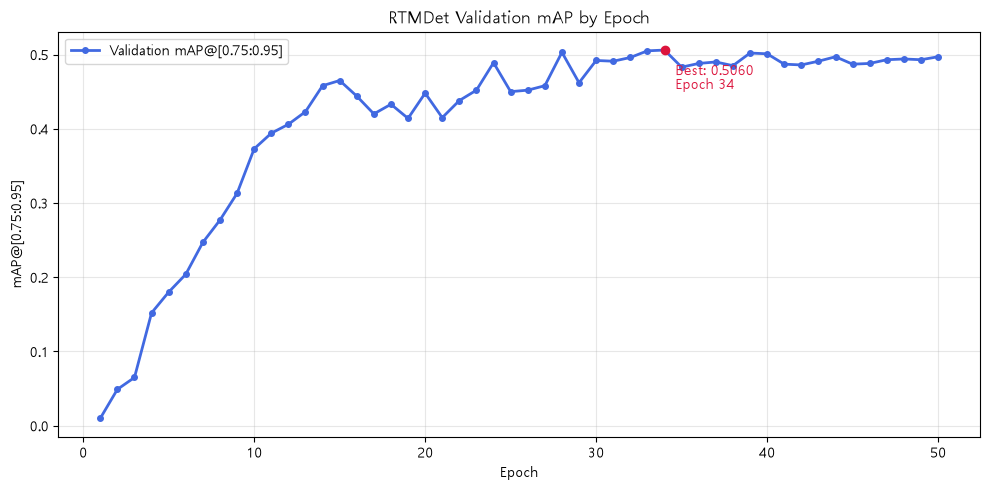

Best mAP@[0.75:0.95]: 0.5060 (Epoch 34)


In [35]:
epochs = range(1, len(map_history) + 1)

plt.figure(figsize=(10, 5))
plt.plot(
    epochs,
    map_history,
    marker="o",
    markersize=4,
    linewidth=2,
    color="royalblue",
    label="Validation mAP@[0.75:0.95]",
)

best_epoch = int(np.argmax(map_history)) + 1
best_map = max(map_history)

plt.scatter(best_epoch, best_map, color="crimson", zorder=3)
plt.annotate(
    f"Best: {best_map:.4f}\nEpoch {best_epoch}",
    xy=(best_epoch, best_map),
    xytext=(8, -28),
    textcoords="offset points",
    color="crimson",
)

plt.xlabel("Epoch")
plt.ylabel("mAP@[0.75:0.95]")
plt.title("RTMDet Validation mAP by Epoch")
plt.grid(alpha=0.3)
plt.legend()
plt.tight_layout()
plt.show()

print(f"Best mAP@[0.75:0.95]: {best_map:.4f} (Epoch {best_epoch})")

In [36]:
#@title Test 이미지 추론 + 제출용 CSV 생성
from mmdet.apis import init_detector, inference_detector

# 1. 학습된 best 체크포인트 자동 탐색
work_dir = cfg.work_dir
ckpt_candidates = glob.glob(os.path.join(work_dir, "best_coco_bbox_mAP_epoch_*.pth"))

if ckpt_candidates:
    best_ckpt = max(ckpt_candidates, key=os.path.getmtime)  # 여러 개면 가장 최근 것
else:
    last_ckpt_file = os.path.join(work_dir, "last_checkpoint")
    with open(last_ckpt_file, "r", encoding="utf-8") as f:
        best_ckpt = f.read().strip()

print("사용할 체크포인트:", best_ckpt)

# 2. 추론용 모델 로드 (학습 시 저장해둔 최종 config 사용)
model = init_detector("rtmdet_l_pill_config.py", best_ckpt, device="cuda:0")

# 3. 모델의 class index(0-based) -> 실제 category_id 매핑
#    categories는 category_id 오름차순으로 정렬돼 있고, classes도 같은 순서로 만들어짐
class_idx_to_category_id = {i: cat["id"] for i, cat in enumerate(categories)}

# 4. test 이미지 목록 (파일명 숫자 기준 정렬)
test_dir = os.path.join(path, "test_images")
test_image_paths = sorted(
    glob.glob(os.path.join(test_dir, "*.png")),
    key=lambda p: int(os.path.splitext(os.path.basename(p))[0])
)

print(f"Test 이미지 수: {len(test_image_paths)}")

MAX_OBJECTS_PER_IMAGE = 4  # "최대 4개의 알약" 조건
SCORE_THRESHOLD = 0.05

rows = []
annotation_id = 1

for img_path in tqdm(test_image_paths, desc="추론 중"):
    image_id = int(os.path.splitext(os.path.basename(img_path))[0])

    result = inference_detector(model, img_path)
    pred = result.pred_instances

    bboxes = pred.bboxes.cpu().numpy()   # [x1, y1, x2, y2]
    scores = pred.scores.cpu().numpy()
    labels = pred.labels.cpu().numpy()

    # 점수 내림차순 정렬 후 threshold 적용
    order = np.argsort(-scores)
    bboxes, scores, labels = bboxes[order], scores[order], labels[order]

    keep = scores >= SCORE_THRESHOLD
    bboxes, scores, labels = bboxes[keep], scores[keep], labels[keep]

    # 이미지당 최대 4개까지만 (점수 높은 순)
    bboxes = bboxes[:MAX_OBJECTS_PER_IMAGE]
    scores = scores[:MAX_OBJECTS_PER_IMAGE]
    labels = labels[:MAX_OBJECTS_PER_IMAGE]

    for bbox, score, label in zip(bboxes, scores, labels):
        x1, y1, x2, y2 = bbox
        bbox_x, bbox_y = float(x1), float(y1)
        bbox_w, bbox_h = float(x2 - x1), float(y2 - y1)

        rows.append({
            "annotation_id": annotation_id,
            "image_id": image_id,
            "category_id": class_idx_to_category_id[int(label)],
            "bbox_x": round(bbox_x, 2),
            "bbox_y": round(bbox_y, 2),
            "bbox_w": round(bbox_w, 2),
            "bbox_h": round(bbox_h, 2),
            "score": round(float(score), 4),
        })
        annotation_id += 1

# 5. CSV 저장
submission_path = "submission.csv"

with open(submission_path, "w", newline="", encoding="utf-8") as f:
    writer = csv.DictWriter(
        f,
        fieldnames=["annotation_id", "image_id", "category_id", "bbox_x", "bbox_y", "bbox_w", "bbox_h", "score"]
    )
    writer.writeheader()
    writer.writerows(rows)

print(f"제출 파일 저장 완료: {submission_path} (총 {len(rows)}행)")

사용할 체크포인트: work_dirs/rtmdet_l_pill\best_coco_bbox_mAP_epoch_34.pth
Loads checkpoint by local backend from path: work_dirs/rtmdet_l_pill\best_coco_bbox_mAP_epoch_34.pth
Test 이미지 수: 842


추론 중:   0%|          | 0/842 [00:00<?, ?it/s]

제출 파일 저장 완료: submission.csv (총 3368행)


In [37]:
#@title Test 이미지 목록 준비

import os
import glob
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.patches as patches
from tqdm.auto import tqdm

test_dir = os.path.join(path, "test_images")

test_image_paths = sorted(
    glob.glob(os.path.join(test_dir, "*.png")),
    key=lambda p: int(os.path.splitext(os.path.basename(p))[0])
)

print(f"Test 이미지 수: {len(test_image_paths)}")

Test 이미지 수: 842


In [38]:
#@title Define method : visualize_prediction_rtmDet

def visualize_prediction_rtmdet(img_path, prediction, classes, score_thresh=0.5):
    """
    img_path: 원본 이미지 경로
    prediction: inference_detector(model, img_path)의 result.pred_instances
    classes: RTMDet의 label index(0-based) -> 약 이름 리스트
    """
    image = plt.imread(img_path)

    bboxes = prediction.bboxes.cpu().numpy()  # [x1, y1, x2, y2]
    scores = prediction.scores.cpu().numpy()
    labels = prediction.labels.cpu().numpy()

    fig, ax = plt.subplots(figsize=(8, 8))
    ax.imshow(image)

    for bbox, label, score in zip(bboxes, labels, scores):
        if score < score_thresh:
            continue

        x1, y1, x2, y2 = bbox
        width, height = x2 - x1, y2 - y1

        rect = patches.Rectangle(
            (x1, y1), width, height,
            linewidth=2, edgecolor="red", facecolor="none"
        )
        ax.add_patch(rect)

        # RTMDet label은 0-based이므로 classes[label]로 바로 매핑
        class_name = classes[int(label)]
        ax.text(
            x1, max(y1 - 5, 0),
            f"{class_name} ({score:.2f})",
            color="white", fontsize=9,
            bbox=dict(facecolor="red", alpha=0.6, pad=1)
        )

    ax.axis("off")
    plt.show()

Loads checkpoint by local backend from path: work_dirs/rtmdet_l_pill\best_coco_bbox_mAP_epoch_34.pth


Test Inference:   0%|          | 0/20 [00:00<?, ?it/s]

파일명: 1


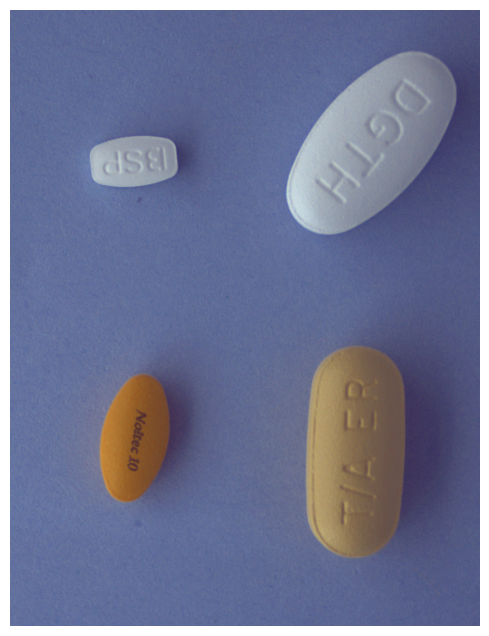

파일명: 3


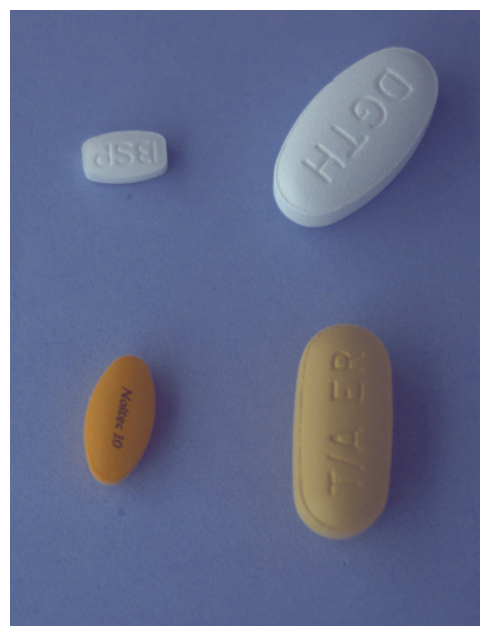

파일명: 4


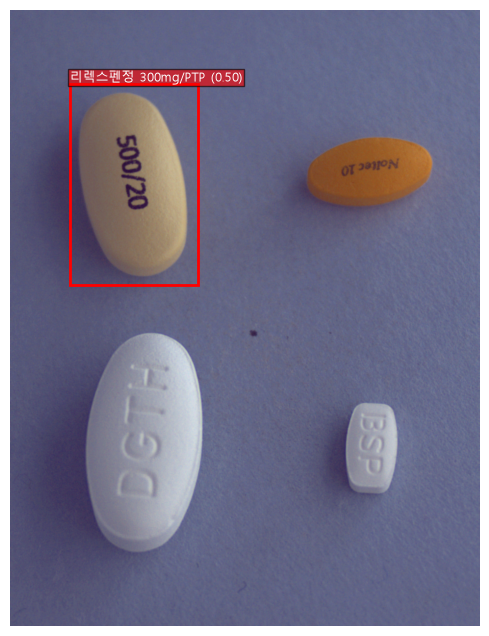

파일명: 5


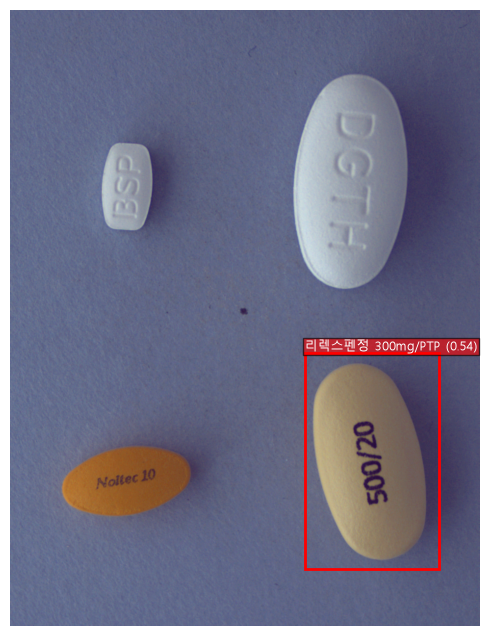

파일명: 8


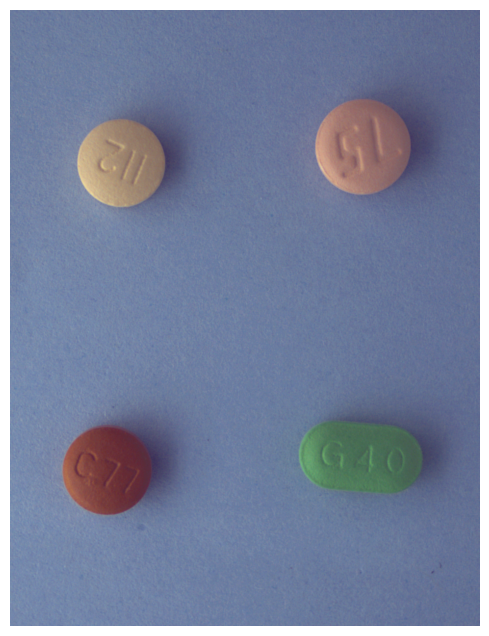

파일명: 9


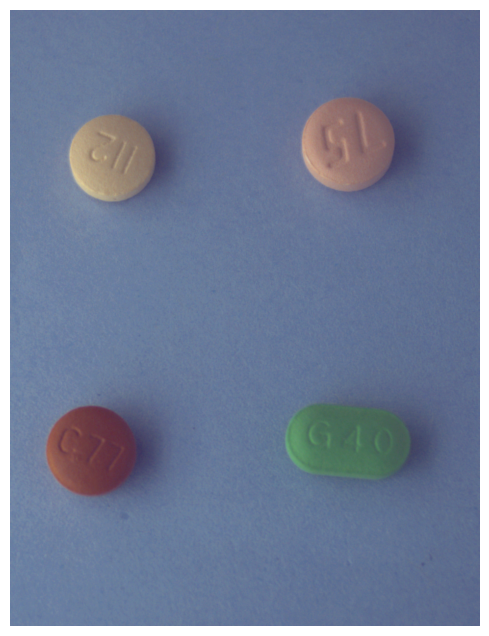

파일명: 10


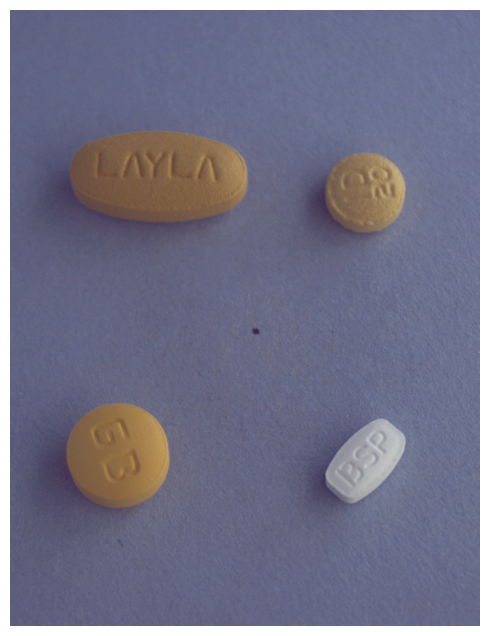

파일명: 13


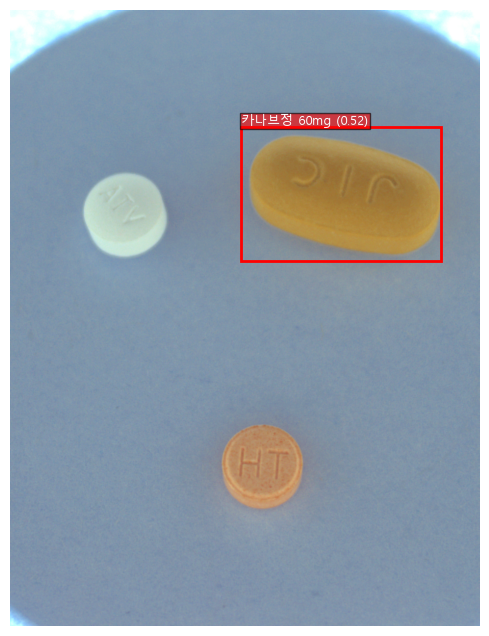

파일명: 15


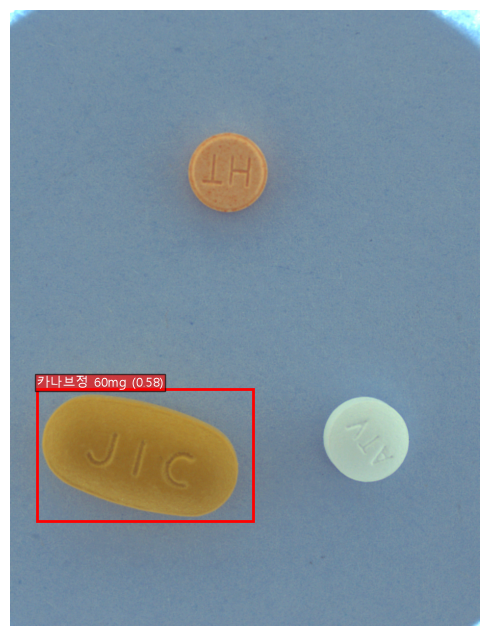

파일명: 17


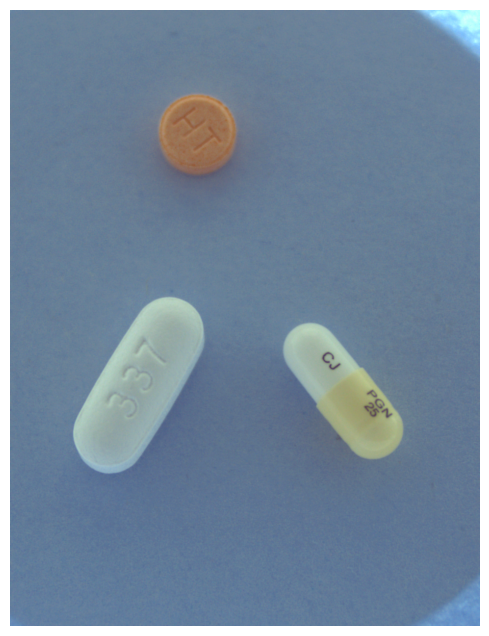

파일명: 19


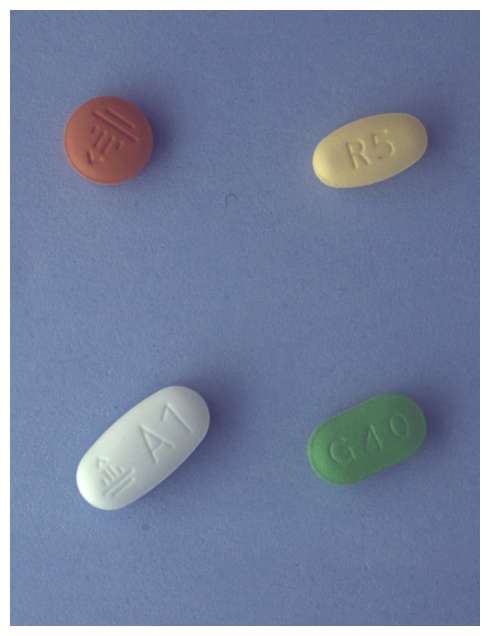

파일명: 23


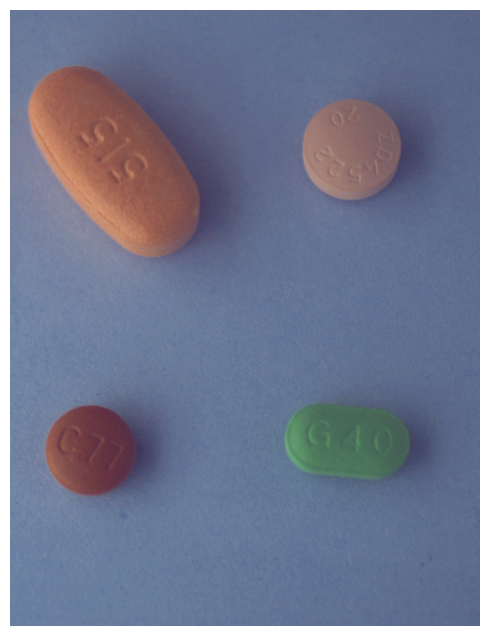

파일명: 24


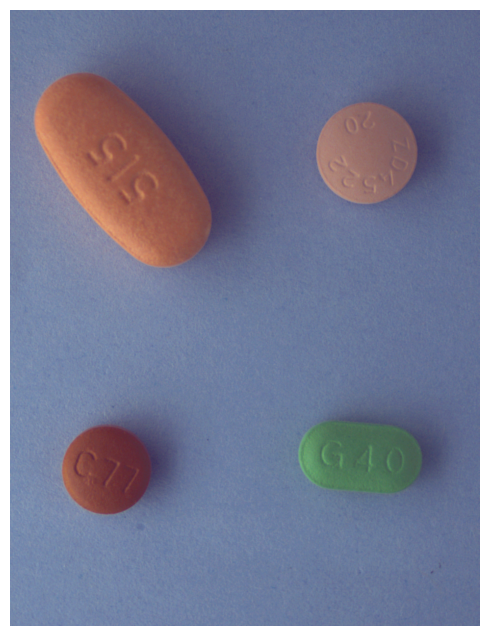

파일명: 27


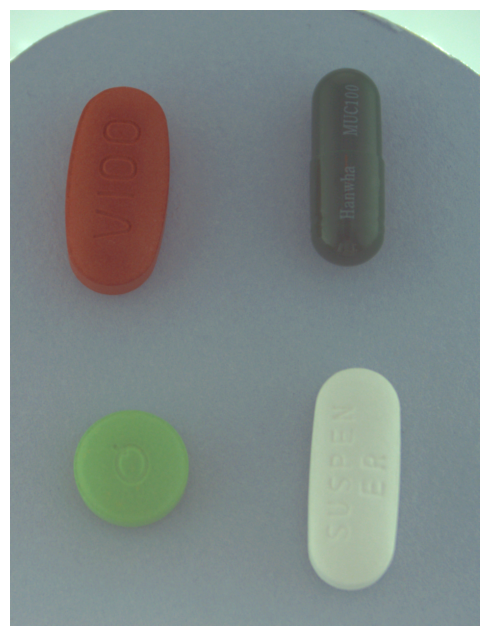

파일명: 28


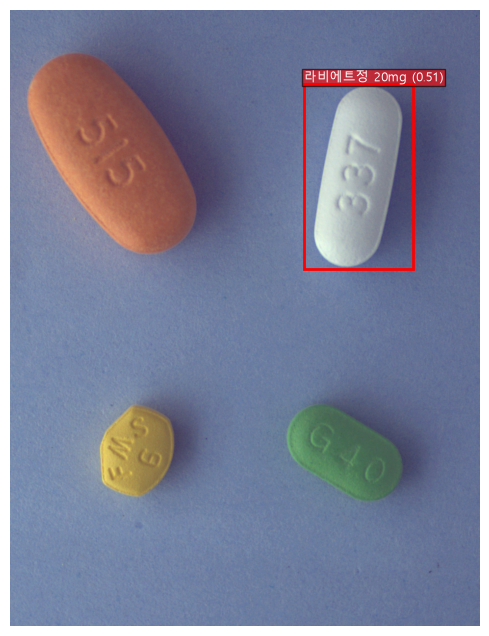

파일명: 29


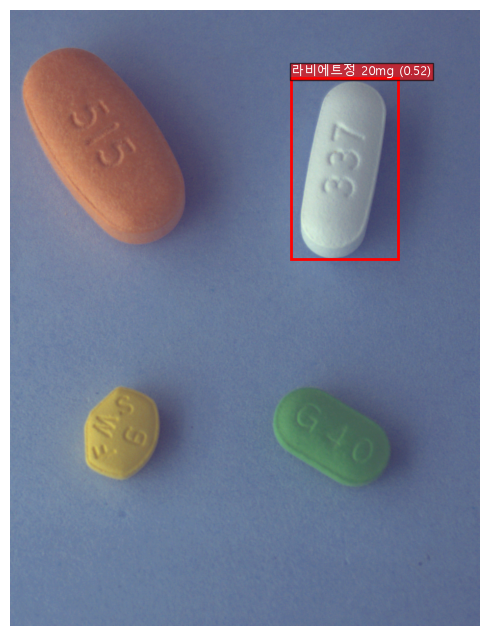

파일명: 31


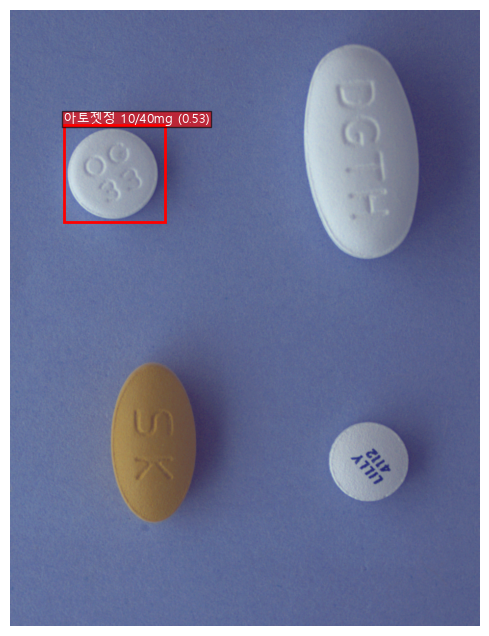

파일명: 32


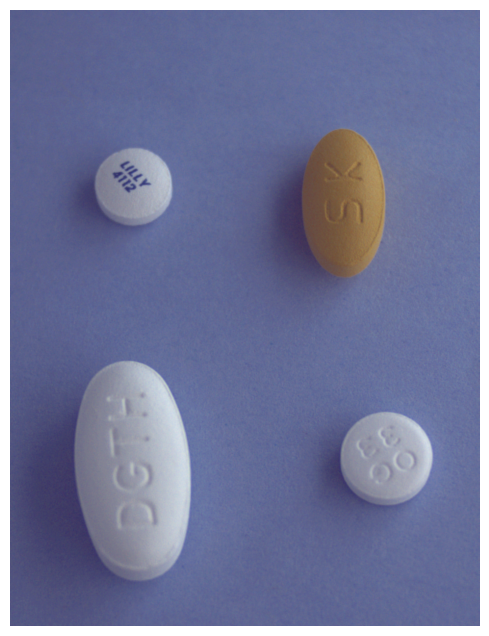

파일명: 38


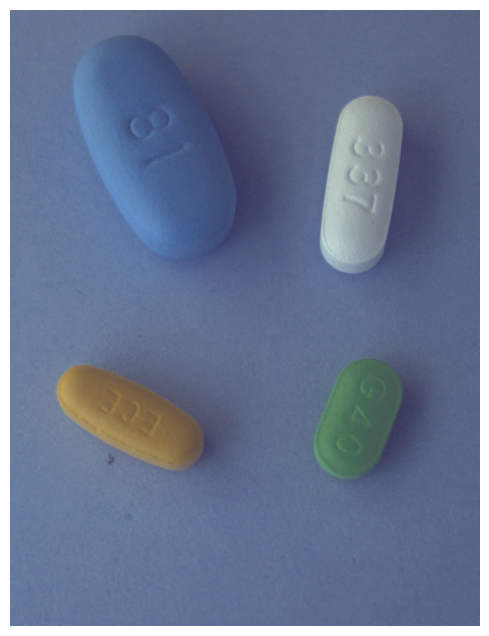

파일명: 40


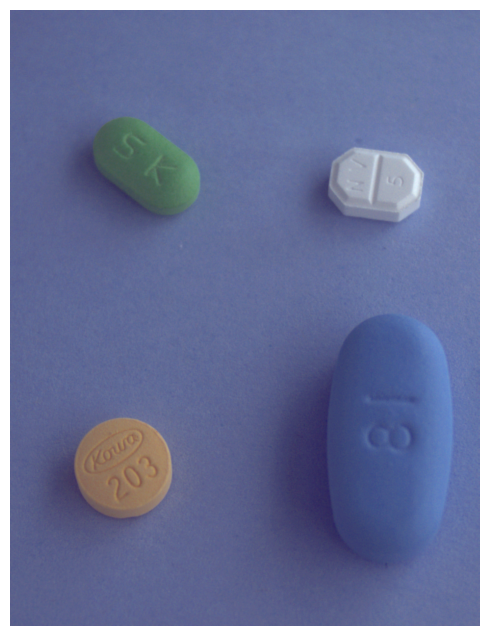

In [39]:
#@title Test 이미지 20장 추론 및 시각화

from mmdet.apis import init_detector, inference_detector

# 이미 model이 로드되어 있다면 이 줄은 생략 가능
model = init_detector("rtmdet_l_pill_config.py", best_ckpt, device="cuda:0")

SCORE_THRESHOLD = 0.5

for img_path in tqdm(test_image_paths[:20], desc="Test Inference"):
    stem = os.path.splitext(os.path.basename(img_path))[0]

    result = inference_detector(model, img_path)
    pred = result.pred_instances

    print(f"파일명: {stem}")
    visualize_prediction_rtmdet(
        img_path,
        pred,
        classes=classes,
        score_thresh=SCORE_THRESHOLD
    )